In [63]:
%matplotlib notebook
from pathlib import Path
import pandas as pd
import anndata as ad
from matplotlib import pyplot as plt
import numpy as np
from sklearn.neighbors import KernelDensity
import os

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
os.getcwd()

'C:\\Users\\raymond.sanchez\\Downloads\\celltype_cards_spatial-main\\notebooks'

## 1. Download Data
I obtained this dropbox link from Cindy van Velthoven, who got it from Meng Zhang in the Zhuang Lab (data generators)

[Dropbox Link including cell_metadata_final.csv](https://www.dropbox.com/sh/2h6wwbkm3aagxu8/AAAifwZL7U9fcq3k1WWoIgXKa?dl=0)

[Dropbox link to  cell x gene h5ad file (300MB)](https://www.dropbox.com/sh/2h6wwbkm3aagxu8/AAC0cLUN6ifGEenOc36woJ4Fa/counts.h5ad?dl=0)

I'll use local copies below

In [188]:
MOp_MERFISH_metadata_path = Path("C:\\Users\\raymond.sanchez\\Downloads\\cell_metadata_final.csv")

MOp_MERFISH_cellxgene_path = Path("C:\\Users\\raymond.sanchez\\Downloads\\counts.h5ad")

In [189]:
cbg_ad = ad.read_h5ad(MOp_MERFISH_cellxgene_path)

In [190]:
tdf = pd.read_csv(MOp_MERFISH_metadata_path)
tdf.head(10)

,X1,fovID,fov_x,fov_y,volume,center_x,center_y,slice_id,sample_id,AP_distance,soma_depth,label,subclass,class_label,normalized_depth,subclass_color
0,1.000014e+37,13,4539.310,2986.899,992.830060,4738.397298,3075.327399,mouse2_slice31,dataset2_sample4,400,959.227100,Astro_1,Astrocyte,Non-Neuronal,0.712121,#665C47
1,1.000018e+38,290,-4016.860,1404.780,610.091871,-3964.711404,1451.889047,mouse2_slice160,dataset2_sample5,1690,1246.938980,Endo,Endothelial,Non-Neural,0.925716,#8D6C62
2,1.000069e+38,113,750.406,1143.102,148.277718,805.843523,1215.035473,mouse2_slice109,dataset2_sample6,1180,7.369782,SMC,SMC,Non-Neural,0.005471,#807059
3,1.000072e+38,432,1262.680,-3752.030,249.515471,1348.686198,-3589.955255,mouse1_slice71,dataset1_sample2,700,1123.956211,Endo,Endothelial,Non-Neural,0.834414,#8D6C62
4,1.000093e+38,354,-3627.450,-1987.730,1779.831996,-3584.650904,-1883.105955,mouse2_slice219,dataset2_sample5,2280,324.069916,L23_IT_3,L2-3 IT,Glutamatergic,0.240586,#C4EC04
5,1.000107e+38,371,-2118.876,-201.836,775.943203,-2028.465155,-83.155257,mouse2_slice289,dataset2_sample6,2980,17.630649,VLMC,VLMC,Non-Neural,0.013089,#697255
6,1.000139e+38,381,-1077.160,1294.320,1054.872712,-1039.703952,1351.852047,mouse1_slice313,dataset1_sample6,3120,956.666854,L6_CT_1,L6 CT,Glutamatergic,0.710220,#2D8CB8
7,1.000175e+38,430,5599.161,-678.238,487.182173,5751.425690,-459.415195,mouse2_slice309,dataset2_sample2,3180,444.540991,L45_IT_1,L4-5 IT,Glutamatergic,0.330023,#09CCC6
8,1.000185e+38,352,-3627.450,-2387.730,1020.683319,-3583.620154,-2208.783457,mouse2_slice219,dataset2_sample5,2280,624.303070,L45_IT_SSp_2,L4-5 IT,Glutamatergic,0.463477,#09CCC6
9,1.000185e+38,511,3063.350,-2802.390,374.479721,3150.850899,-2715.925405,mouse1_slice153,dataset1_sample3,1520,1586.834867,Peri,Pericyte,Non-Neural,1.178051,#665547


## 2. Data structure and notes:
- this has cell metadata from multiple sections in 2 mice
- each cell has a unique identifier
- use the deprecated "PT" nomenclature for L5_ET types
- useful data: `normalized_depth`, `AP_distance`, `label` and `subclass` 
- the MERFISH data has 2 clusters that map to the 2 Chandelier Cell clusters, `Pvalb_12` and `Pvalb_11`.  I'll make a new column to indicate chandelier cells as members of either cluster

In [168]:
tdf["chandelier_cluster"] = np.logical_or(tdf["label"]=="Pvalb_11",tdf["label"]=="Pvalb_12")


In [191]:
print("slice_id values:\n")
print(tdf.slice_id.unique())
print("\n subclass names:\n")
print(tdf.subclass.unique())
print("\n class names:\n")
print(tdf.class_label.unique())
print("\n cluster names:\n")
print(tdf.label.unique())

slice_id values:

['mouse2_slice31' 'mouse2_slice160' 'mouse2_slice109' 'mouse1_slice71'
 'mouse2_slice219' 'mouse2_slice289' 'mouse1_slice313' 'mouse2_slice309'
 'mouse1_slice153' 'mouse1_slice201' 'mouse2_slice61' 'mouse1_slice40'
 'mouse1_slice1' 'mouse2_slice1' 'mouse2_slice151' 'mouse1_slice102'
 'mouse1_slice162' 'mouse1_slice221' 'mouse1_slice200' 'mouse2_slice300'
 'mouse2_slice90' 'mouse1_slice283' 'mouse1_slice326' 'mouse2_slice209'
 'mouse1_slice50' 'mouse1_slice112' 'mouse1_slice212' 'mouse1_slice271'
 'mouse2_slice119' 'mouse1_slice291' 'mouse2_slice169' 'mouse1_slice31'
 'mouse2_slice280' 'mouse1_slice232' 'mouse1_slice10' 'mouse1_slice241'
 'mouse1_slice251' 'mouse2_slice99' 'mouse1_slice190' 'mouse2_slice319'
 'mouse2_slice189' 'mouse1_slice81' 'mouse2_slice249' 'mouse2_slice139'
 'mouse1_slice21' 'mouse2_slice129' 'mouse2_slice79' 'mouse2_slice229'
 'mouse1_slice131' 'mouse1_slice122' 'mouse1_slice62' 'mouse2_slice270'
 'mouse2_slice10' 'mouse1_slice180' 'mouse1_slice1

## 3. Plotting!
### My favorite way of visualizing this so far is a plot showing
- Total number of GABAergic, Glutamatergic and "Other" cells as a function of depth
- The distribution of the cell type of interest as a fraction of its parent class ( GABAergic, Glutamatergic or "Other")

In [192]:

depth_bins = np.linspace(-0.01,1.1, 20)
tdf["depth_bin"] = pd.cut(tdf["normalized_depth"],depth_bins)
tvals =tdf.value_counts(subset=["class_label", "depth_bin" ],sort = False)
subclassvals =tdf.value_counts(subset=["subclass", "depth_bin" ],sort = False)

chand_vals  = tdf.value_counts(subset=["chandelier_cluster", "depth_bin"], sort = False)
clustervals = tdf.value_counts(subset=["label", 'depth_bin'], sort =False)

linestyles = [  'dotted', 'dashed', 'dashdot']

#vertical plots, so the depth coordinate is in y:
Y = depth_bins[:-1]
colors = tdf[['subclass', 'subclass_color']]
colors = colors.drop_duplicates()
#colors = colors[['subclass_color']]
colors

KeyError: 'chandelier_cluster'

In [62]:

plt.figure(figsize = [5,8])
X = (subclassvals["L5_PT"]/tvals["Glutamatergic"]).fillna(0)


cells_to_plot_name = "L5_PT"
parent_class_name = "Glutamatergic"





for ii,classname in  enumerate(tdf.class_label.unique()[::-1]):
    plt.plot( tvals[classname],Y, label  = classname, linestyle = linestyles[ii], color = 'grey' )
    plt.fill_between(Y, tvals[classname], color = 'lightgrey', alpha = 1)


#plt.axis('off')

#plt.gca().set_xlabel("cells in dataset")
#plt.gca().set_ylabel("normalized cortical depth")
plt.legend()
ax2 = plt.gca().twiny()


ax2.plot(X ,Y,label  = cells_to_plot_name+" fraction\nof "+parent_class_name+" Cells", color = 'red')
ax2.set_xlabel("fraction of "+parent_class_name+" Cells")
ax2.fill_betweenx(Y, X, color = "red", alpha = 0.3)

#plt.axis('off')

plt.gca().set(ylim = [np.max(depth_bins), np.min(depth_bins)-.1])
plt.legend()
plt.savefig(Path("../figures").joinpath( cells_to_plot_name + "_depth.png"))

<IPython.core.display.Javascript object>

In [50]:
tvals[classname]

depth_bin
(-0.01, 0.0484]    11798
(0.0484, 0.107]     7196
(0.107, 0.165]      4505
(0.165, 0.224]      4132
(0.224, 0.282]      4078
(0.282, 0.341]      4452
(0.341, 0.399]      4828
(0.399, 0.457]      4847
(0.457, 0.516]      4623
(0.516, 0.574]      4503
(0.574, 0.633]      4387
(0.633, 0.691]      4135
(0.691, 0.749]      3872
(0.749, 0.808]      3708
(0.808, 0.866]      3806
(0.866, 0.925]      3963
(0.925, 0.983]      4709
(0.983, 1.042]      5860
(1.042, 1.1]        6157
dtype: int64

In [45]:
plt.figure(figsize = [5,8])
X = (chand_vals[True]/tvals["GABAergic"]).fillna(0)

cells_to_plot_name = "Chandelier"
parent_class_name = "GABAergic"



for ii,classname in  enumerate(tdf.class_label.unique()[::-1]):
    plt.plot( tvals[classname],Y, label  = classname, linestyle = linestyles[ii], color = 'grey' )

plt.gca().set_xlabel("cells in dataset")
plt.gca().set_ylabel("normalized cortical depth")
plt.legend()
ax2 = plt.gca().twiny()


ax2.plot(X ,Y,label  = cells_to_plot_name+" fraction\nof "+parent_class_name+" Cells", color = 'red')
ax2.set_xlabel("fraction of "+parent_class_name+" Cells", color = "C0")
ax2.fill_betweenx(Y, X, color = "red", alpha = 0.3)


plt.gca().set(ylim = [np.max(depth_bins), np.min(depth_bins)-.1])
plt.legend()
plt.savefig(Path("../figures").joinpath( cells_to_plot_name + "_depth.png"))

<IPython.core.display.Javascript object>

# Based on these two examples and the spatial plots below, generate plots for all clusters

In [22]:
all_labels =np.unique([name[0] for name in clustervals.keys()])

glutamatergic = [name for name in all_labels if tdf[tdf.label==name].class_label.iloc[0] == "Glutamatergic"]
gabaergic = [name for name in all_labels if tdf[tdf.label==name].class_label.iloc[0] == "GABAergic"]
nonneuronal = [name for name in all_labels if tdf[tdf.label==name].class_label.iloc[0] == "Other"]
all_cell_labels = {"Glutamatergic":glutamatergic, "GABAergic":gabaergic,"Other": nonneuronal}




<IPython.core.display.Javascript object>


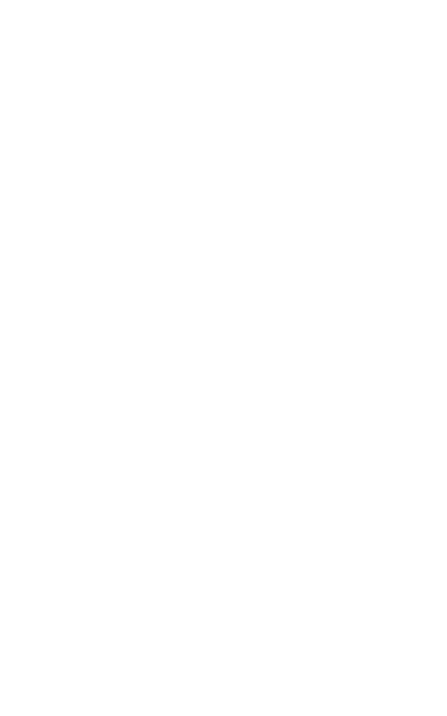

<IPython.core.display.Javascript object>


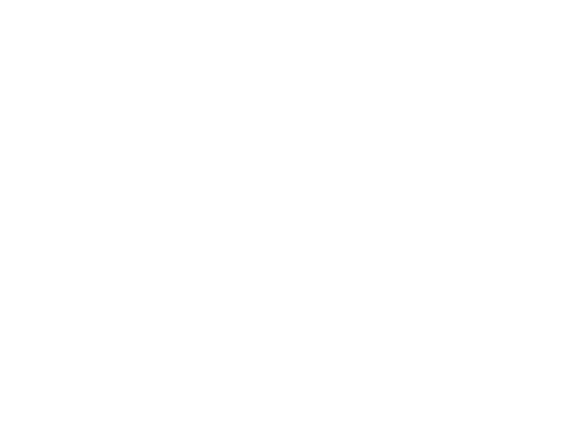

<IPython.core.display.Javascript object>


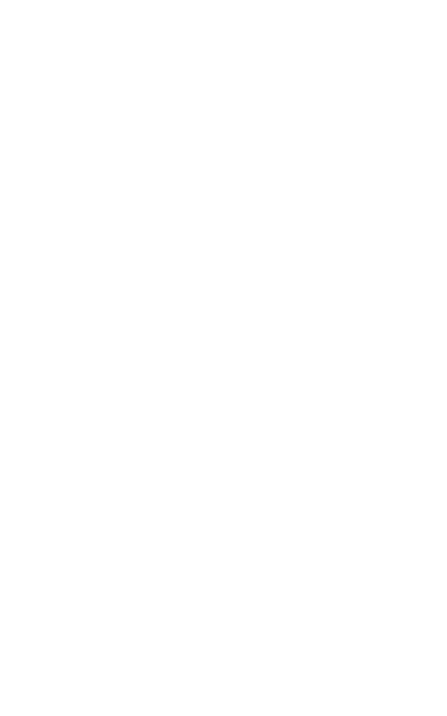

<IPython.core.display.Javascript object>


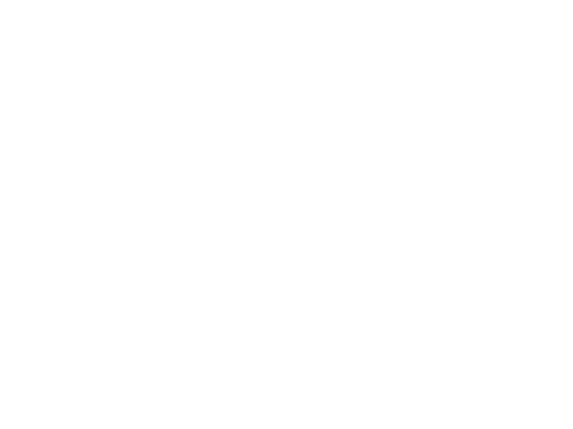

<IPython.core.display.Javascript object>


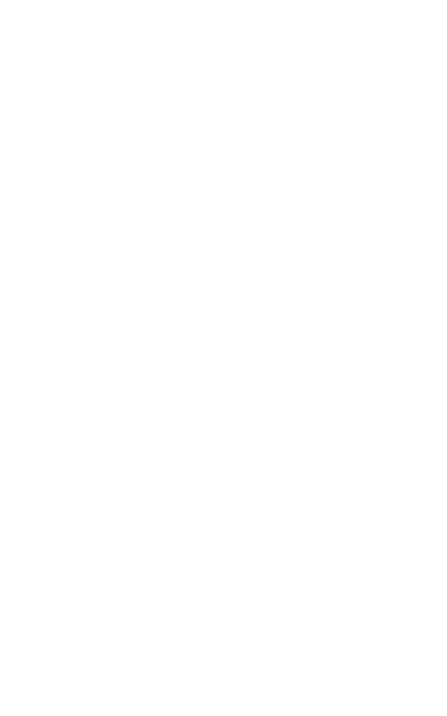

<IPython.core.display.Javascript object>


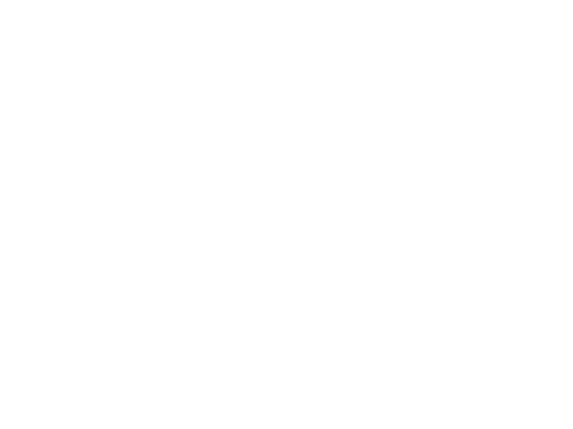

<IPython.core.display.Javascript object>


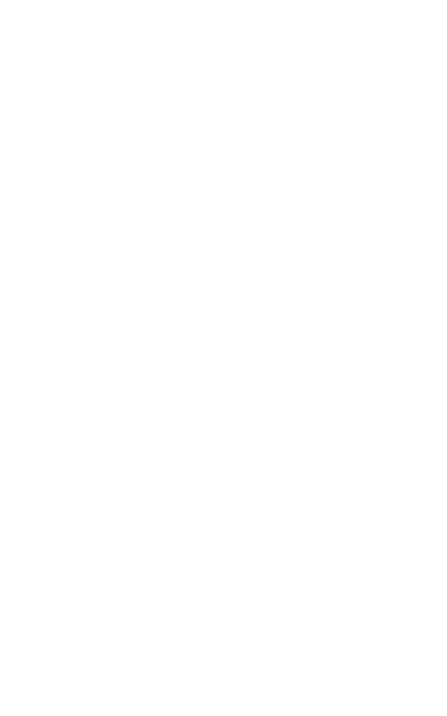

<IPython.core.display.Javascript object>


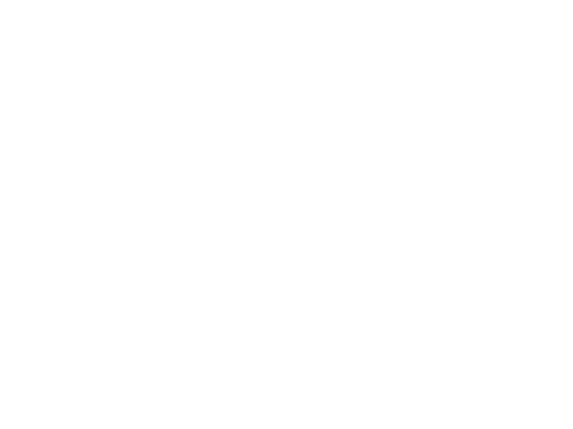

<IPython.core.display.Javascript object>


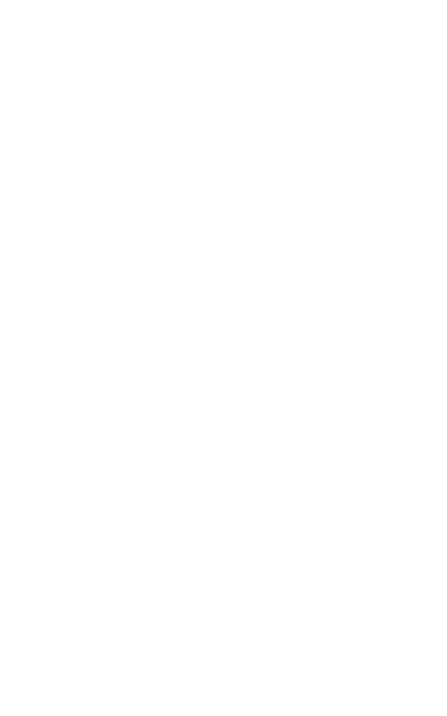

<IPython.core.display.Javascript object>


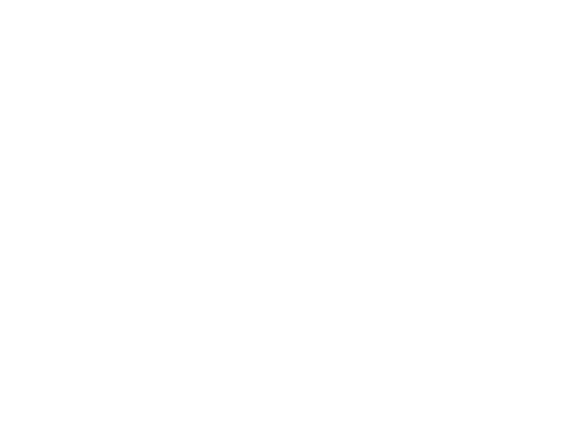

<IPython.core.display.Javascript object>


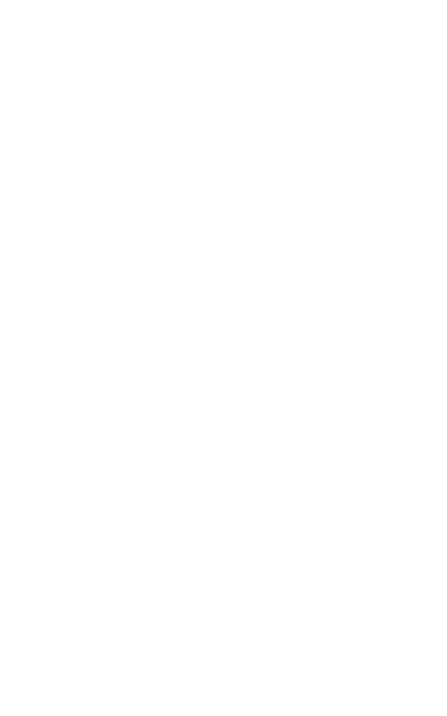

<IPython.core.display.Javascript object>


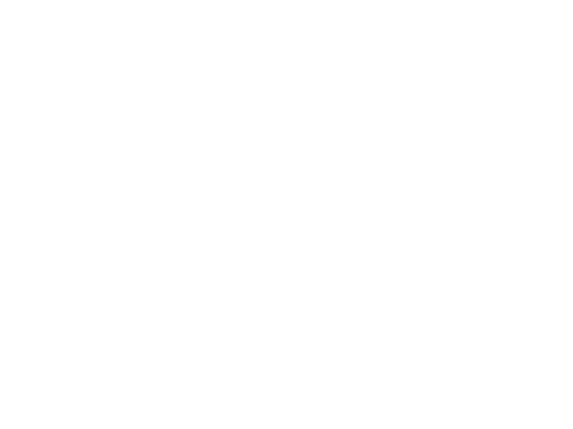

<IPython.core.display.Javascript object>


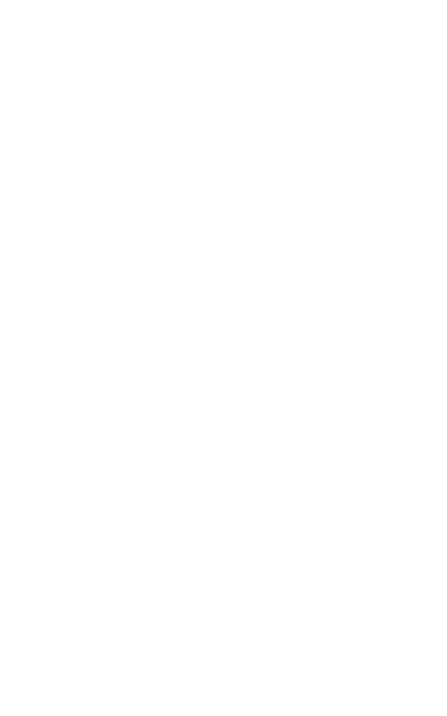

<IPython.core.display.Javascript object>


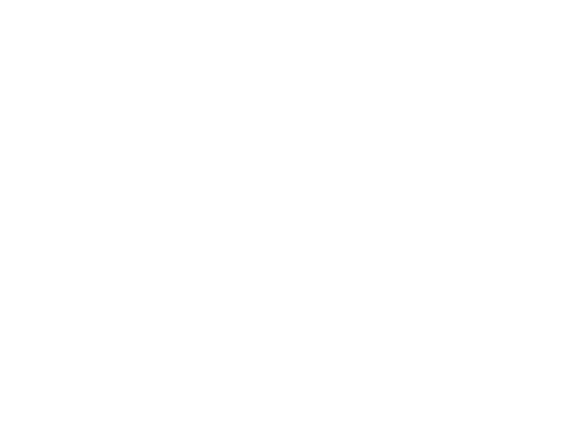

<IPython.core.display.Javascript object>


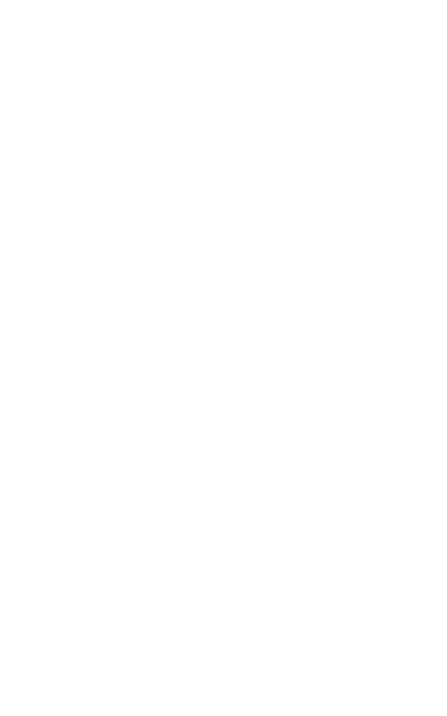

<IPython.core.display.Javascript object>


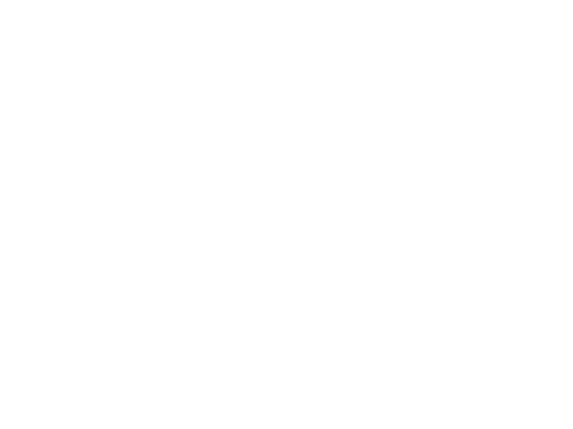

<IPython.core.display.Javascript object>


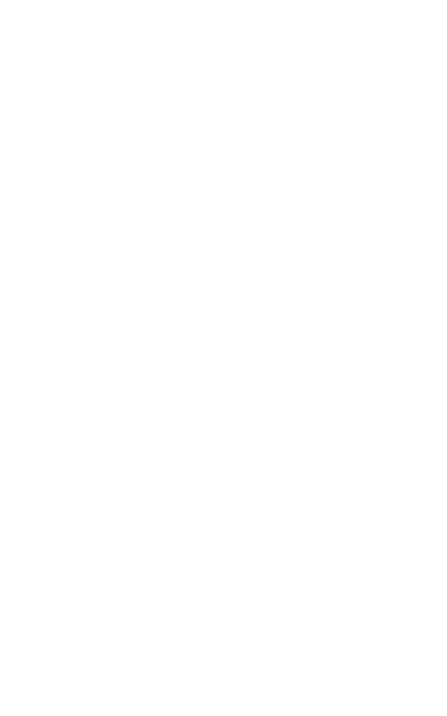

<IPython.core.display.Javascript object>


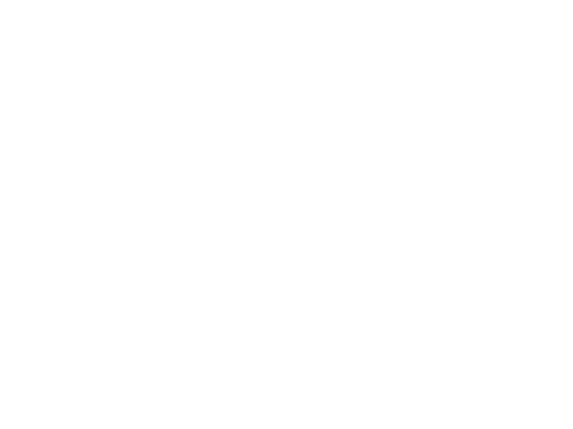

<IPython.core.display.Javascript object>


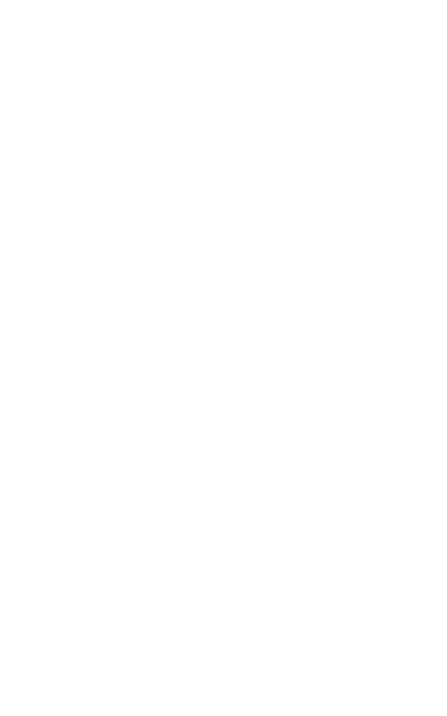

<IPython.core.display.Javascript object>


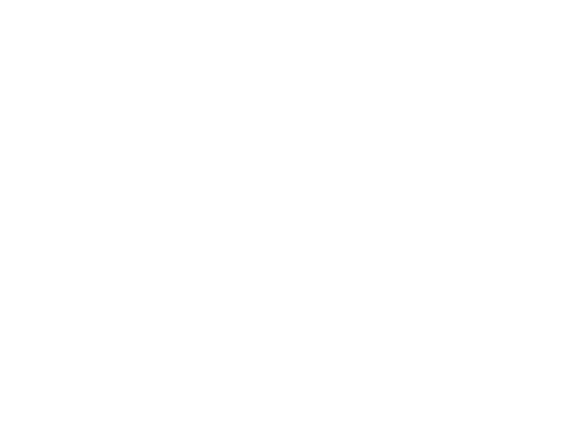

<IPython.core.display.Javascript object>


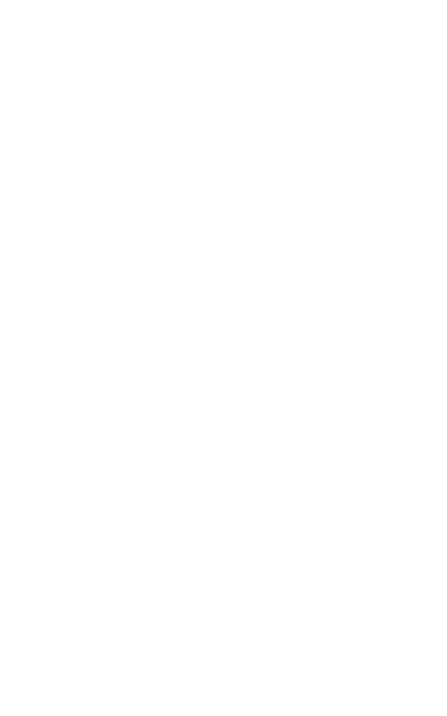

<IPython.core.display.Javascript object>


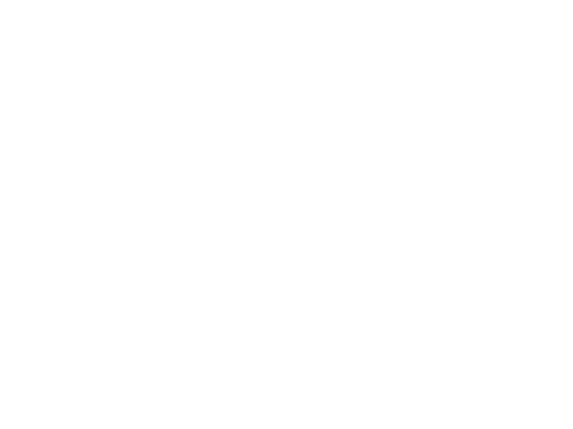

<IPython.core.display.Javascript object>


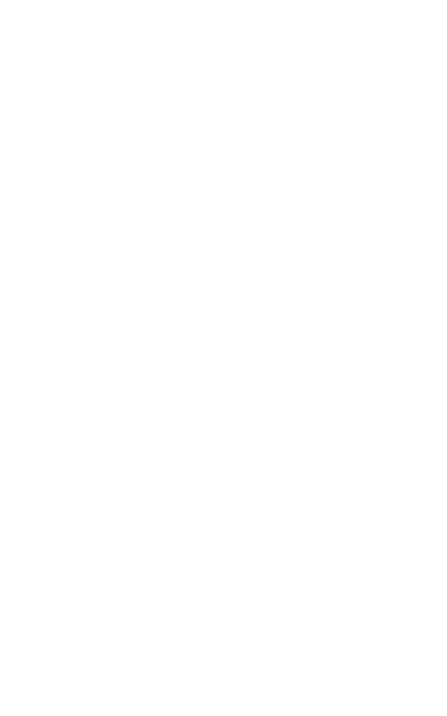

<IPython.core.display.Javascript object>


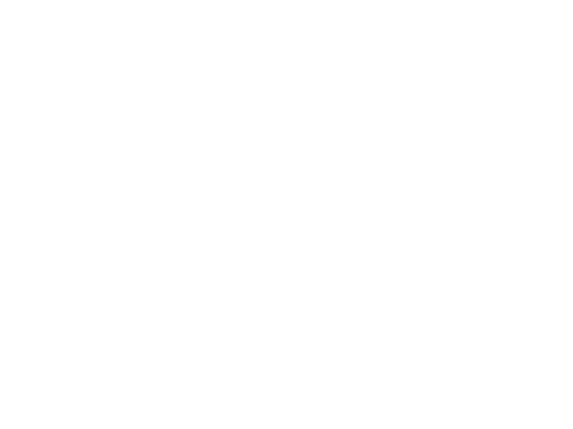

<IPython.core.display.Javascript object>


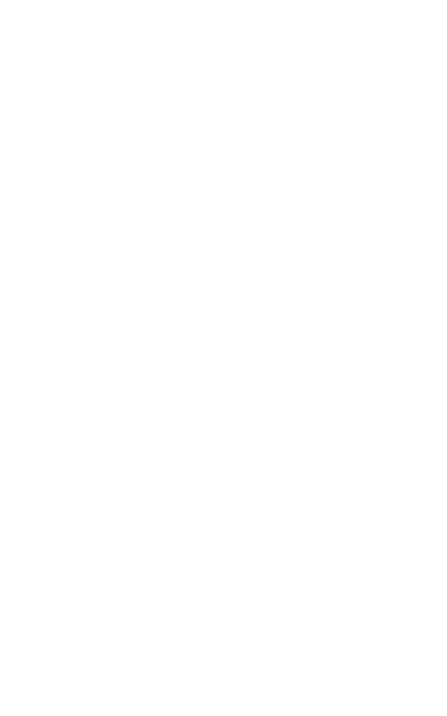

<IPython.core.display.Javascript object>


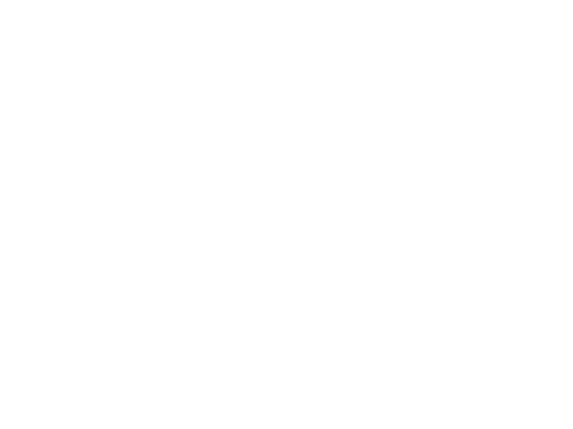

<IPython.core.display.Javascript object>


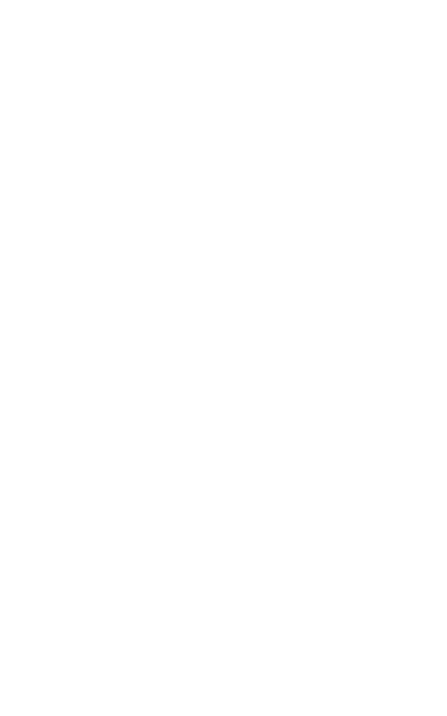

<IPython.core.display.Javascript object>


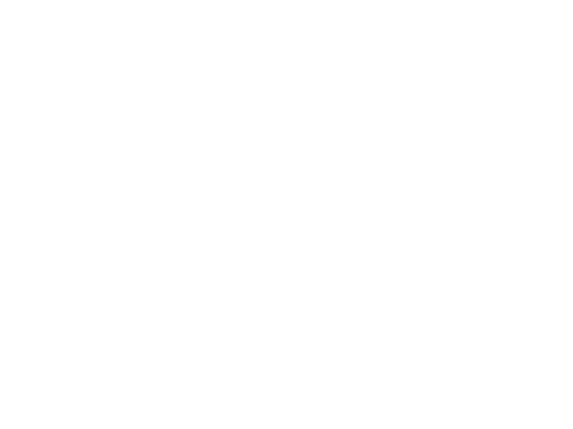

<IPython.core.display.Javascript object>


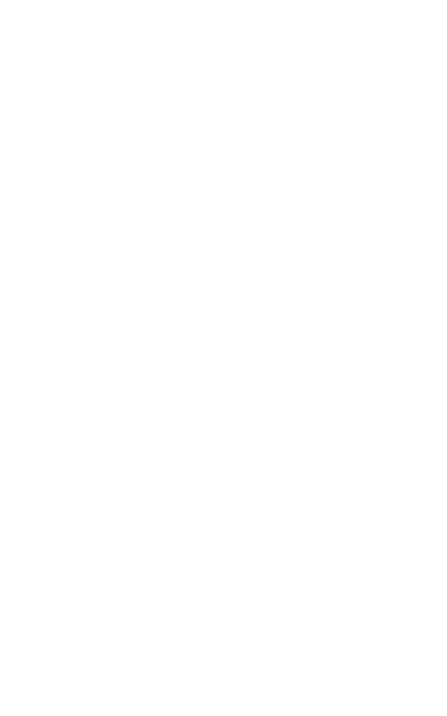

<IPython.core.display.Javascript object>


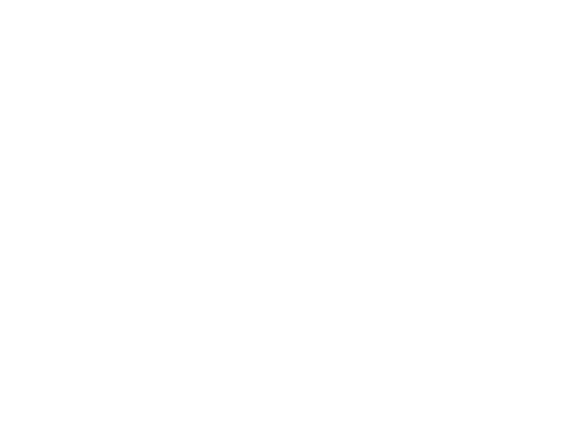

<IPython.core.display.Javascript object>


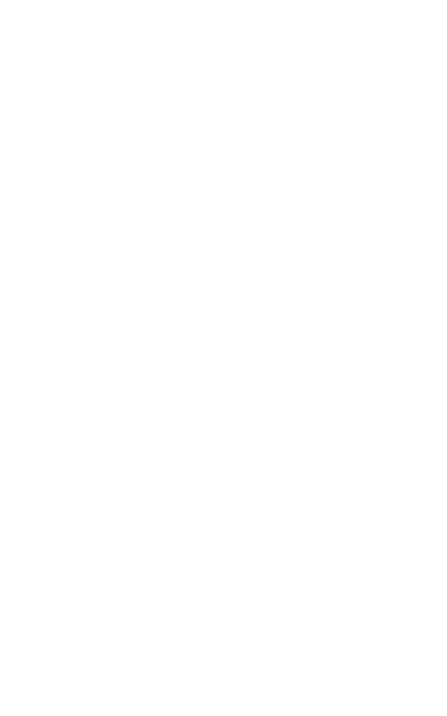

<IPython.core.display.Javascript object>


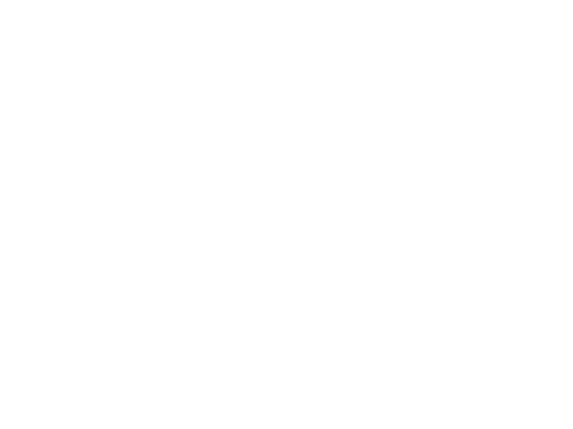

<IPython.core.display.Javascript object>


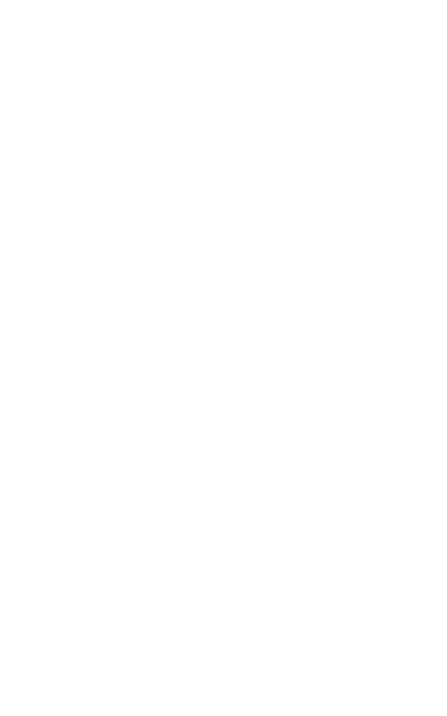

<IPython.core.display.Javascript object>


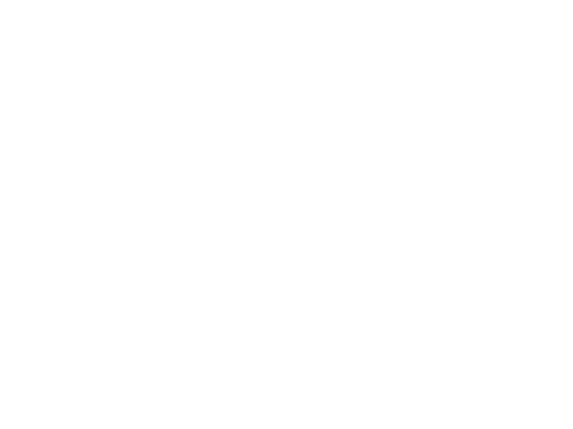

<IPython.core.display.Javascript object>


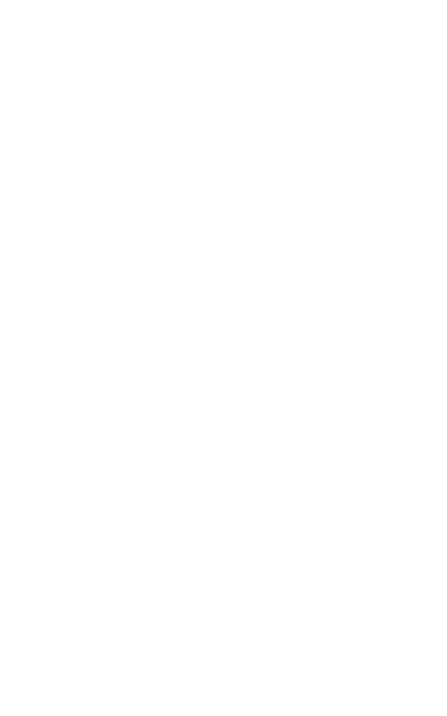

<IPython.core.display.Javascript object>


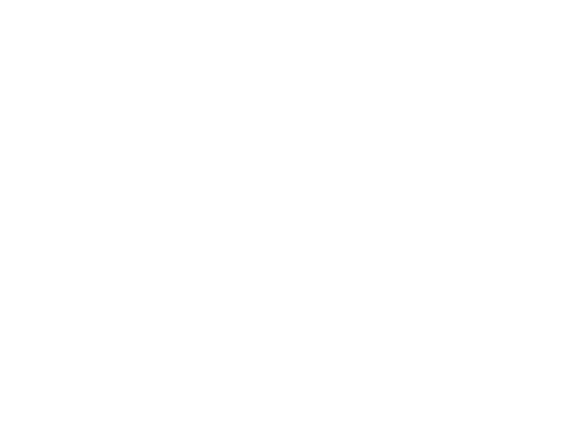

<IPython.core.display.Javascript object>


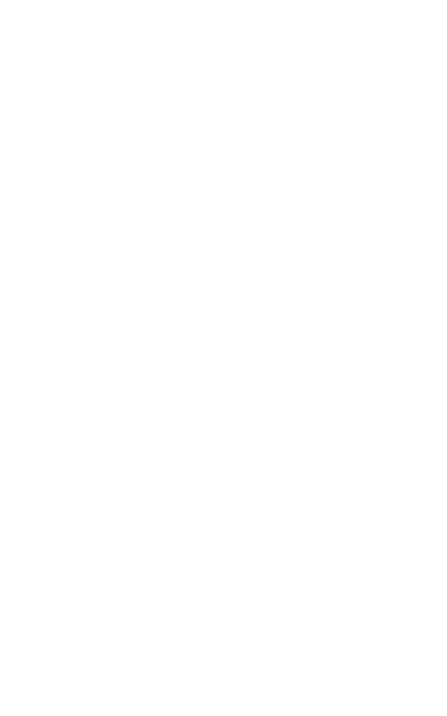

<IPython.core.display.Javascript object>


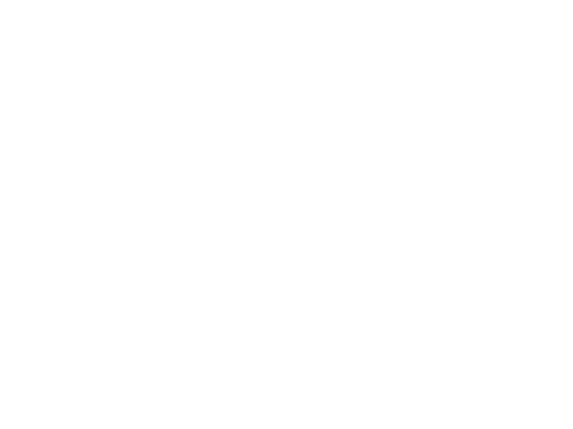

<IPython.core.display.Javascript object>


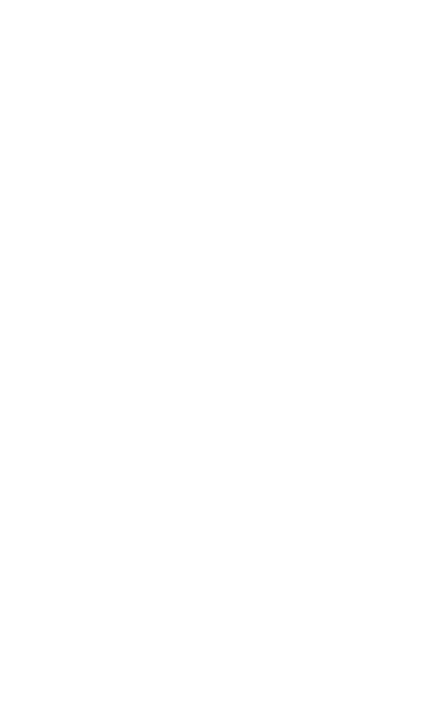

<IPython.core.display.Javascript object>


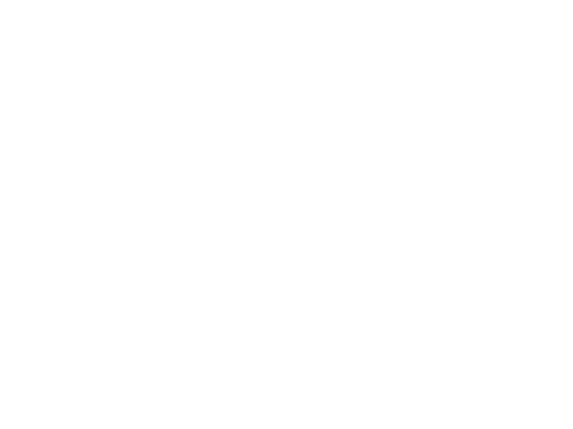

<IPython.core.display.Javascript object>


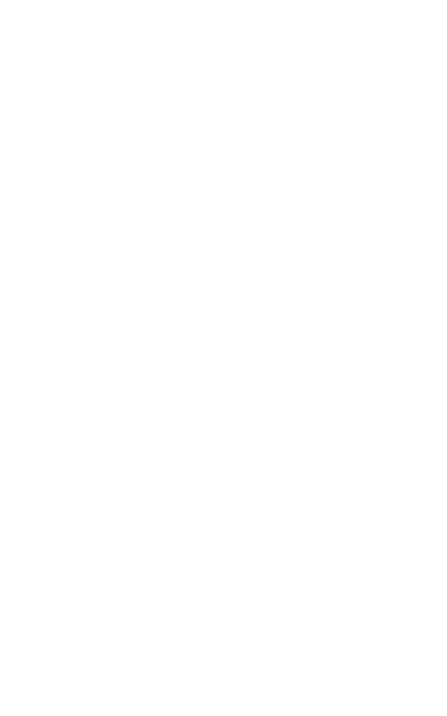

<IPython.core.display.Javascript object>


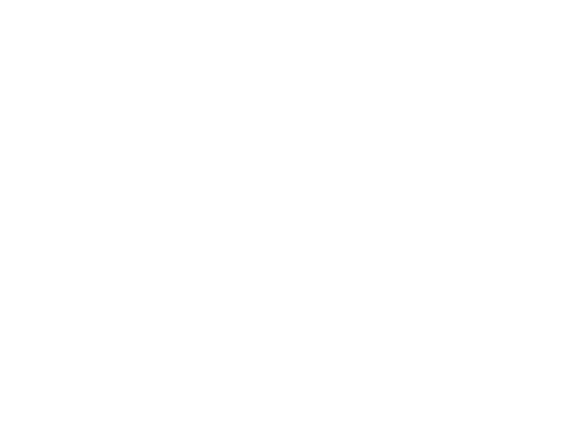

<IPython.core.display.Javascript object>


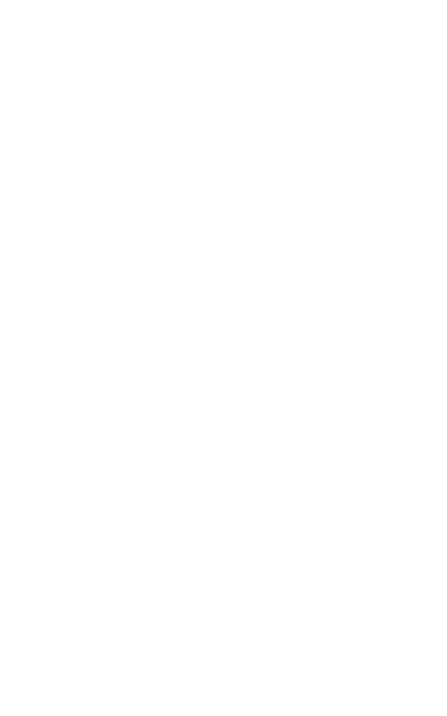

<IPython.core.display.Javascript object>


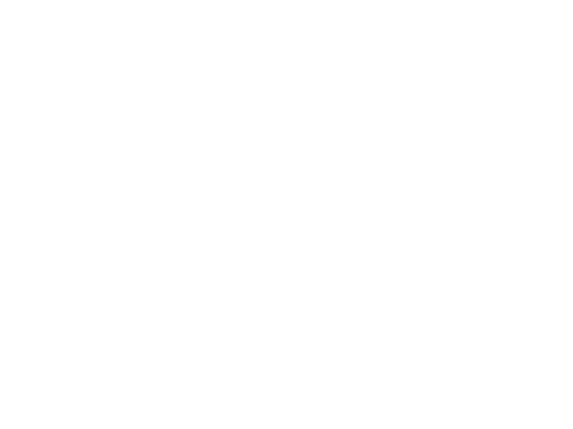

<IPython.core.display.Javascript object>


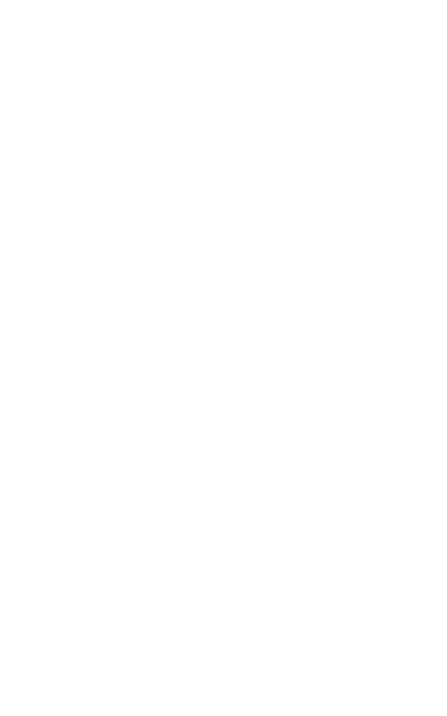

<IPython.core.display.Javascript object>


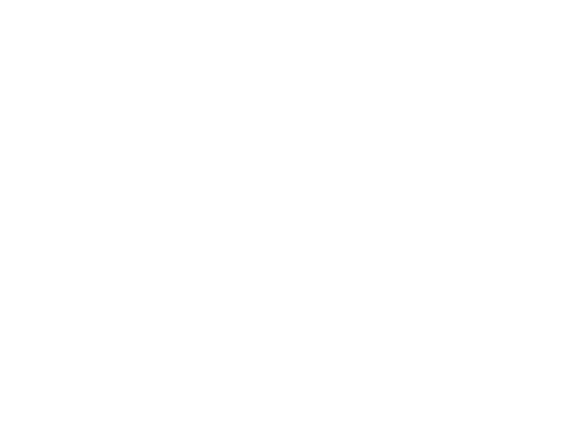

<IPython.core.display.Javascript object>


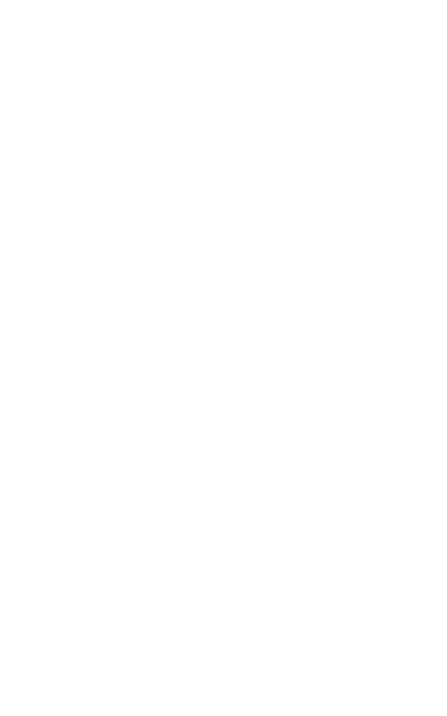

<IPython.core.display.Javascript object>


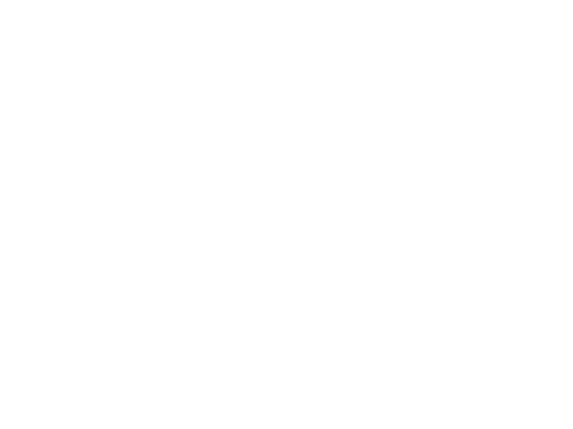

<IPython.core.display.Javascript object>


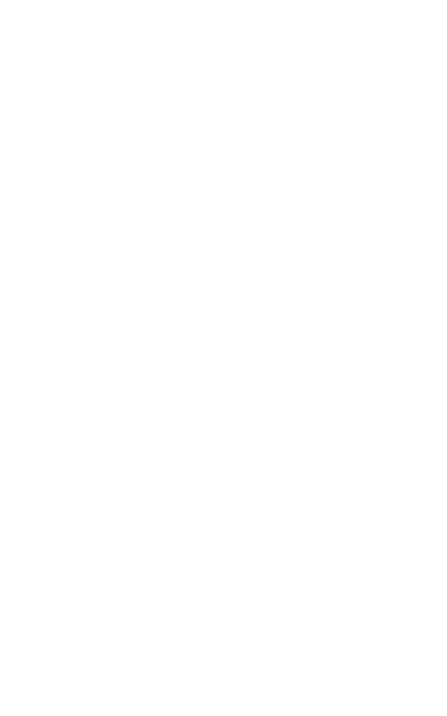

<IPython.core.display.Javascript object>


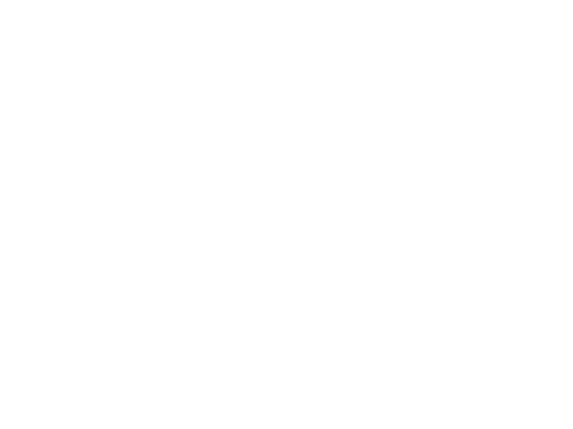

<IPython.core.display.Javascript object>


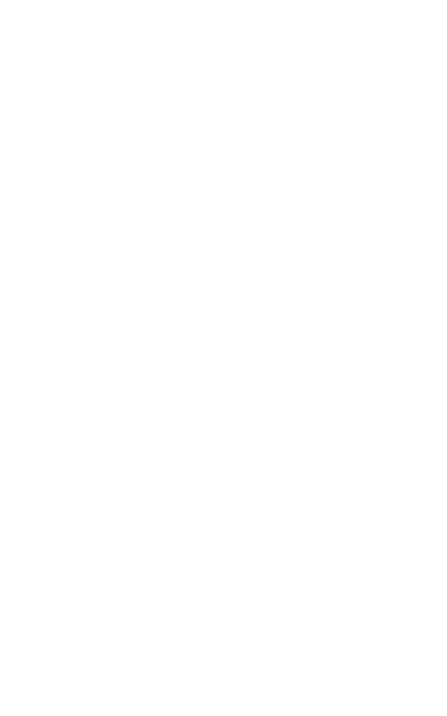

<IPython.core.display.Javascript object>


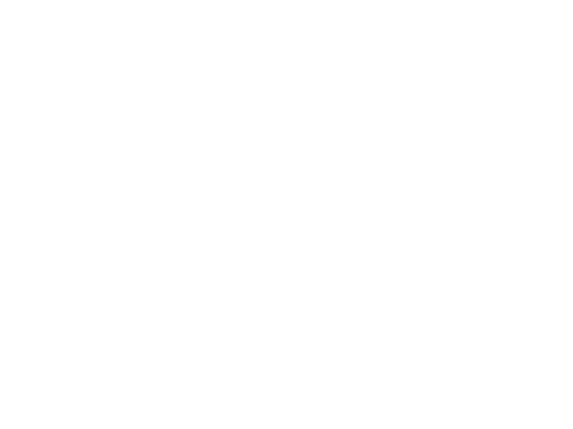

<IPython.core.display.Javascript object>


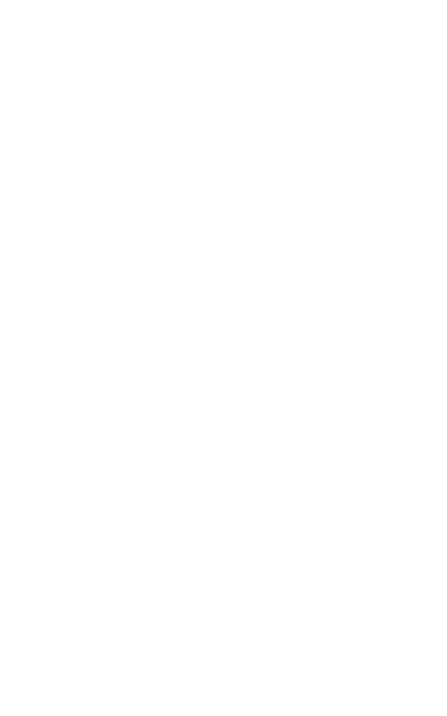

<IPython.core.display.Javascript object>


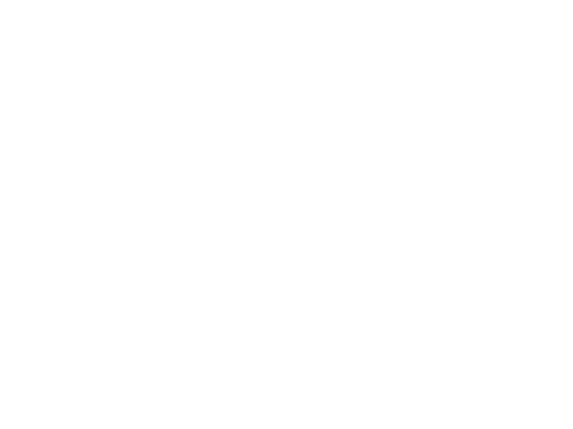

<IPython.core.display.Javascript object>


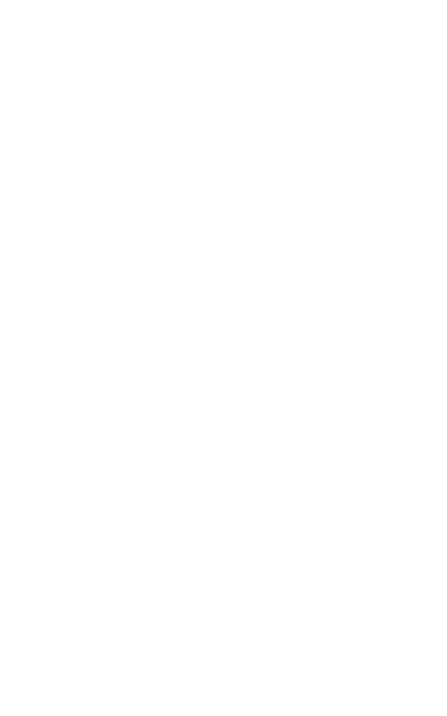

<IPython.core.display.Javascript object>


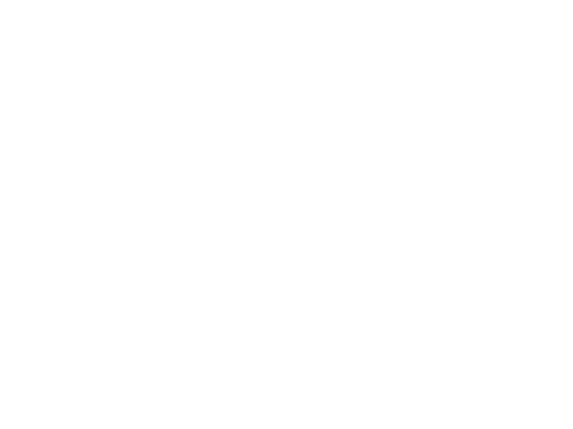

<IPython.core.display.Javascript object>


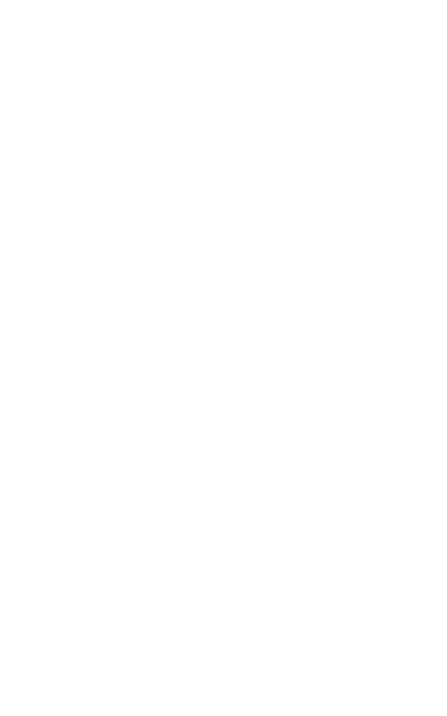

<IPython.core.display.Javascript object>


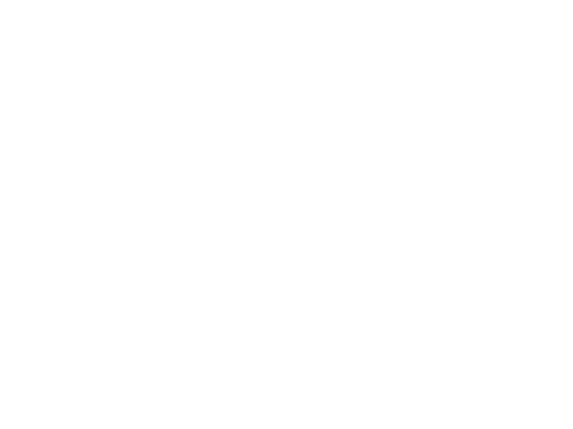

<IPython.core.display.Javascript object>


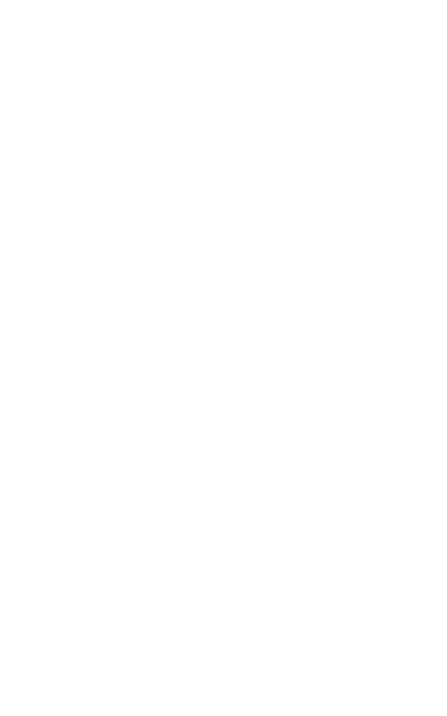

<IPython.core.display.Javascript object>


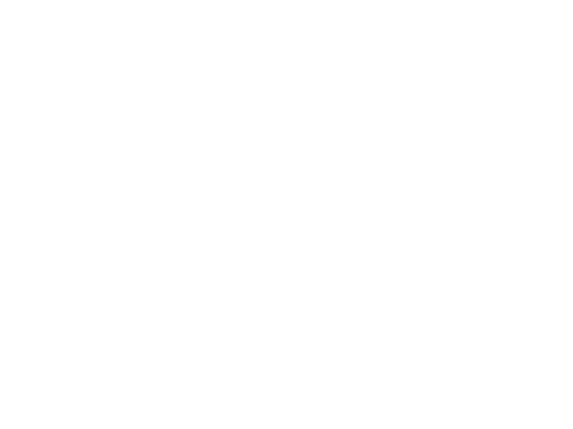

<IPython.core.display.Javascript object>


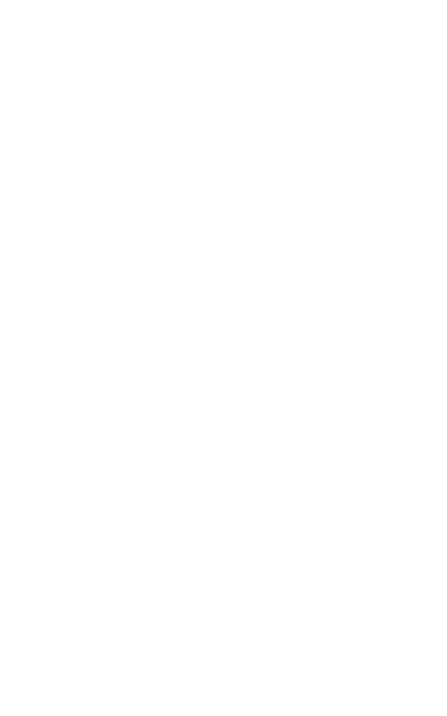

<IPython.core.display.Javascript object>


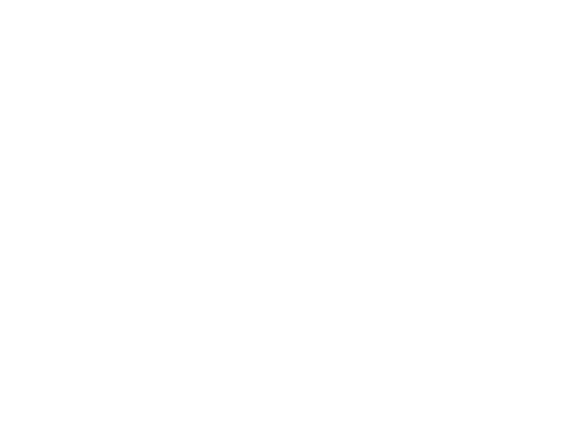

<IPython.core.display.Javascript object>


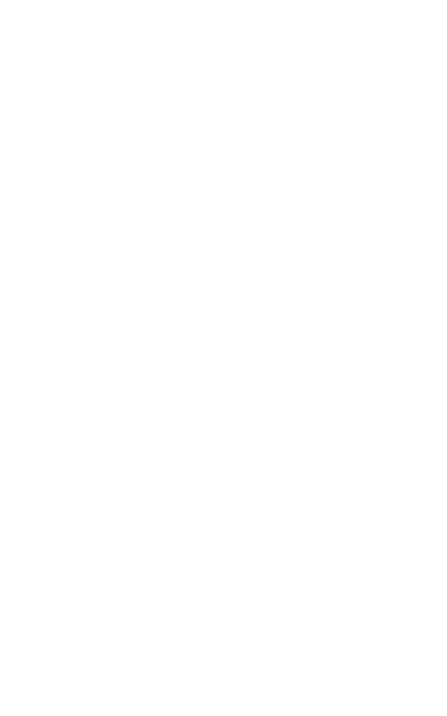

<IPython.core.display.Javascript object>


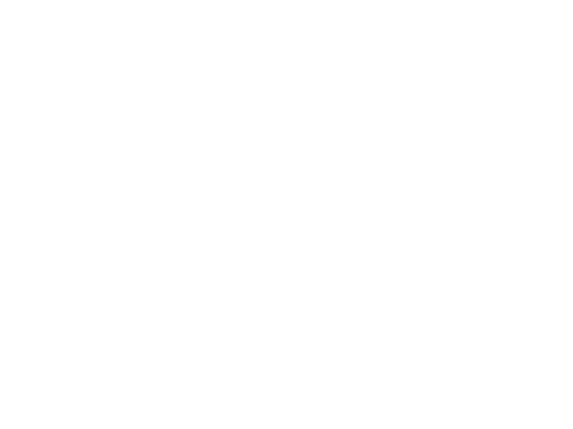

<IPython.core.display.Javascript object>


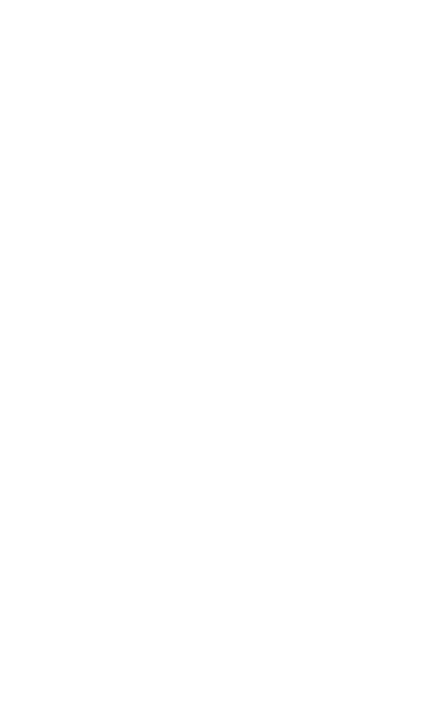

<IPython.core.display.Javascript object>


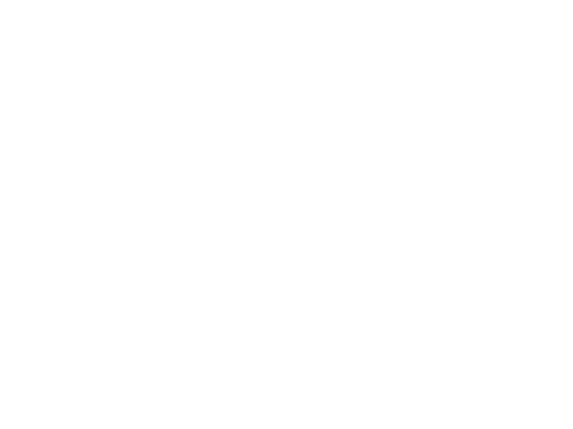

<IPython.core.display.Javascript object>


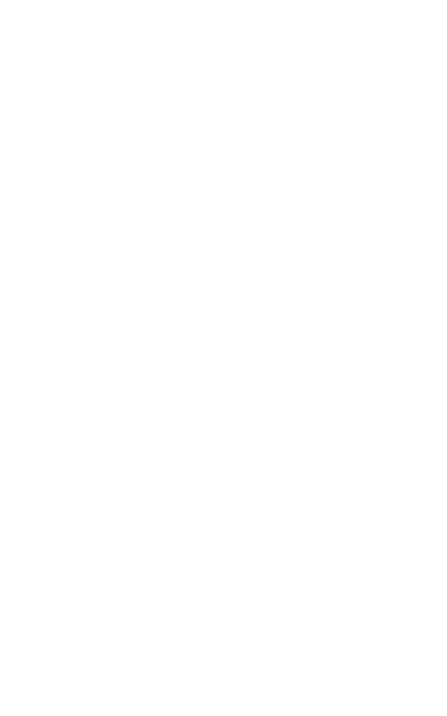

<IPython.core.display.Javascript object>


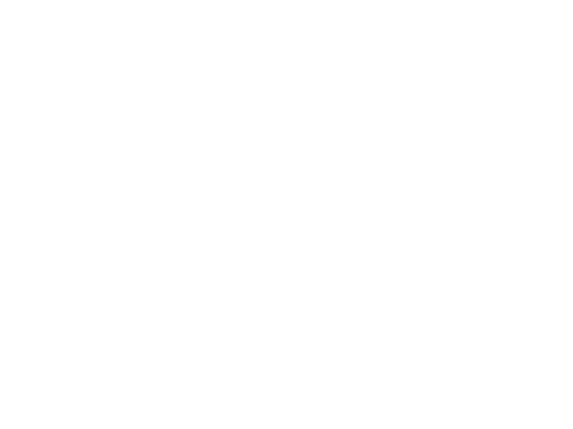

<IPython.core.display.Javascript object>


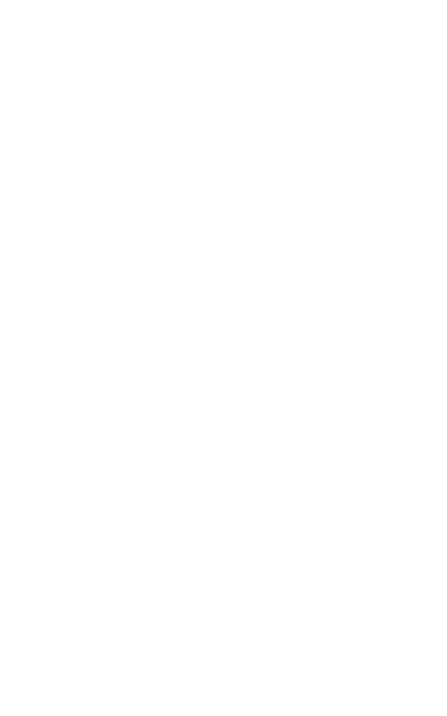

<IPython.core.display.Javascript object>


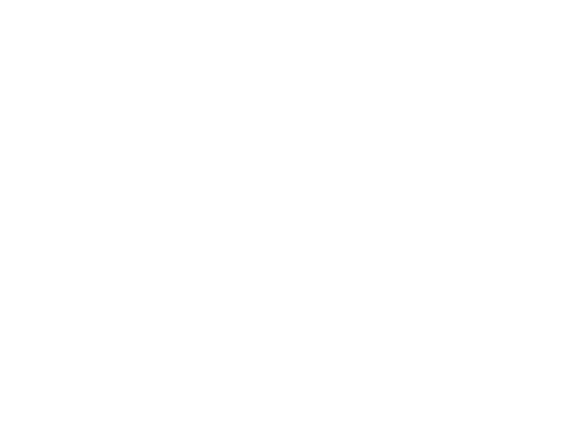

<IPython.core.display.Javascript object>


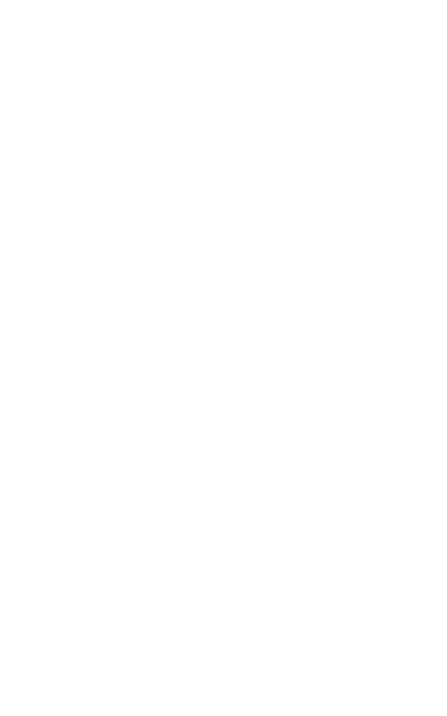

<IPython.core.display.Javascript object>


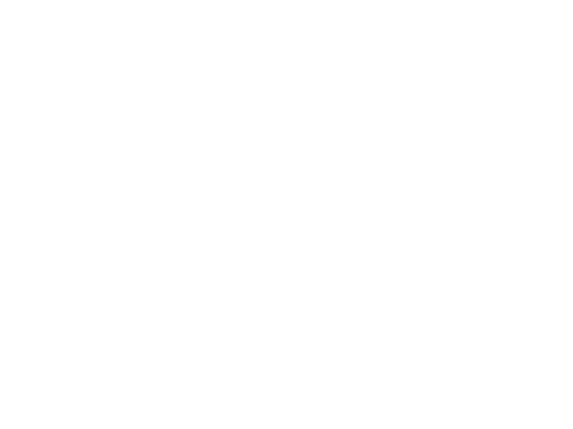

<IPython.core.display.Javascript object>


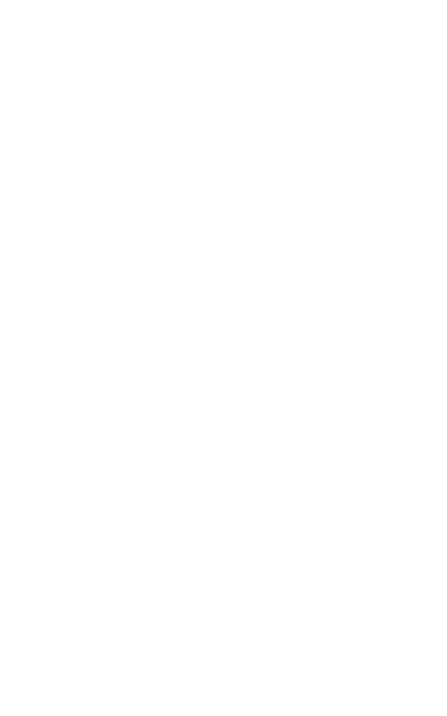

<IPython.core.display.Javascript object>


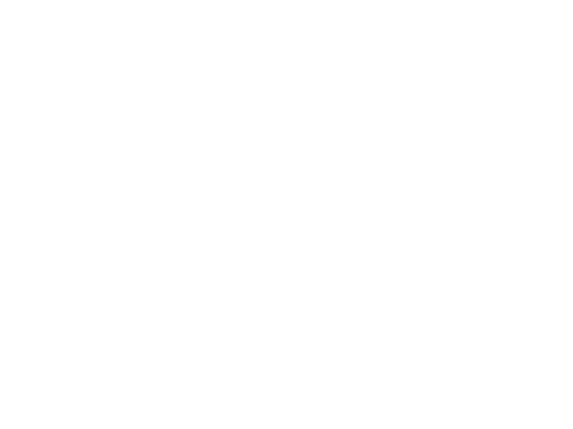

<IPython.core.display.Javascript object>


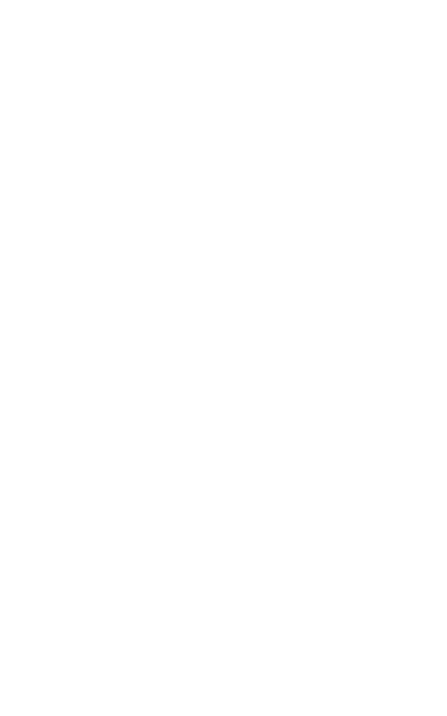

<IPython.core.display.Javascript object>


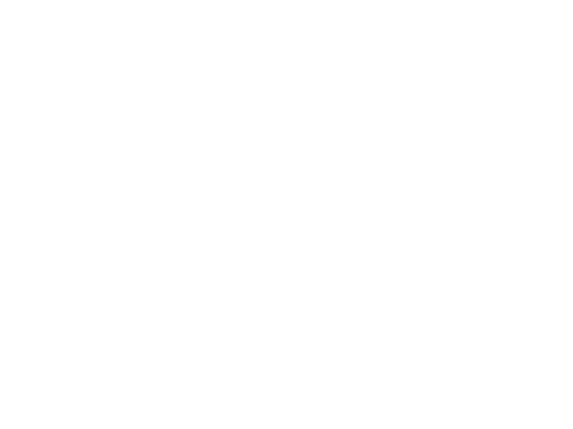

<IPython.core.display.Javascript object>


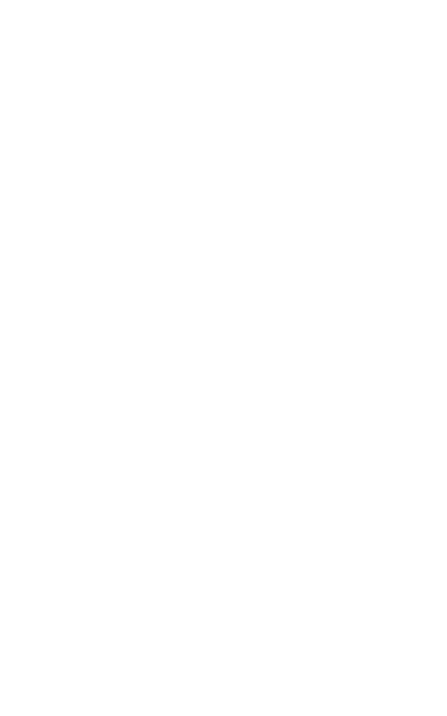

<IPython.core.display.Javascript object>


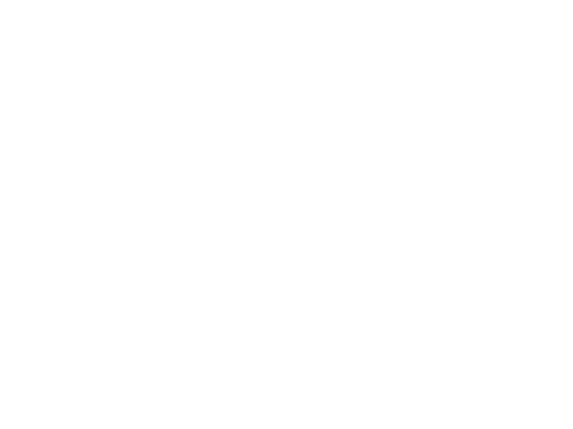

<IPython.core.display.Javascript object>


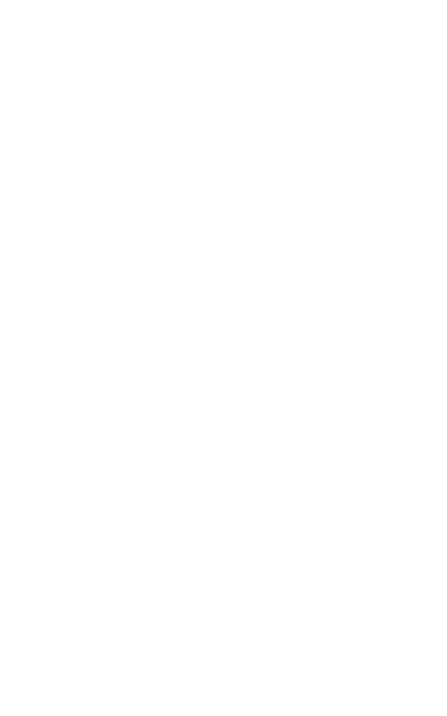

<IPython.core.display.Javascript object>


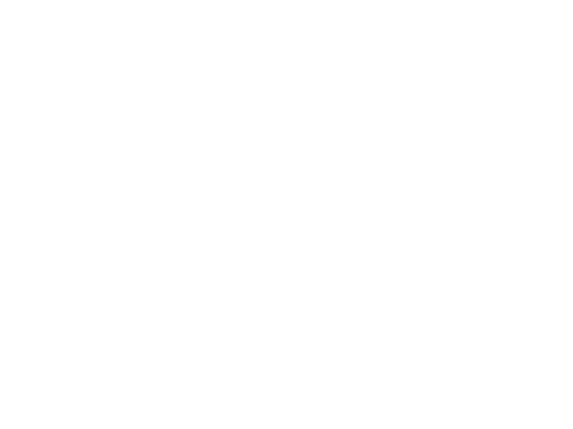

<IPython.core.display.Javascript object>


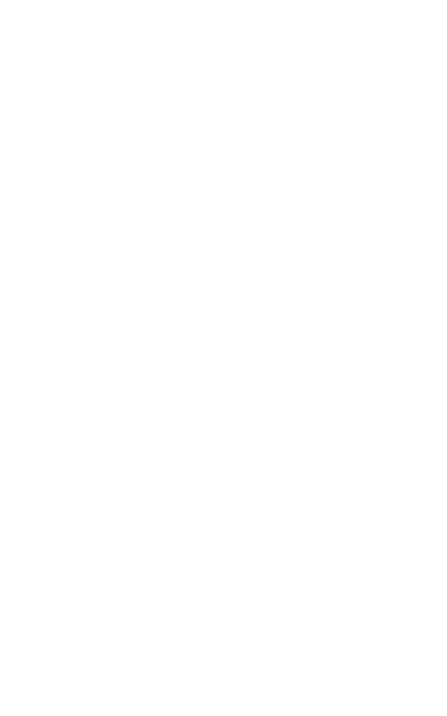

<IPython.core.display.Javascript object>


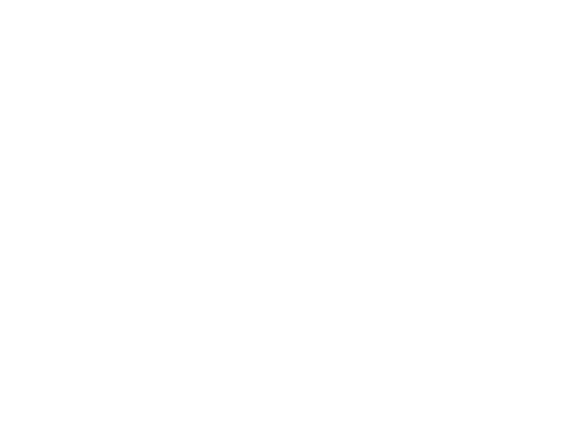

<IPython.core.display.Javascript object>


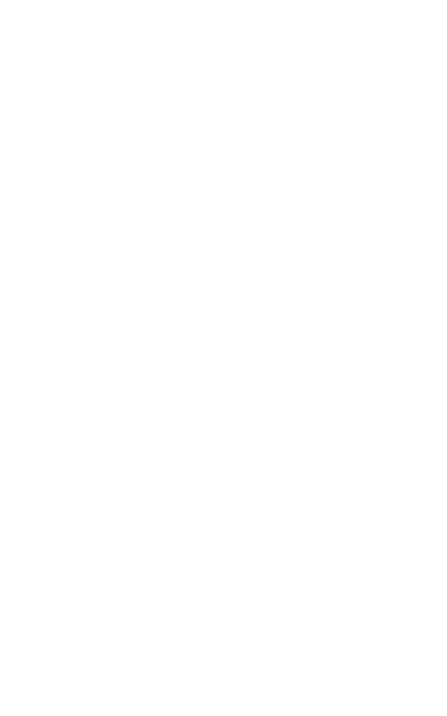

<IPython.core.display.Javascript object>


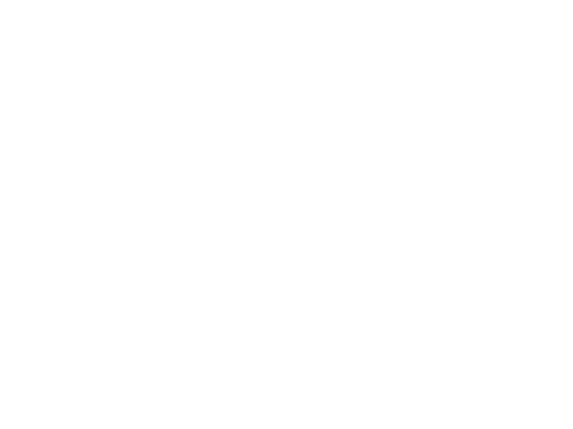

<IPython.core.display.Javascript object>


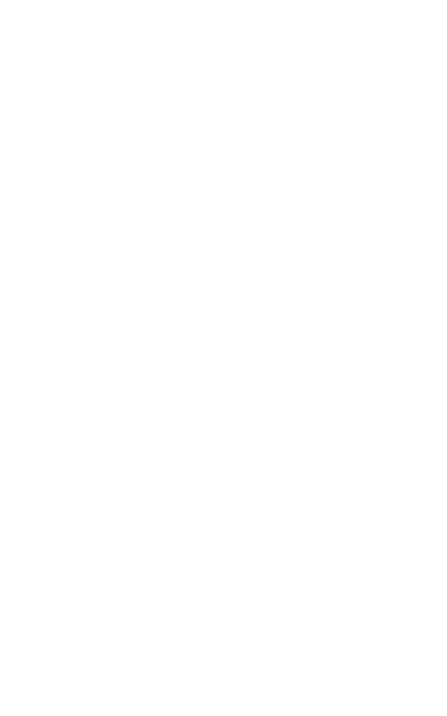

<IPython.core.display.Javascript object>


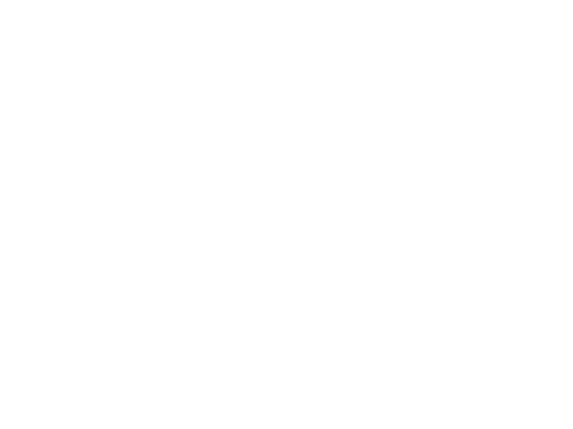

<IPython.core.display.Javascript object>


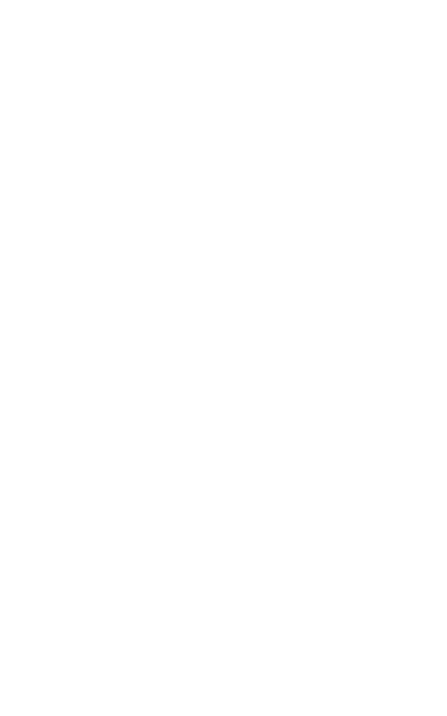

<IPython.core.display.Javascript object>


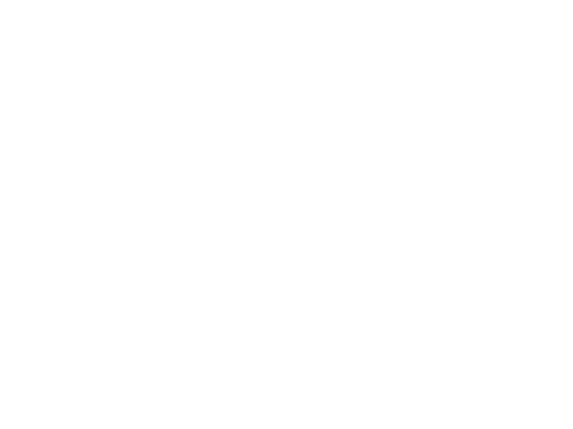

<IPython.core.display.Javascript object>


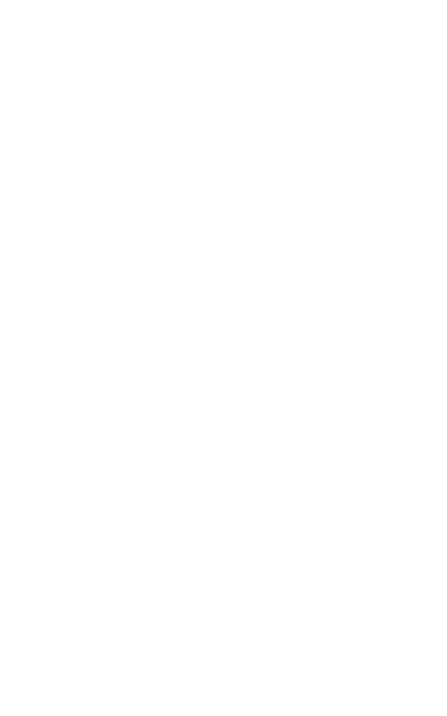

<IPython.core.display.Javascript object>


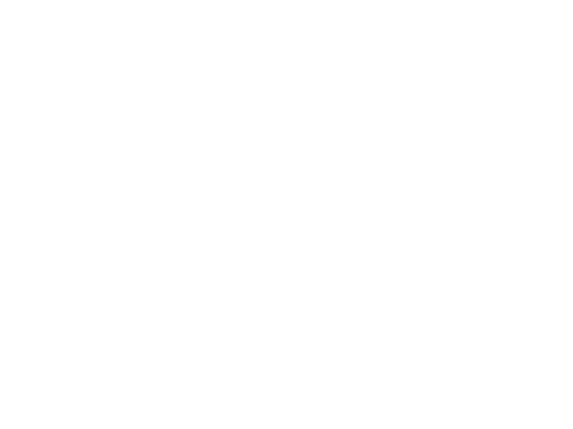

<IPython.core.display.Javascript object>


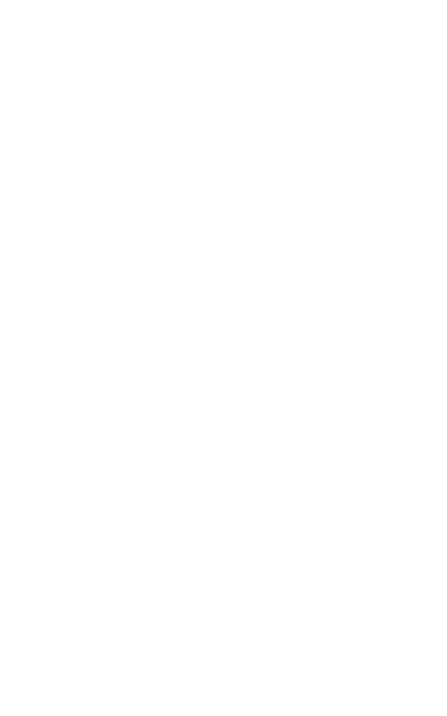

<IPython.core.display.Javascript object>


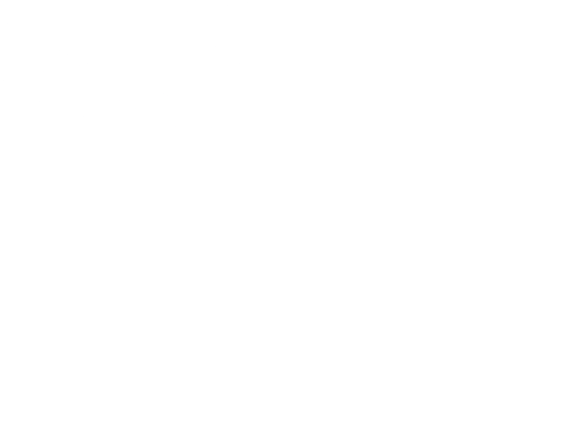

<IPython.core.display.Javascript object>


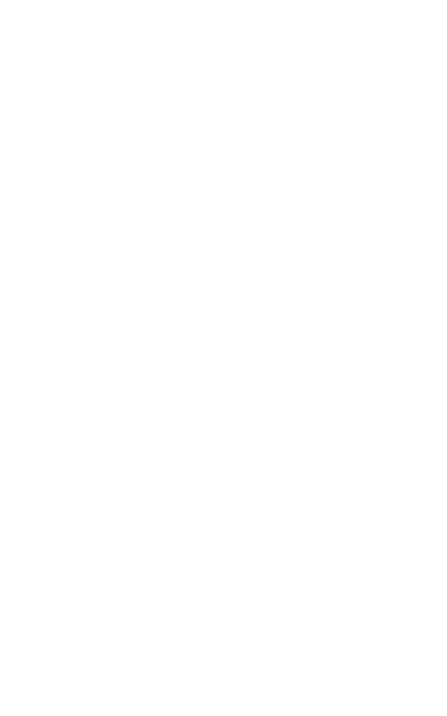

<IPython.core.display.Javascript object>


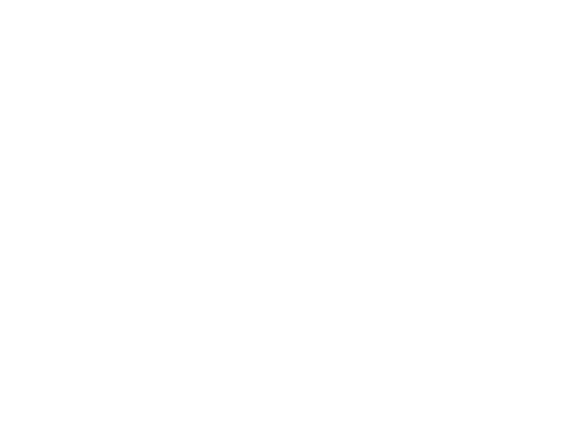

<IPython.core.display.Javascript object>


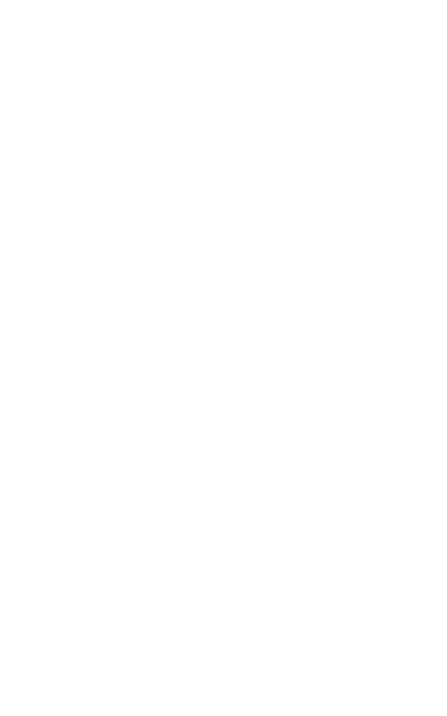

<IPython.core.display.Javascript object>


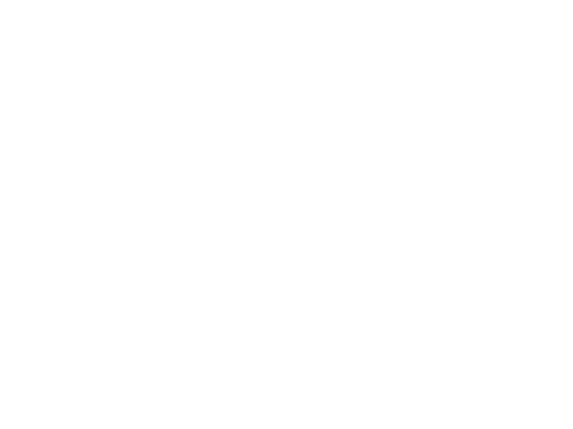

<IPython.core.display.Javascript object>


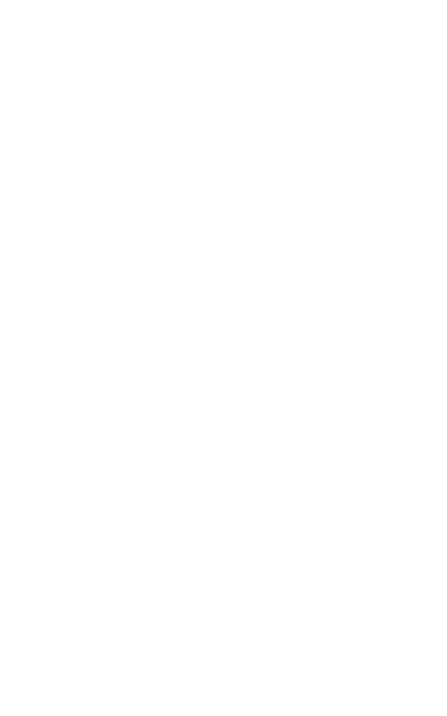

<IPython.core.display.Javascript object>


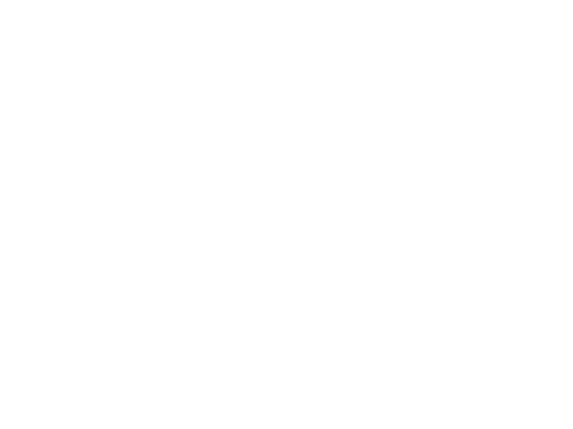

<IPython.core.display.Javascript object>


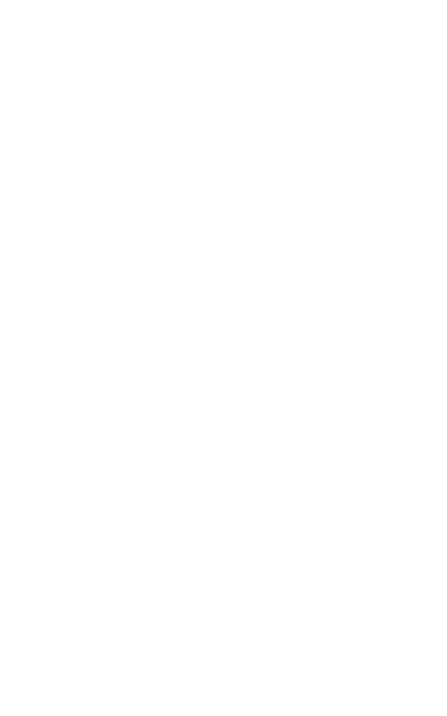

<IPython.core.display.Javascript object>


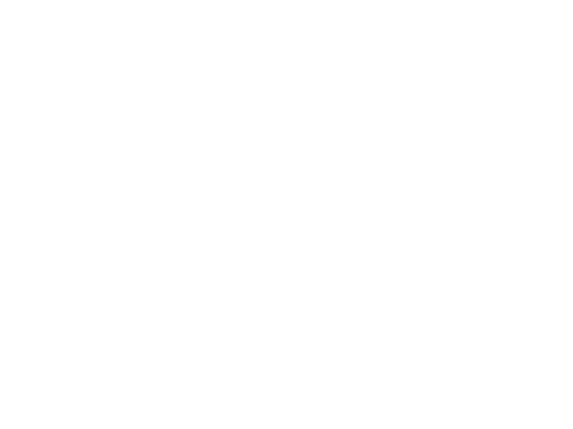

<IPython.core.display.Javascript object>


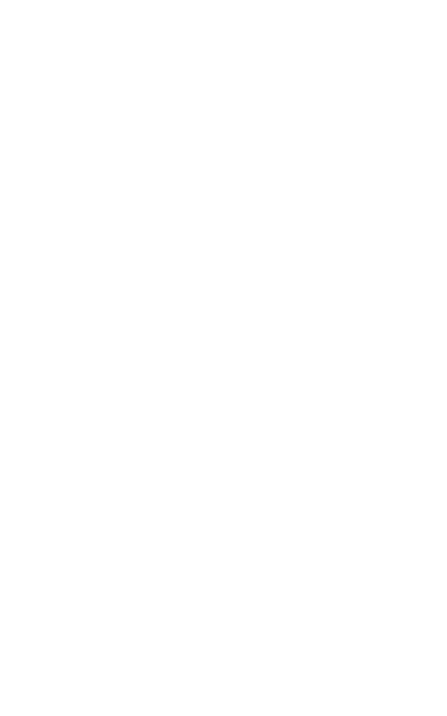

<IPython.core.display.Javascript object>


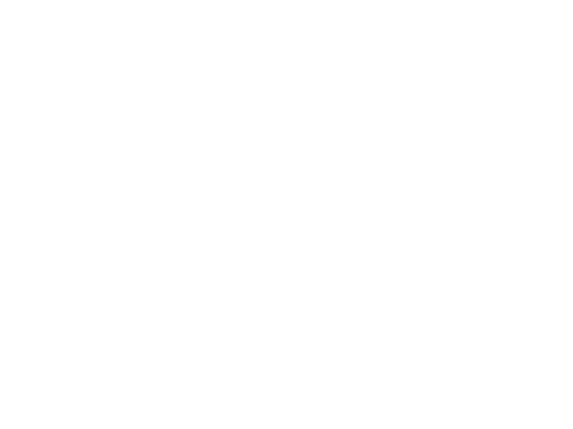

<IPython.core.display.Javascript object>


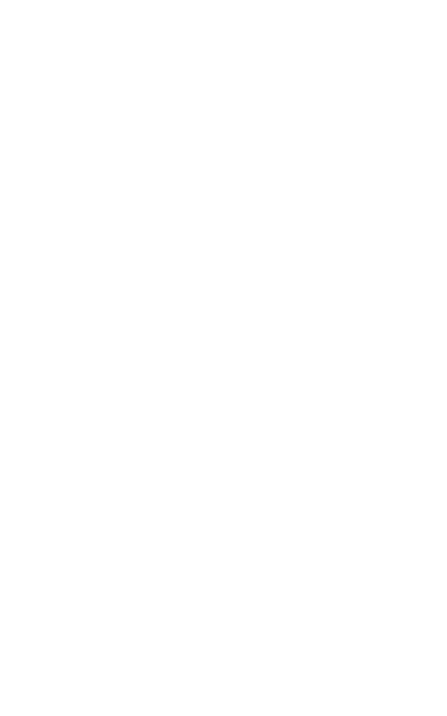

<IPython.core.display.Javascript object>


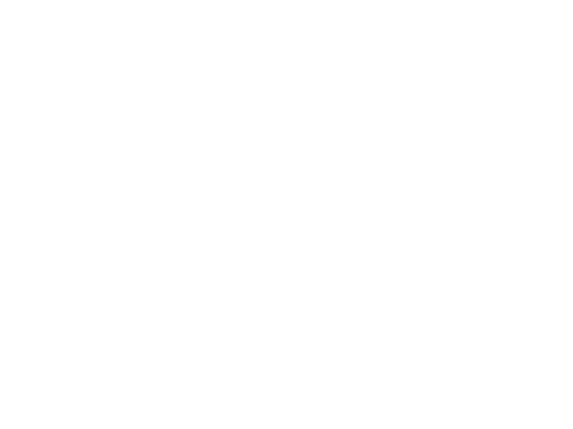

<IPython.core.display.Javascript object>


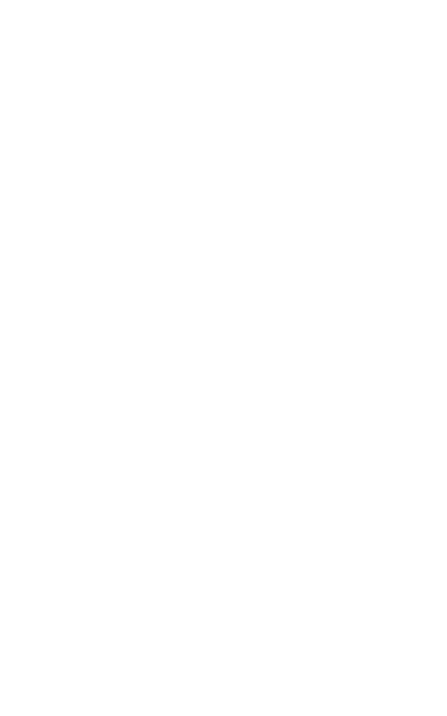

<IPython.core.display.Javascript object>


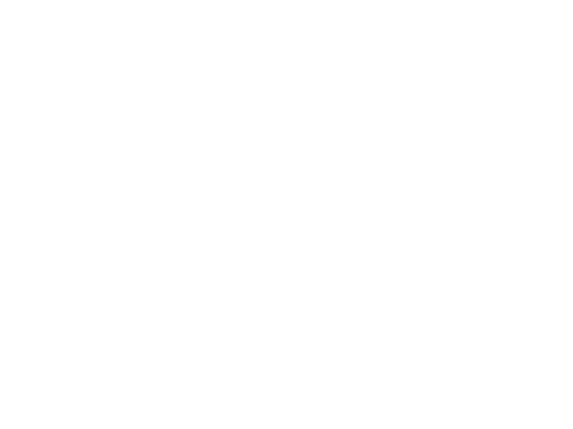

<IPython.core.display.Javascript object>


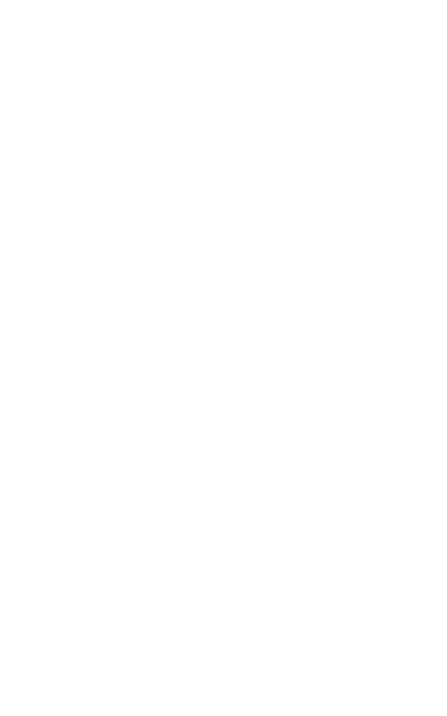

<IPython.core.display.Javascript object>


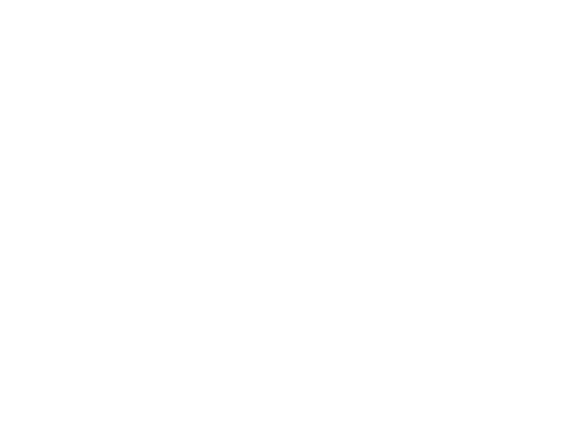

<IPython.core.display.Javascript object>


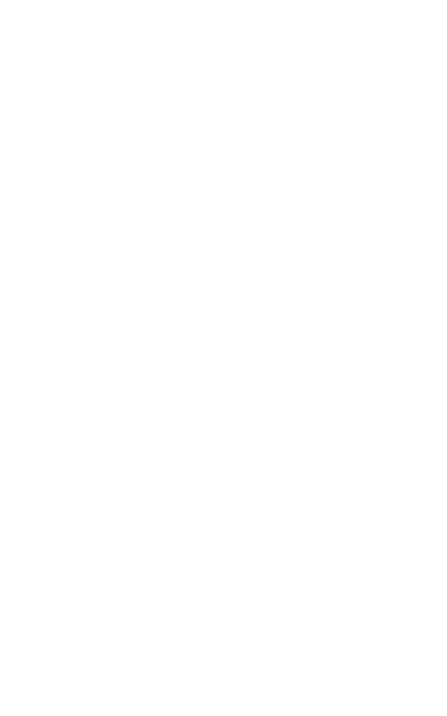

<IPython.core.display.Javascript object>


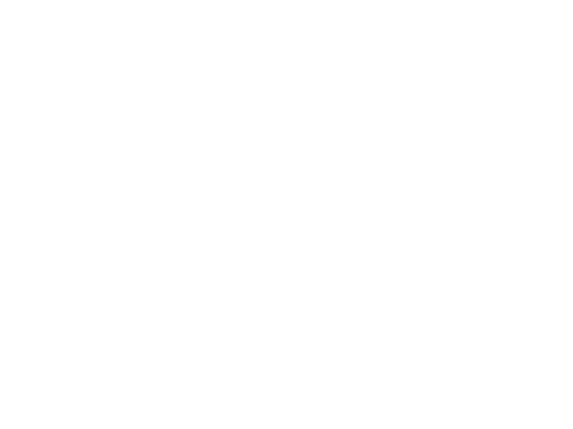

<IPython.core.display.Javascript object>


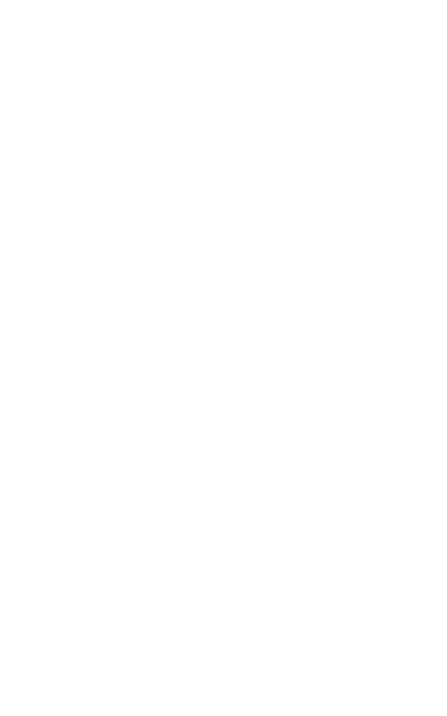

<IPython.core.display.Javascript object>


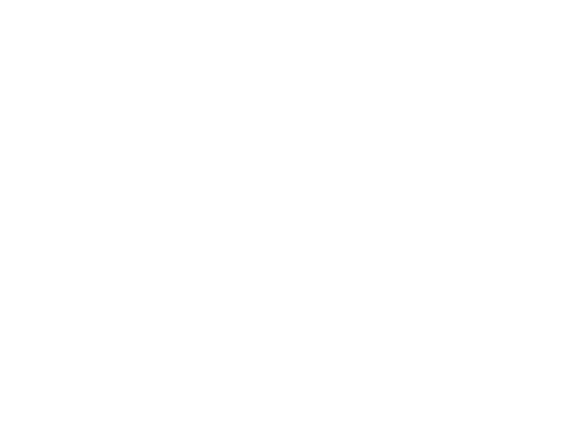

<IPython.core.display.Javascript object>


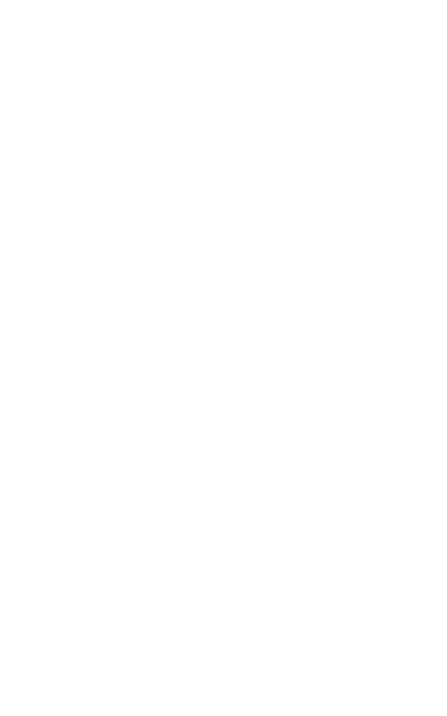

<IPython.core.display.Javascript object>


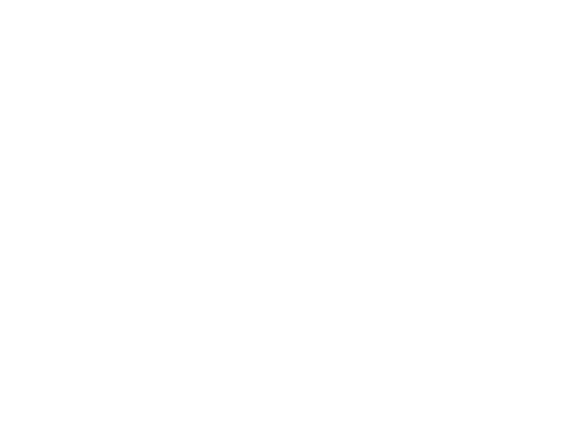

<IPython.core.display.Javascript object>


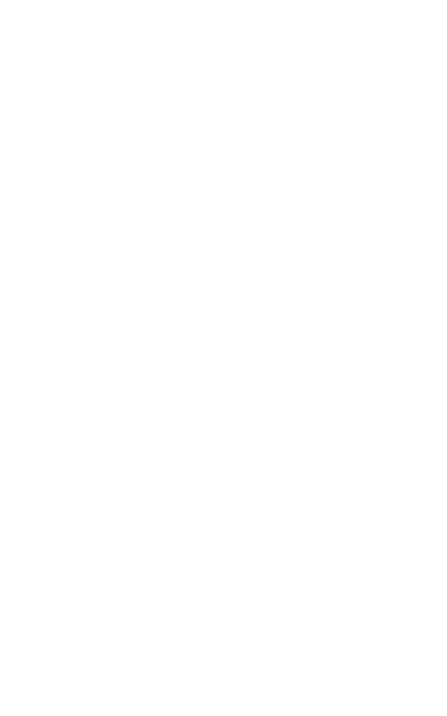

<IPython.core.display.Javascript object>


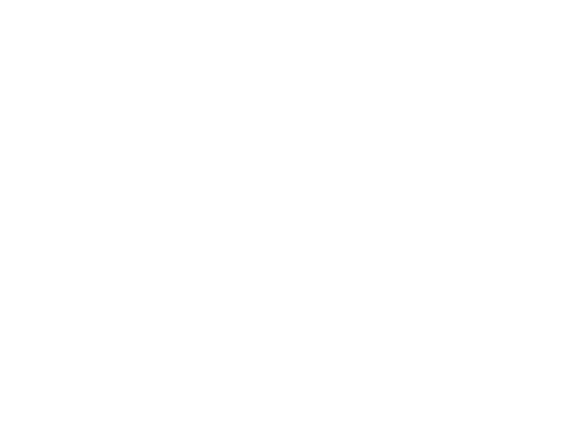

<IPython.core.display.Javascript object>


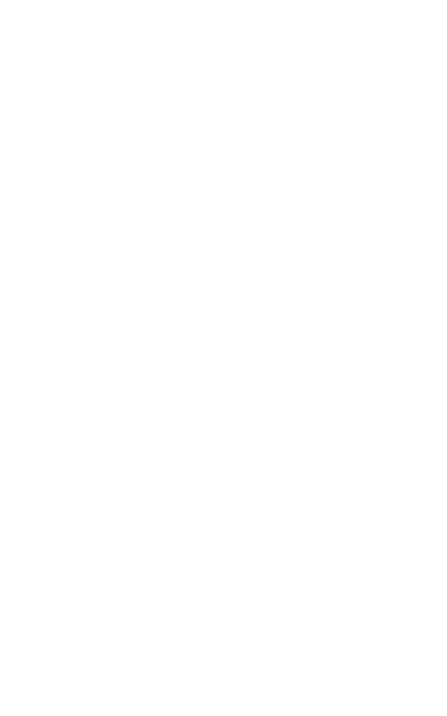

<IPython.core.display.Javascript object>


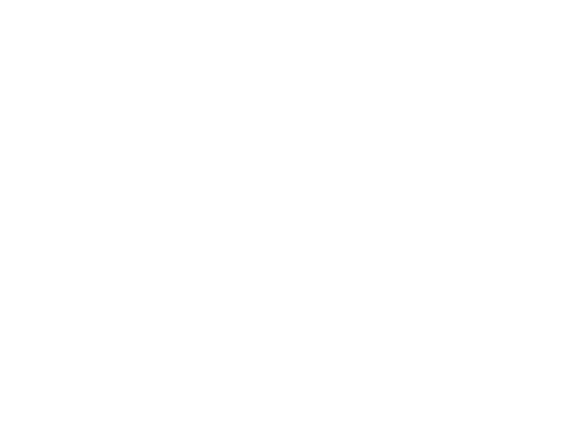

<IPython.core.display.Javascript object>


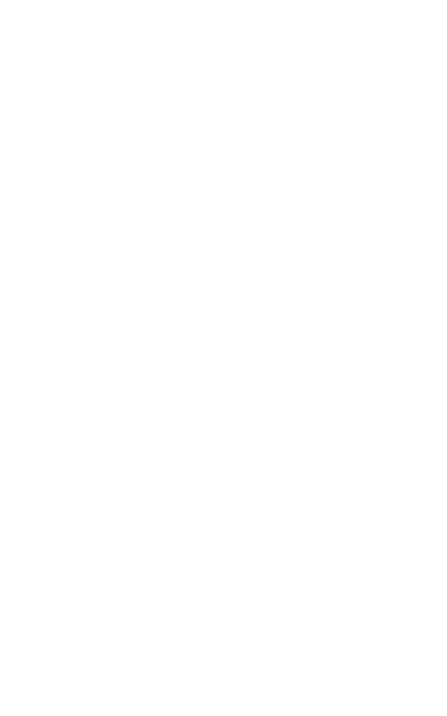

<IPython.core.display.Javascript object>


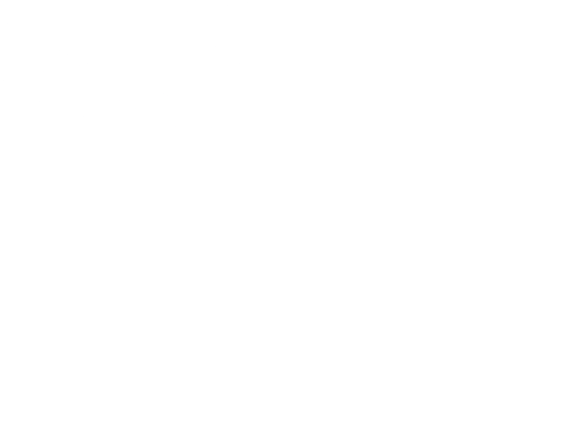

<IPython.core.display.Javascript object>


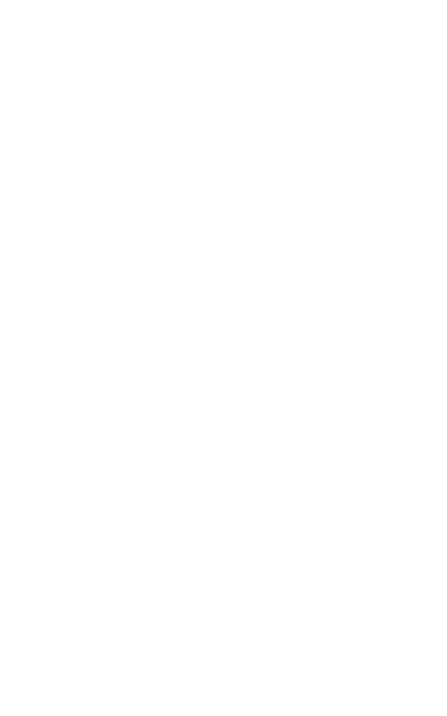

<IPython.core.display.Javascript object>


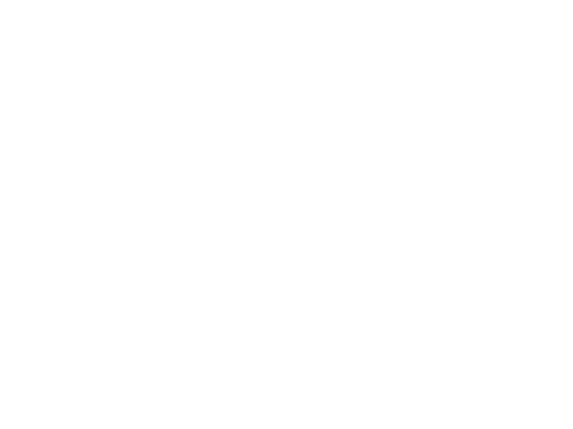

<IPython.core.display.Javascript object>


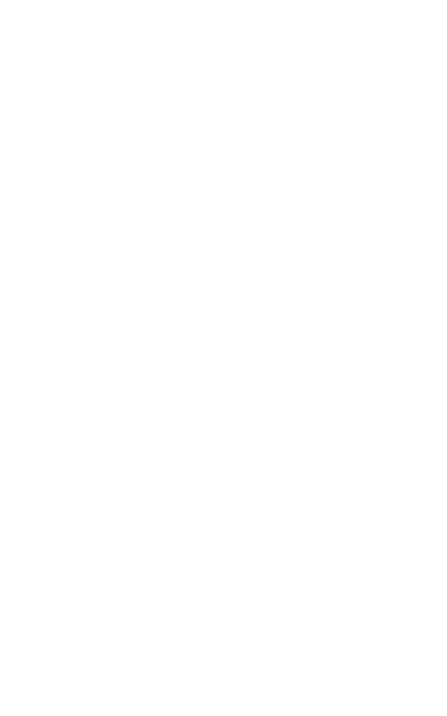

<IPython.core.display.Javascript object>


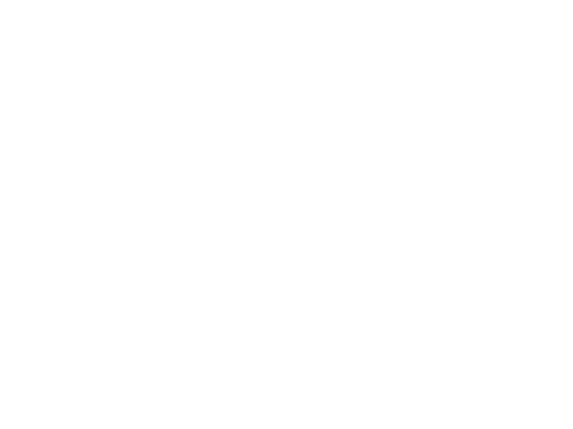

<IPython.core.display.Javascript object>


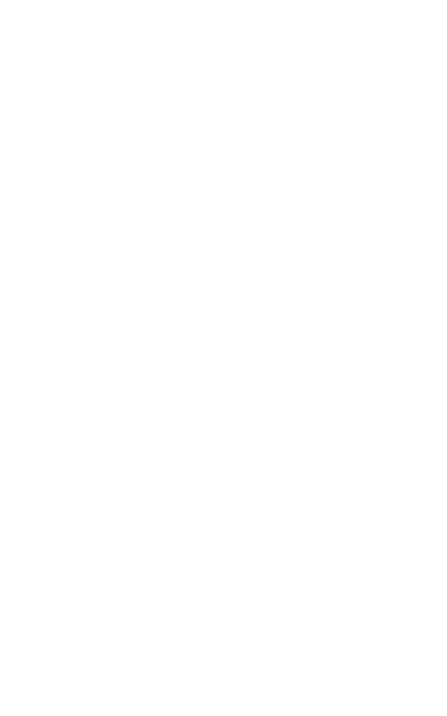

<IPython.core.display.Javascript object>


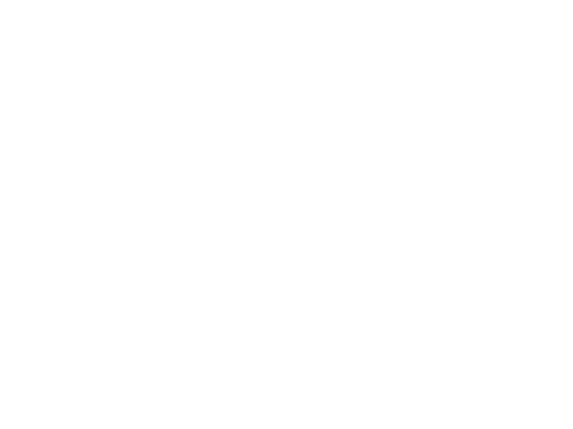

<IPython.core.display.Javascript object>


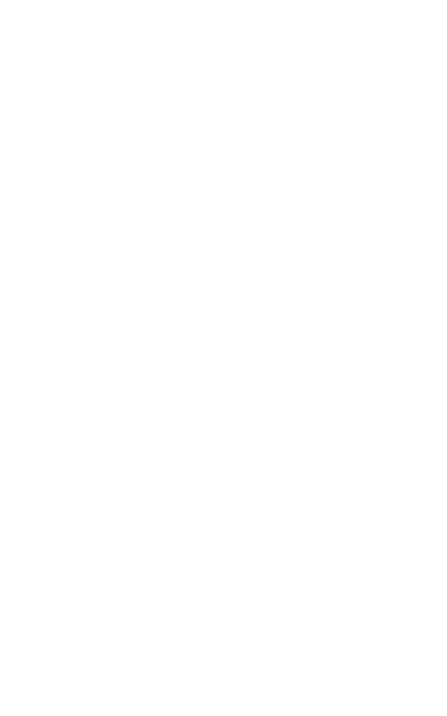

<IPython.core.display.Javascript object>


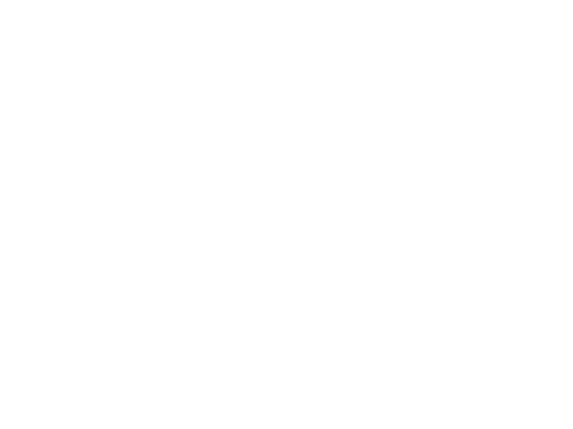

<IPython.core.display.Javascript object>


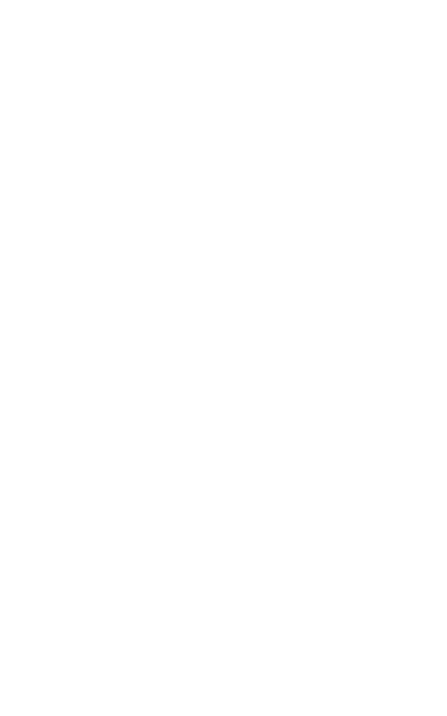

<IPython.core.display.Javascript object>


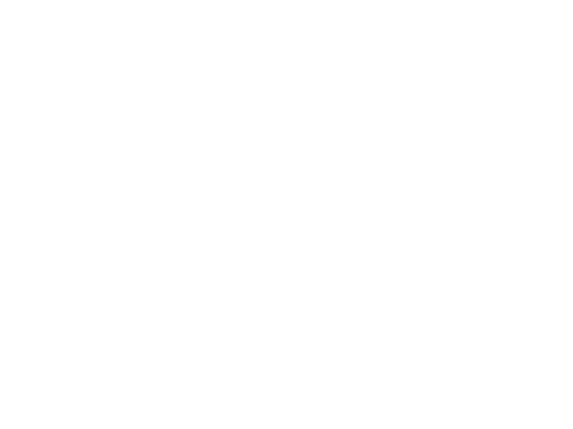

<IPython.core.display.Javascript object>


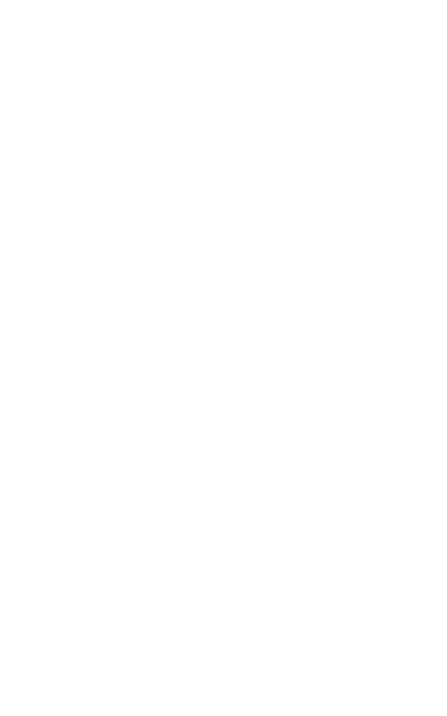

<IPython.core.display.Javascript object>


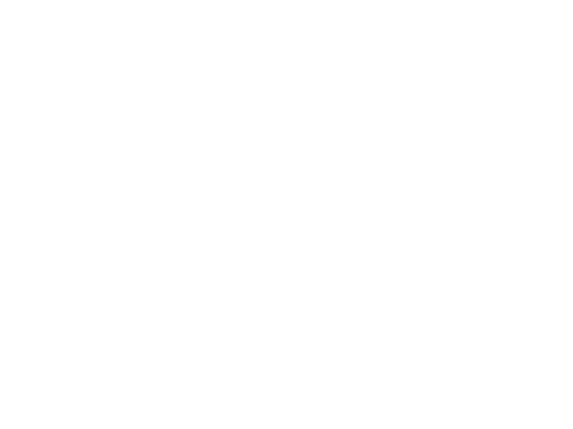

<IPython.core.display.Javascript object>


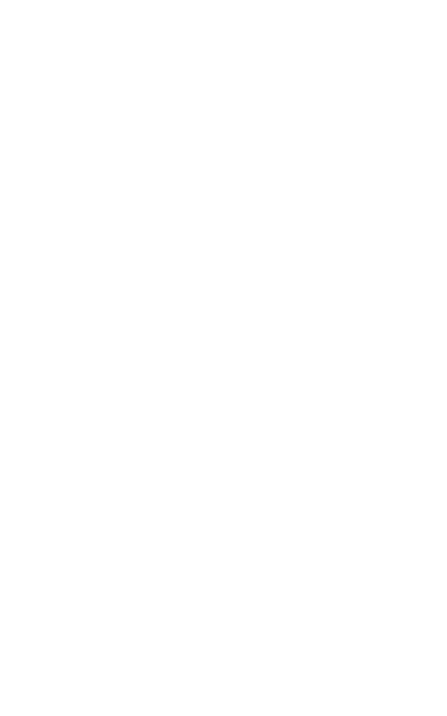

<IPython.core.display.Javascript object>


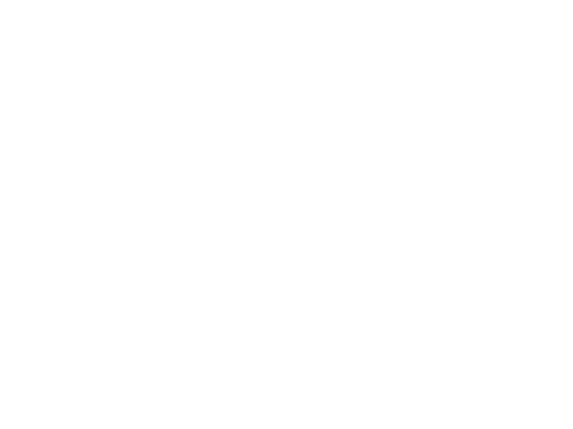

<IPython.core.display.Javascript object>


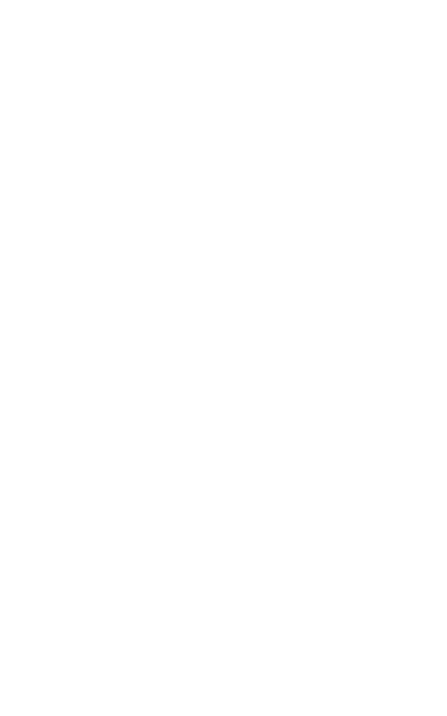

<IPython.core.display.Javascript object>


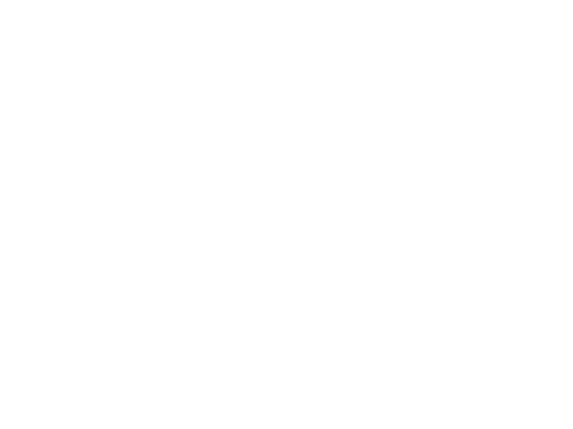

<IPython.core.display.Javascript object>


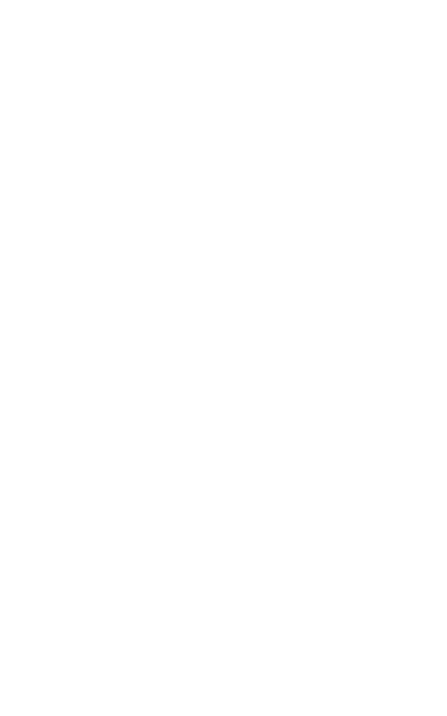

<IPython.core.display.Javascript object>


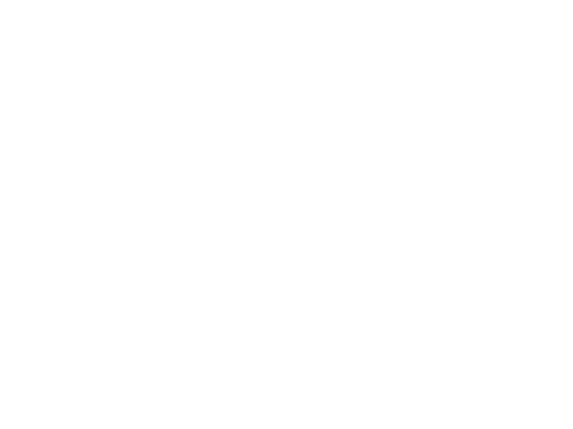

<IPython.core.display.Javascript object>


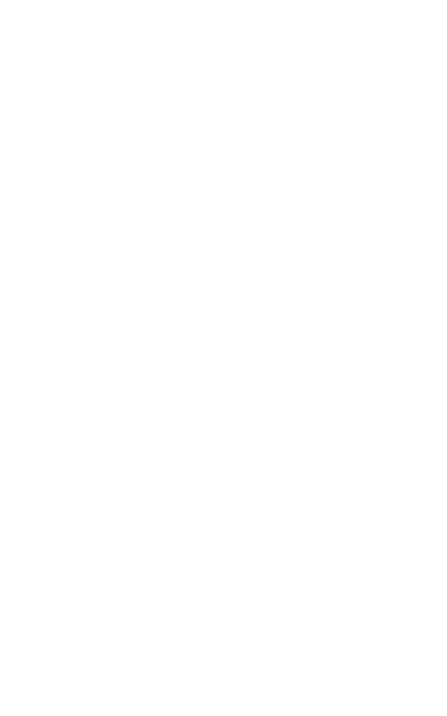

<IPython.core.display.Javascript object>


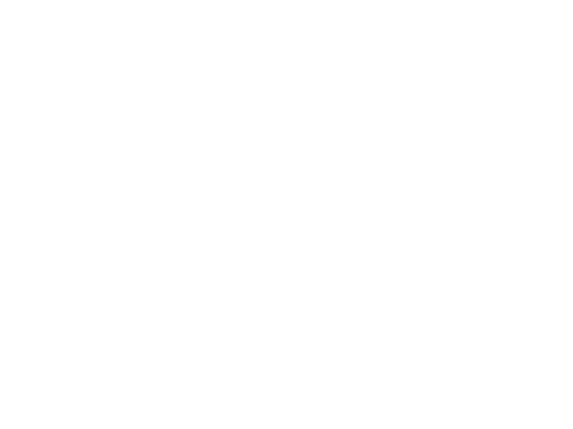

<IPython.core.display.Javascript object>


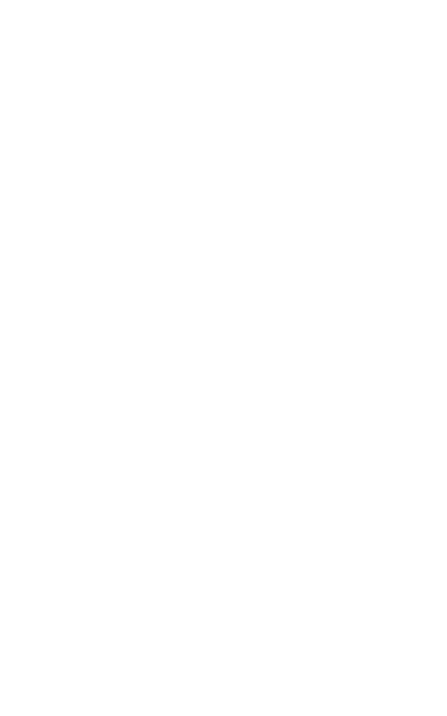

<IPython.core.display.Javascript object>


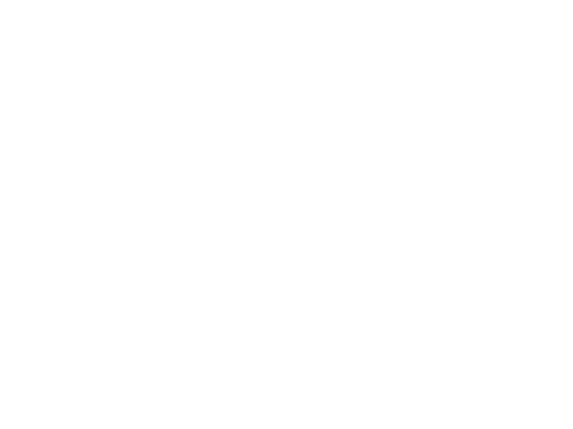

<IPython.core.display.Javascript object>


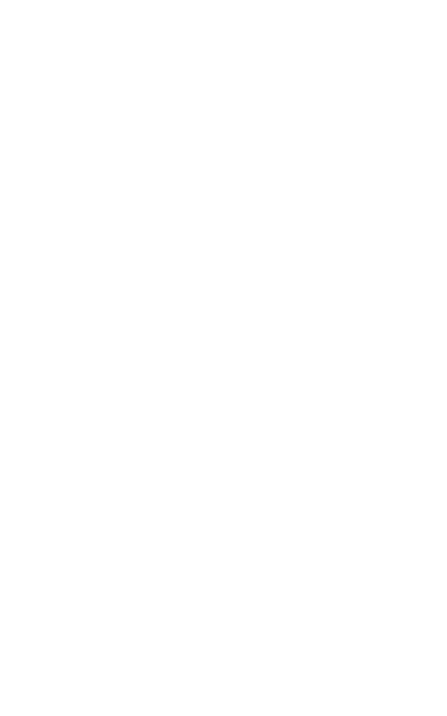

<IPython.core.display.Javascript object>


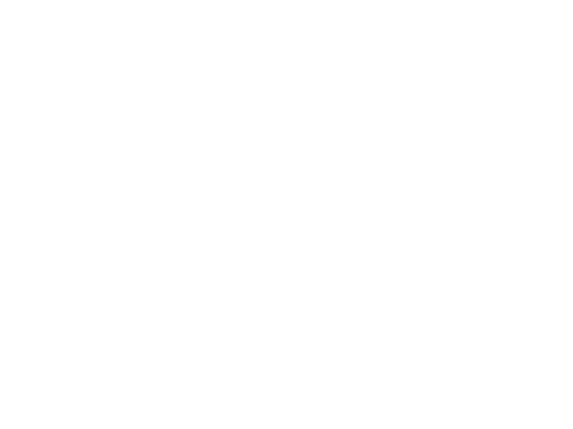

<IPython.core.display.Javascript object>


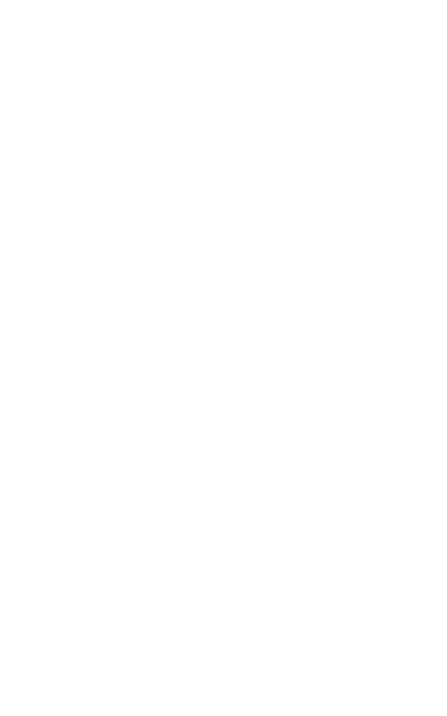

<IPython.core.display.Javascript object>


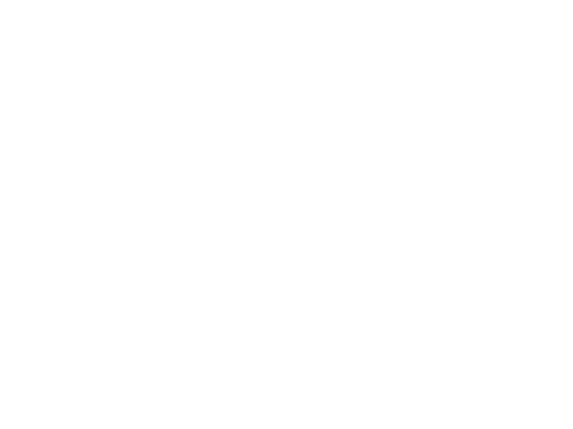

<IPython.core.display.Javascript object>


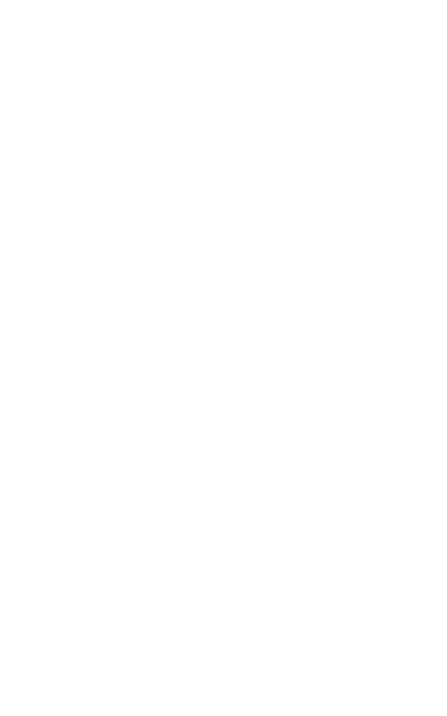

<IPython.core.display.Javascript object>


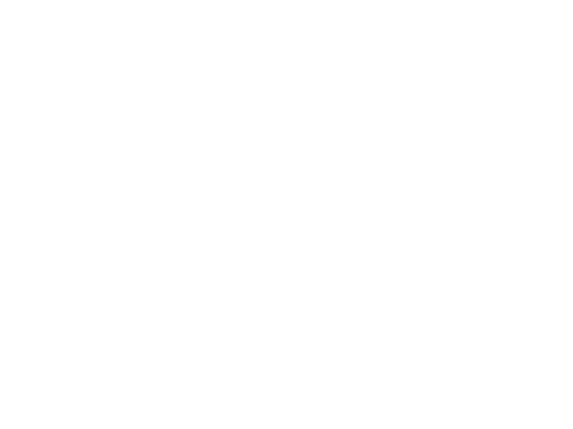

<IPython.core.display.Javascript object>


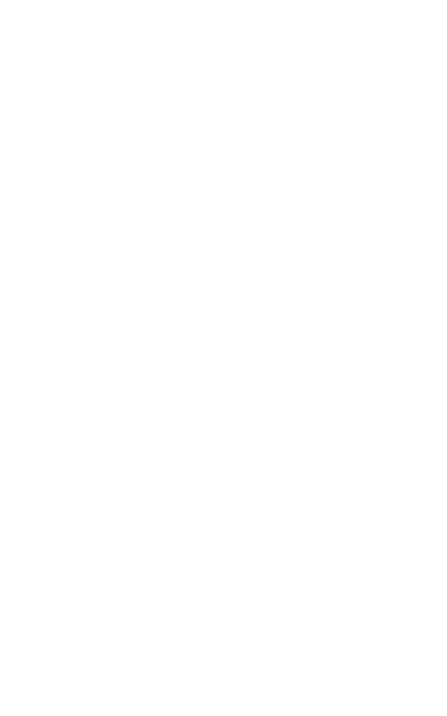

<IPython.core.display.Javascript object>


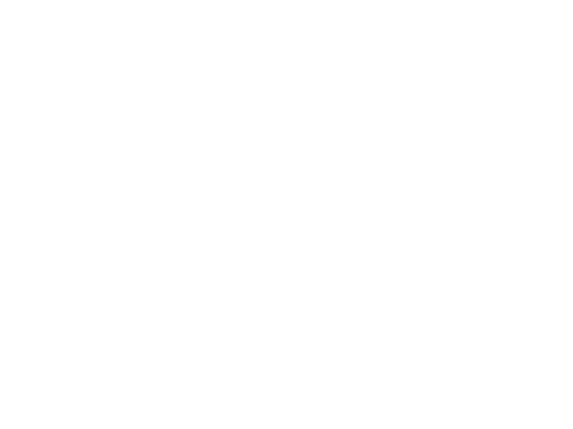

<IPython.core.display.Javascript object>


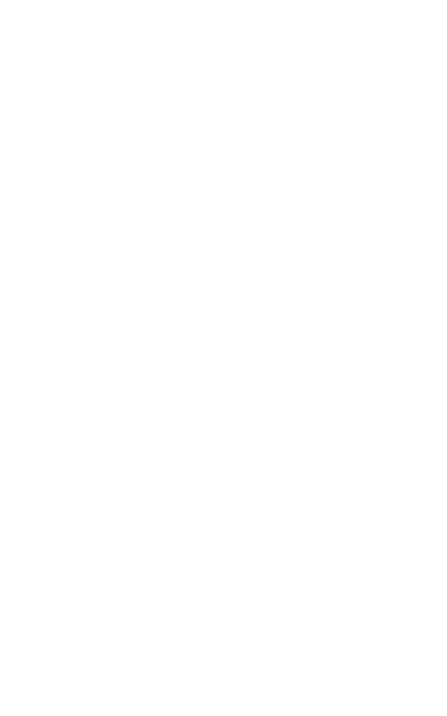

<IPython.core.display.Javascript object>


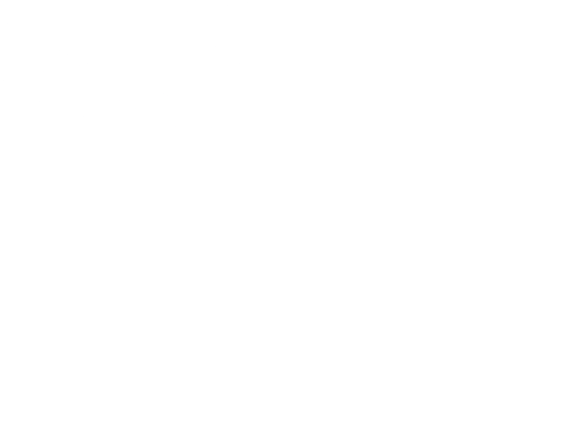

<IPython.core.display.Javascript object>


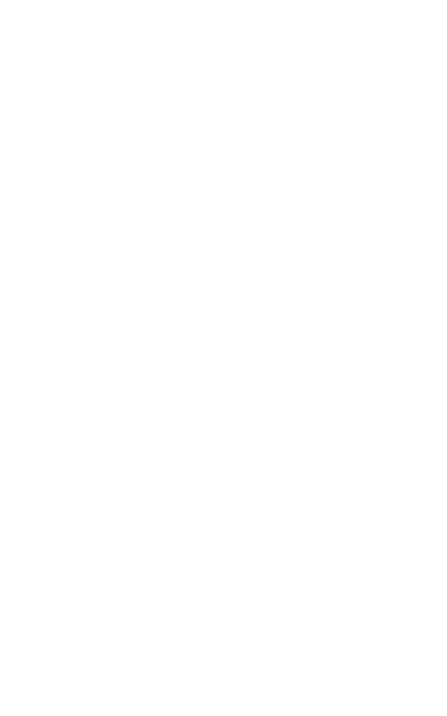

<IPython.core.display.Javascript object>


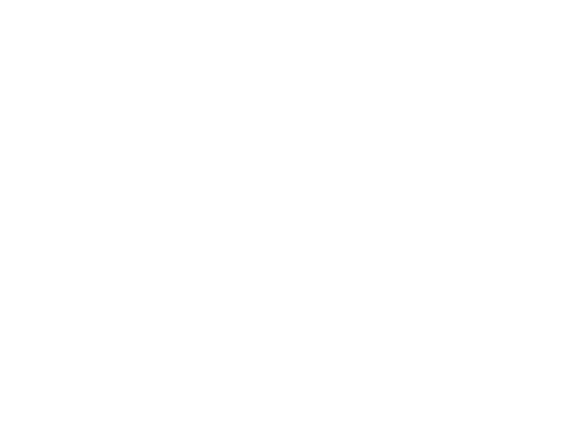

<IPython.core.display.Javascript object>


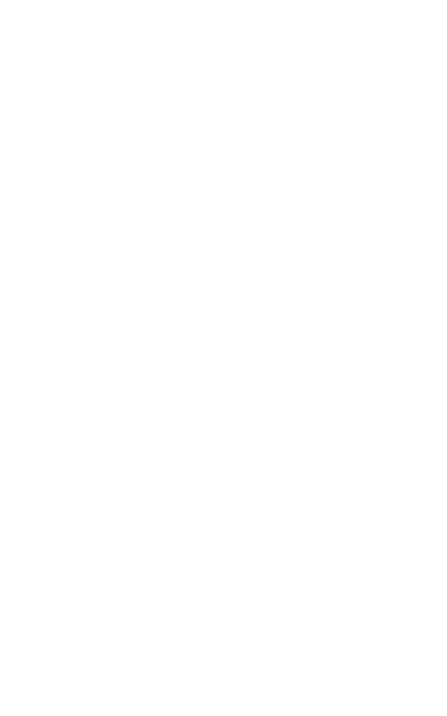

<IPython.core.display.Javascript object>


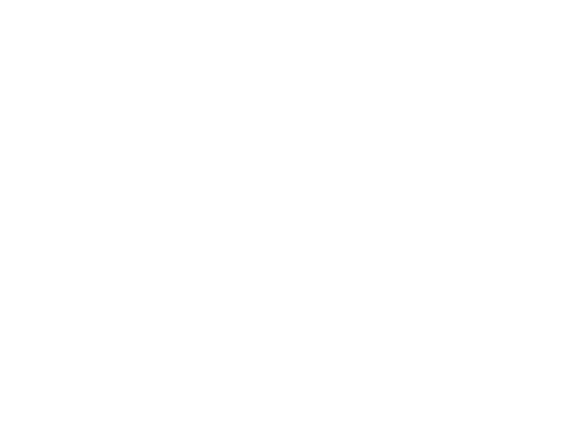

<IPython.core.display.Javascript object>


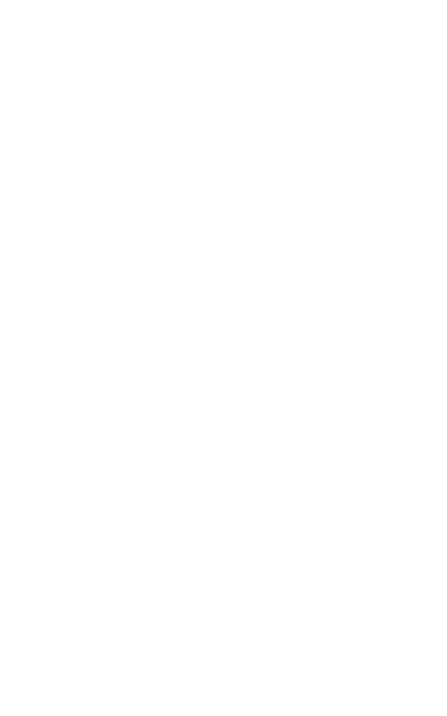

<IPython.core.display.Javascript object>


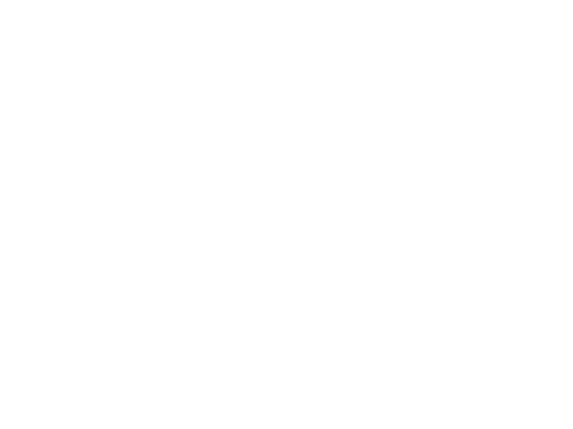

<IPython.core.display.Javascript object>


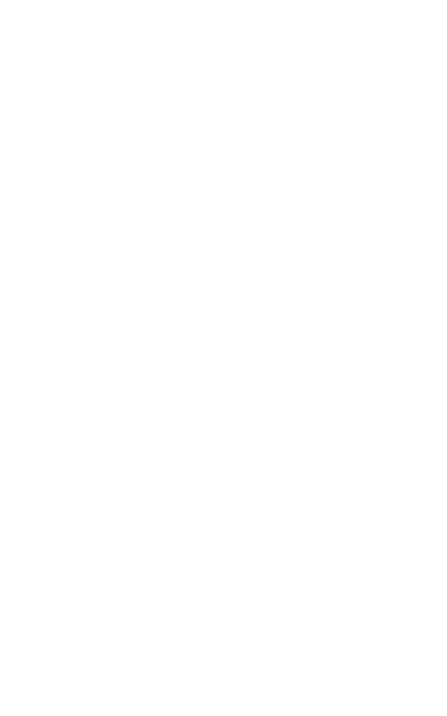

<IPython.core.display.Javascript object>


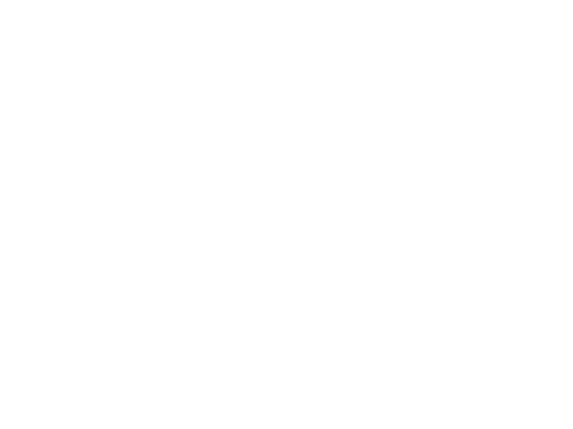

<IPython.core.display.Javascript object>


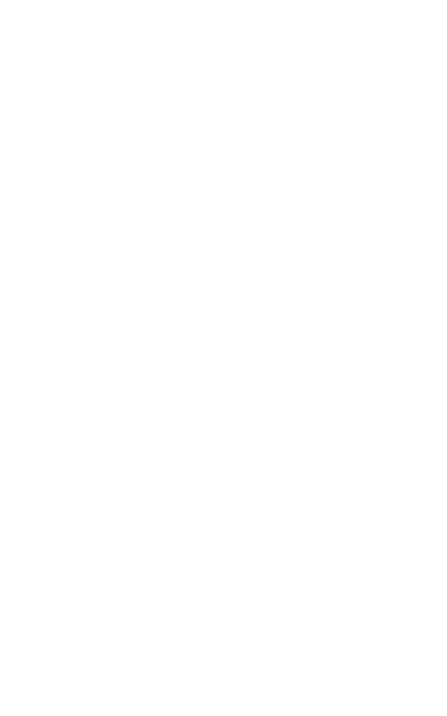

<IPython.core.display.Javascript object>


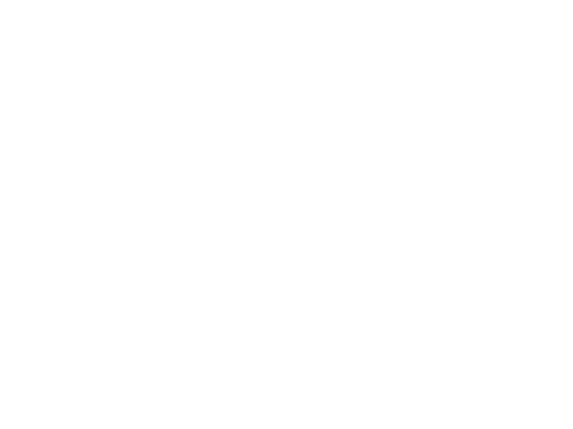

<IPython.core.display.Javascript object>


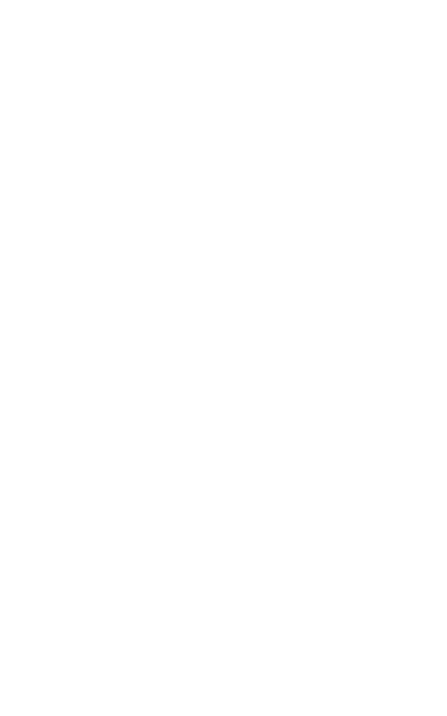

<IPython.core.display.Javascript object>


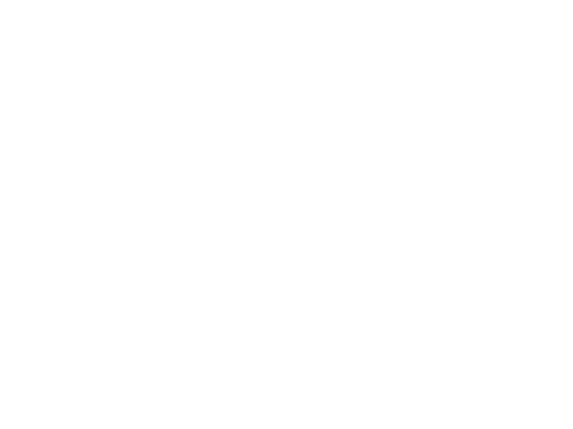

<IPython.core.display.Javascript object>


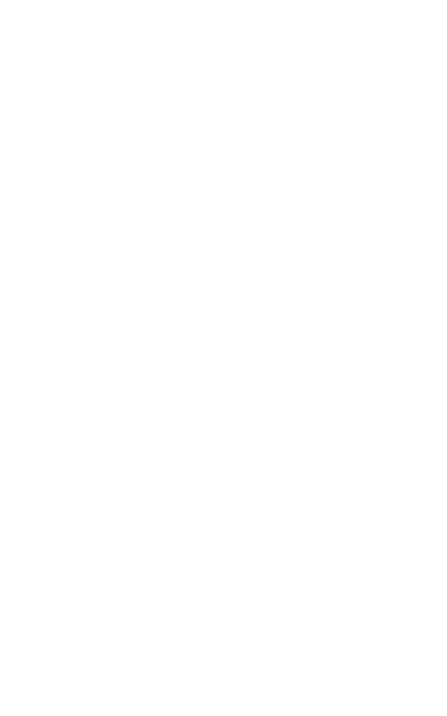

<IPython.core.display.Javascript object>


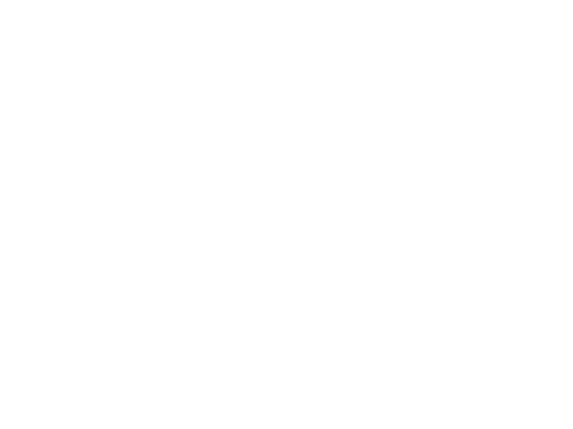

<IPython.core.display.Javascript object>


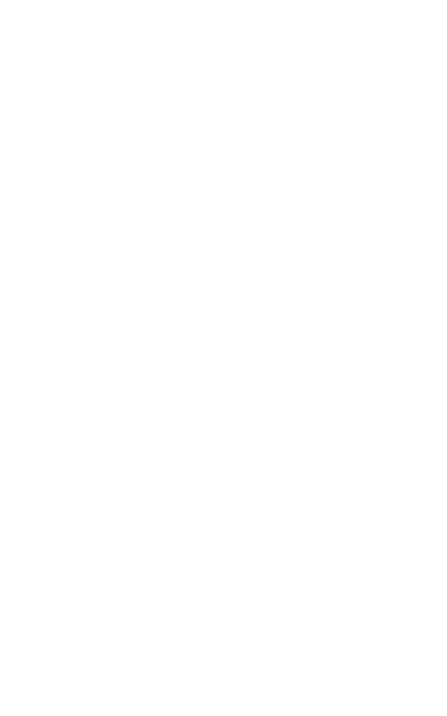

<IPython.core.display.Javascript object>


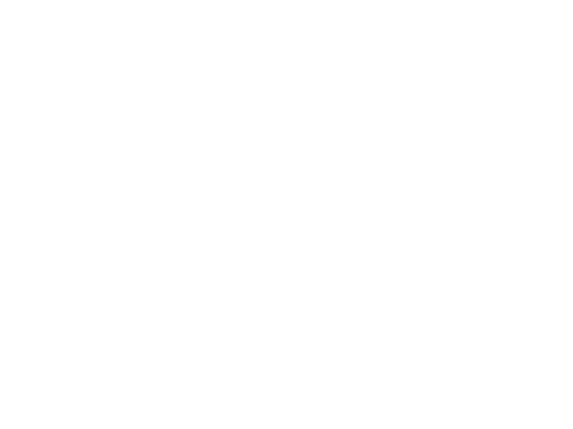

<IPython.core.display.Javascript object>


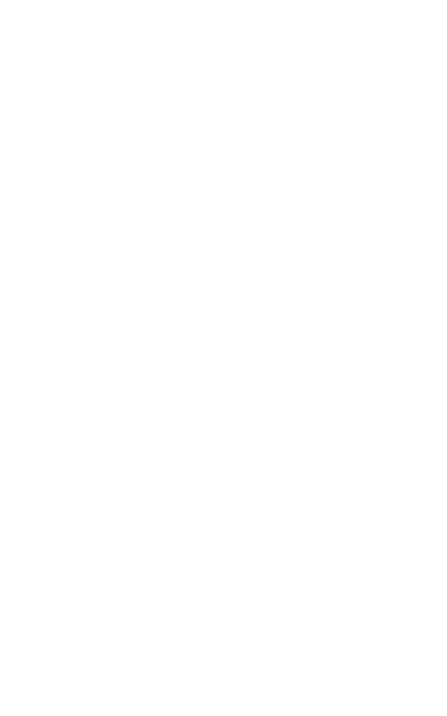

<IPython.core.display.Javascript object>


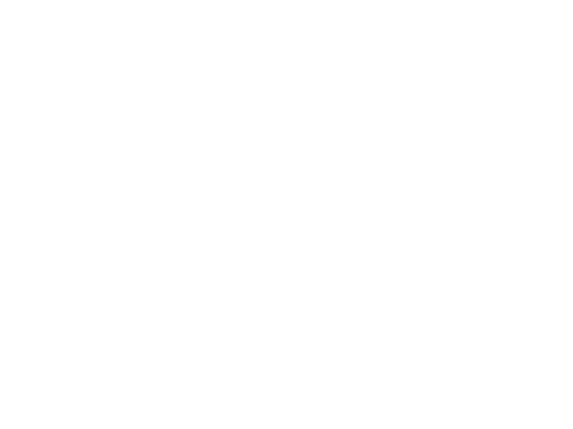

<IPython.core.display.Javascript object>


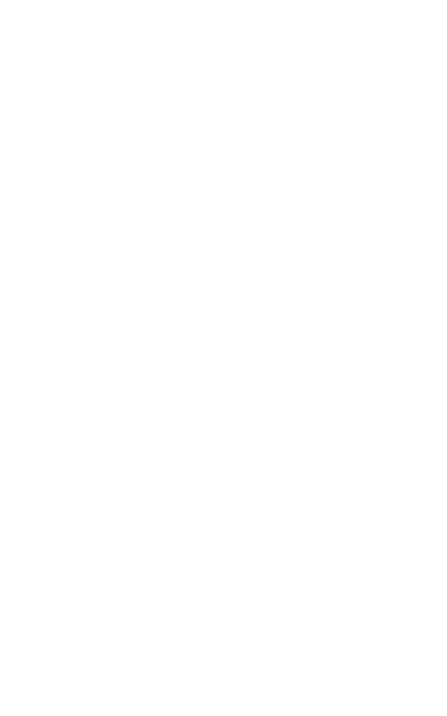

<IPython.core.display.Javascript object>


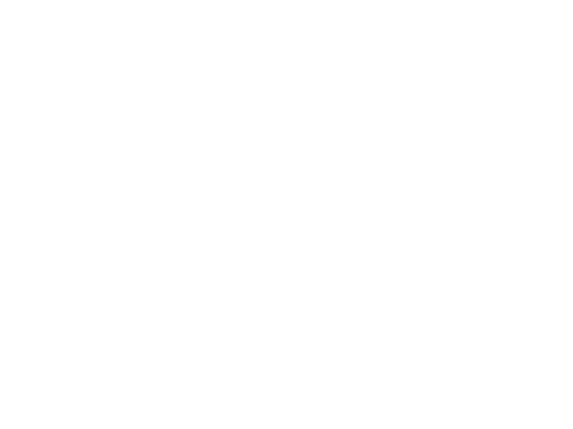

<IPython.core.display.Javascript object>


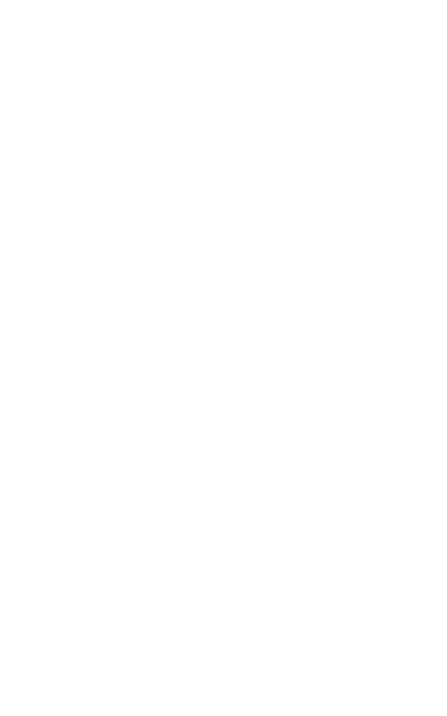

<IPython.core.display.Javascript object>


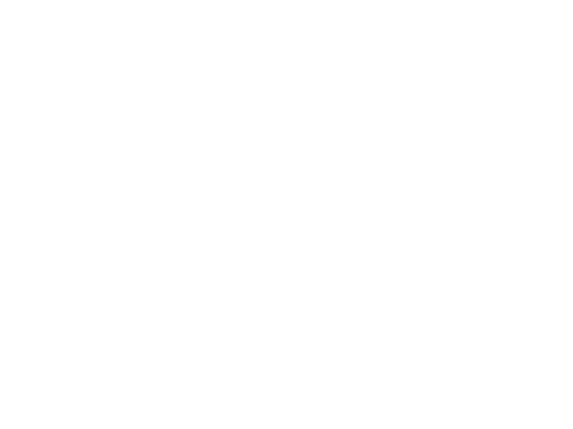

<IPython.core.display.Javascript object>


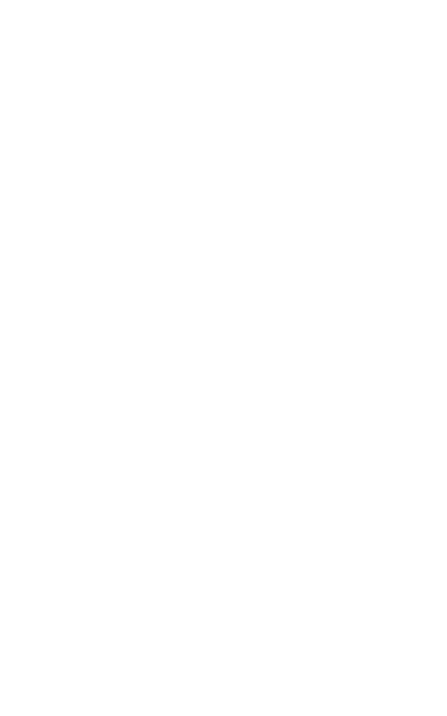

<IPython.core.display.Javascript object>


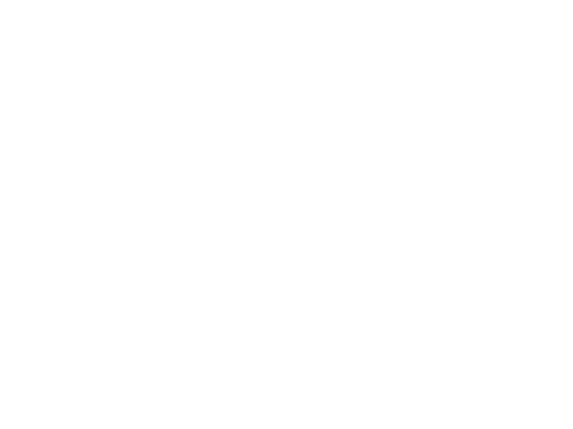

<IPython.core.display.Javascript object>


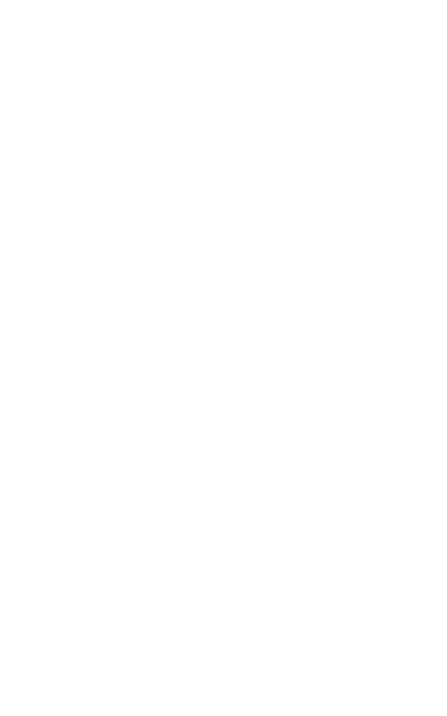

<IPython.core.display.Javascript object>


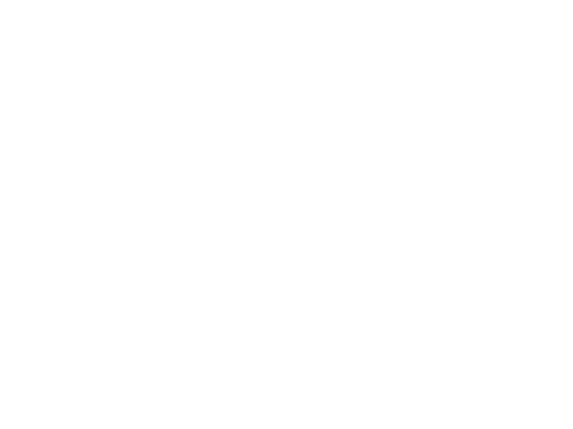

<IPython.core.display.Javascript object>


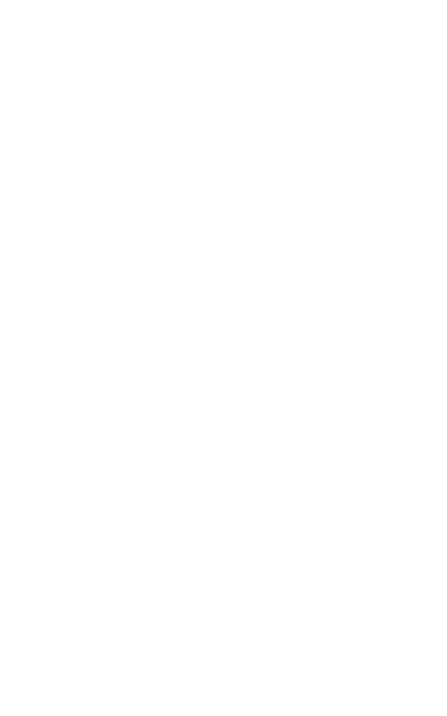

<IPython.core.display.Javascript object>


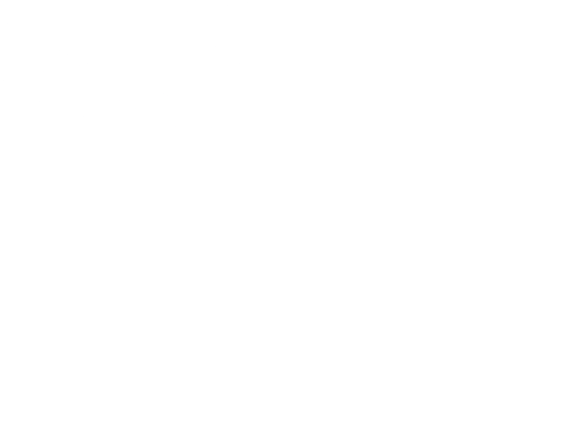

<IPython.core.display.Javascript object>


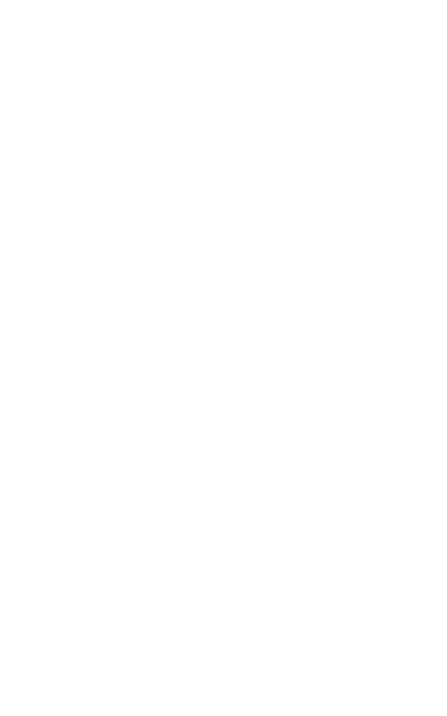

<IPython.core.display.Javascript object>


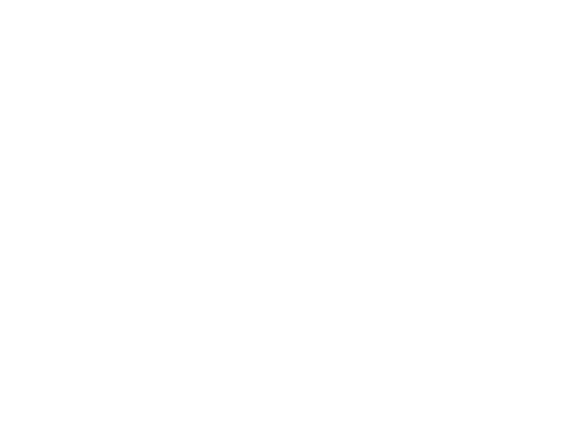

<IPython.core.display.Javascript object>


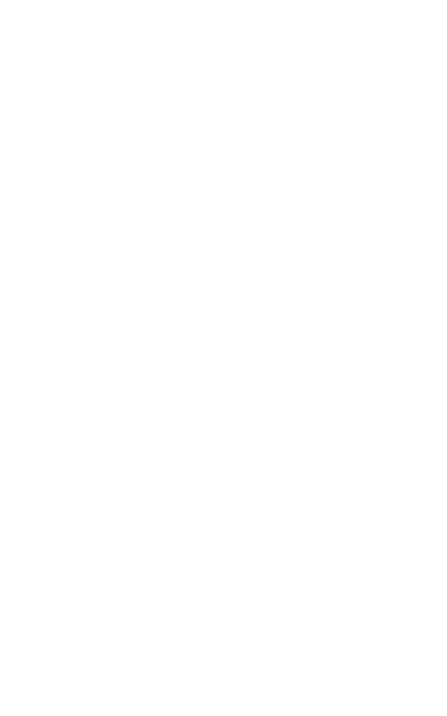

<IPython.core.display.Javascript object>


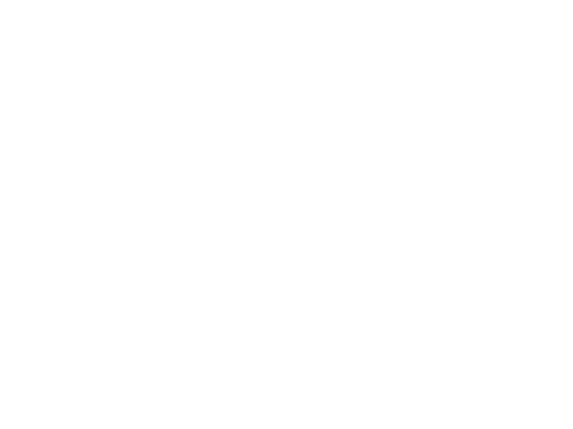

<IPython.core.display.Javascript object>


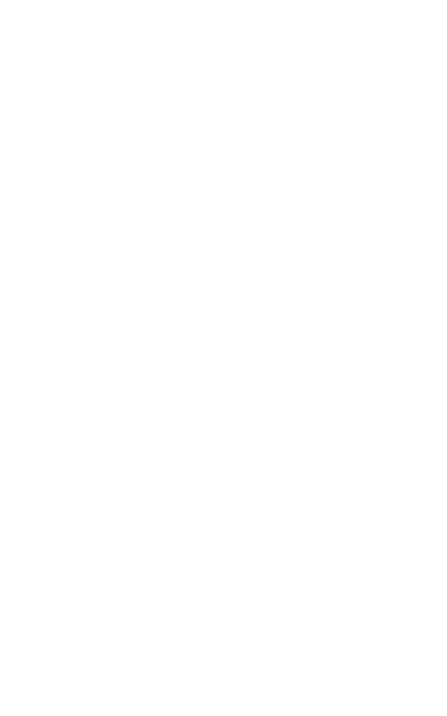

<IPython.core.display.Javascript object>


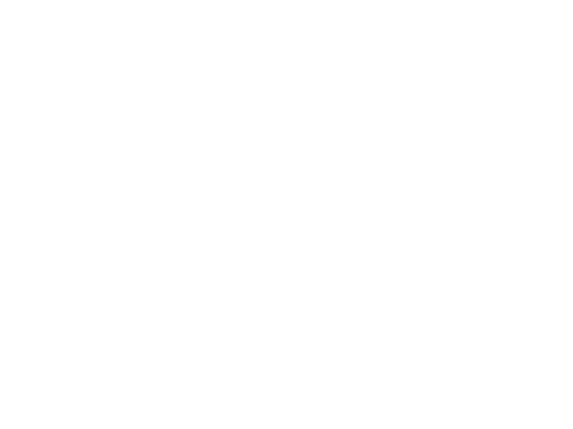

<IPython.core.display.Javascript object>


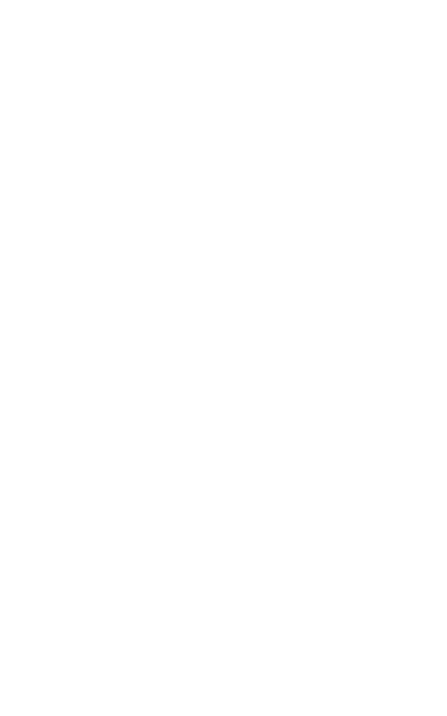

<IPython.core.display.Javascript object>


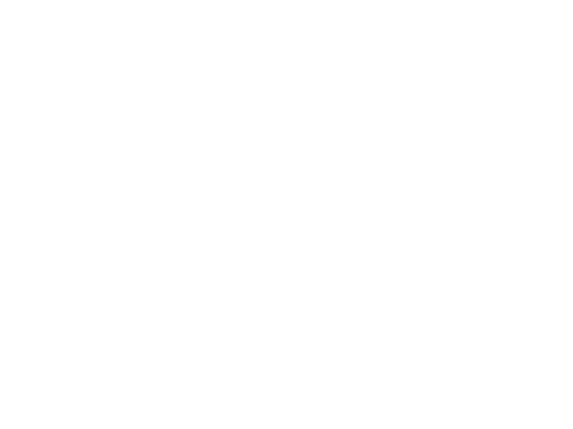

<IPython.core.display.Javascript object>


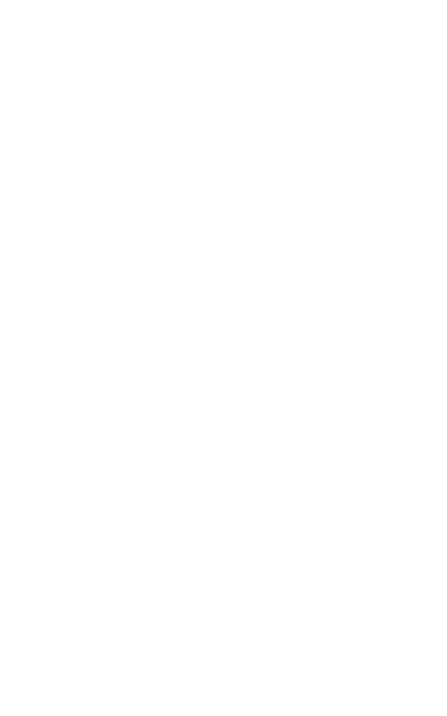

<IPython.core.display.Javascript object>


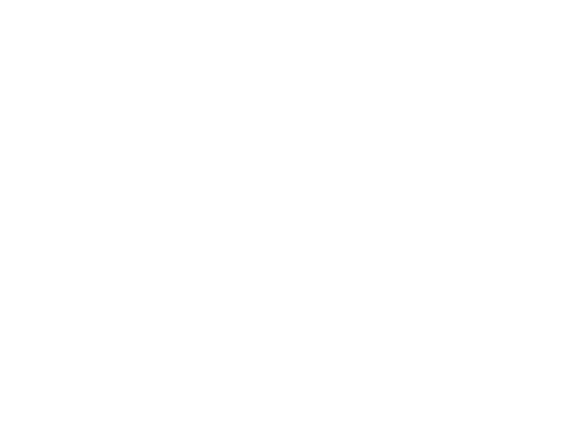

<IPython.core.display.Javascript object>


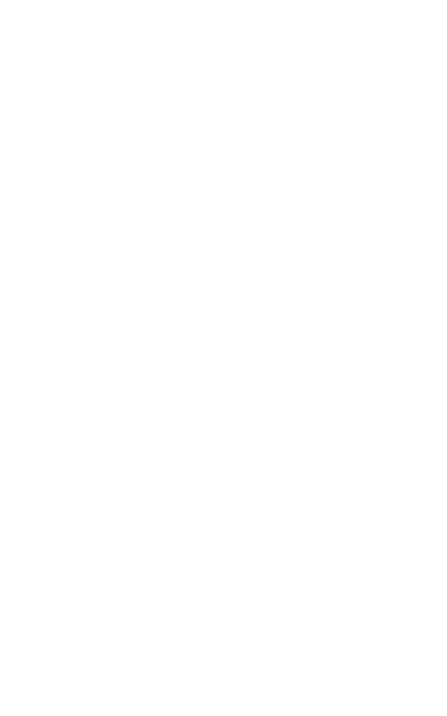

<IPython.core.display.Javascript object>


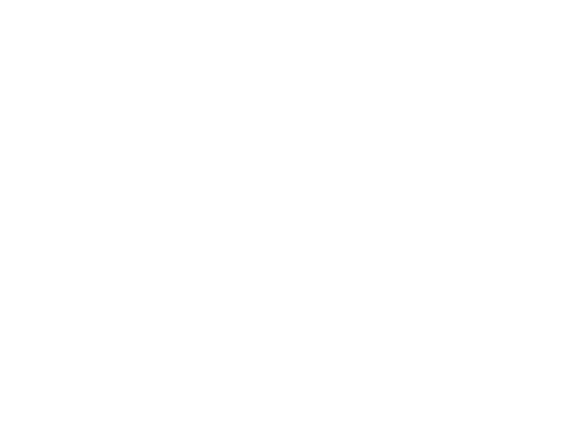

<IPython.core.display.Javascript object>


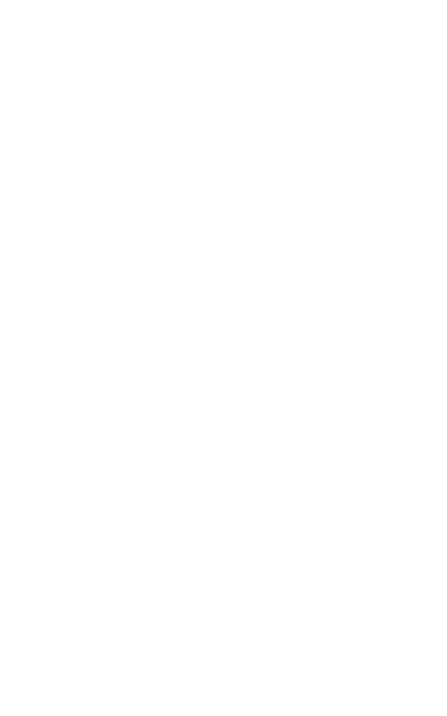

<IPython.core.display.Javascript object>


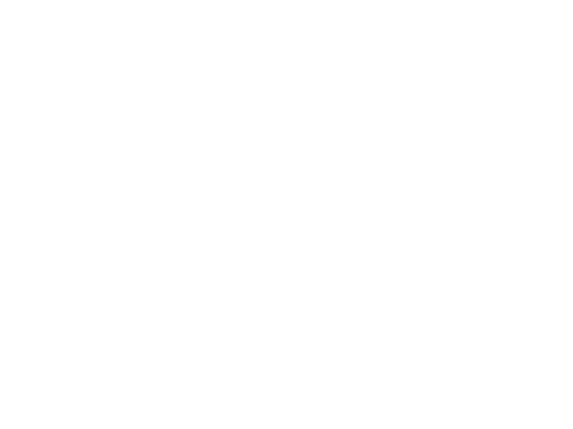

<IPython.core.display.Javascript object>


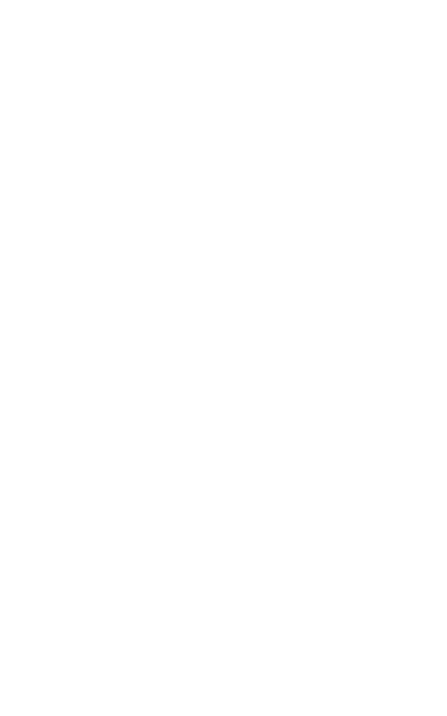

<IPython.core.display.Javascript object>


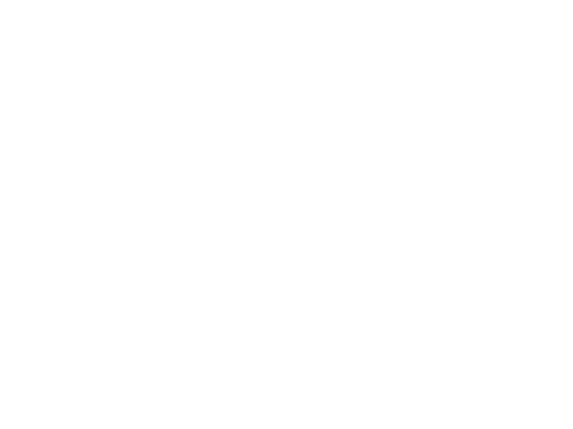

<IPython.core.display.Javascript object>


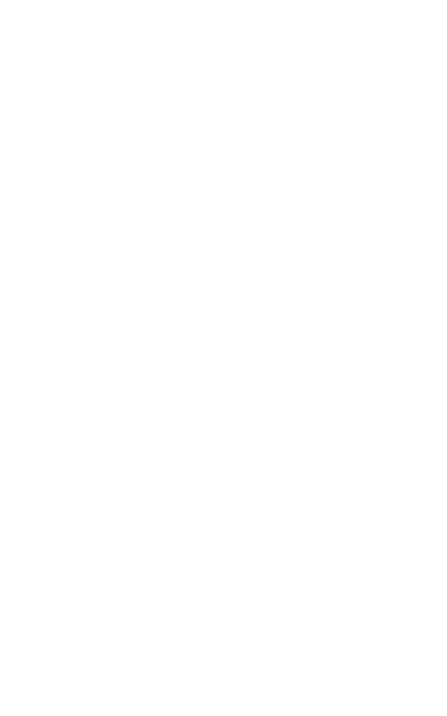

<IPython.core.display.Javascript object>


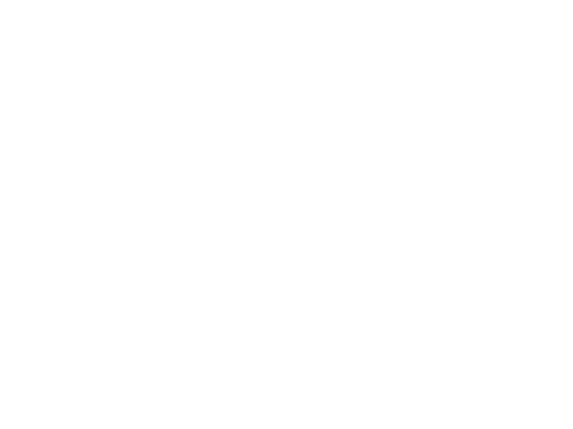

In [25]:
for cell_class in all_cell_labels.keys():
    for cluster_name in all_cell_labels[cell_class]:
        plt.figure(figsize = [5,8])
        X = (clustervals[cluster_name]/tvals[cell_class]).fillna(0)

        cells_to_plot_name = cluster_name
        parent_class_name = cell_class



        for ii,classname in  enumerate(tdf.class_label.unique()[::-1]):
            plt.plot( tvals[classname],Y, label  = classname, linestyle = linestyles[ii], color = 'grey' )

        plt.gca().set_xlabel("cells in dataset")
        plt.gca().set_ylabel("normalized cortical depth")
        plt.legend()
        ax2 = plt.gca().twiny()


        ax2.plot(X ,Y,label  = cells_to_plot_name+" fraction\nof "+parent_class_name+" Cells")
        ax2.set_xlabel("fraction of "+parent_class_name+" Cells", color = "C0")
        ax2.fill_betweenx(Y, X, color = "C1", alpha = 0.3)

        plt.gca().set(ylim = [np.max(depth_bins), np.min(depth_bins)-.1])
        plt.legend()
        plt.savefig(Path("../figures").joinpath( cells_to_plot_name + "_depth.svg"))
        #plt.savefig(Path("../figures").joinpath( cells_to_plot_name + "_depth.png"))
        
        
        plt.clf()
        # gabaergic
        cells_to_plot = tdf.loc[tdf.slice_id == slice_id].loc[tdf.label==cluster_name]
        cells_to_plot_name = cluster_name


        plt.figure()
        plt.title("slice_id: "+slice_id)


        plt.plot(cells_to_plot["center_y"],cells_to_plot["center_x"],'.', markersize=8, label =  cells_to_plot_name)


        plt.plot(all_cells["center_y"],all_cells["center_x"],'.', color = "grey", alpha = 0.3)
        plt.plot(L6b["center_y"],L6b["center_x"],'.', color = "k", alpha = 0.4, label = "Layer 6b")
        plt.plot(VLMC["center_y"],VLMC["center_x"],'.', color = "purple", alpha = 0.4, label = "Pia (VLMC)")






        plt.legend()
        plt.axis('equal')
        plt.savefig(Path("../figures/").joinpath(cells_to_plot_name+"_locations.svg"))
        #plt.savefig(Path("../figures/").joinpath(cells_to_plot_name+"_locations.png"))

        plt.clf()

## And for subclasses

In [208]:
linestyles = [ 'solid', 'dotted', 'dashed', 'dashdot']


all_subclasses =np.unique([name[0] for name in subclassvals.keys()])

glutamatergic_subclass = [name for name in all_subclasses if tdf[tdf.subclass==name].class_label.iloc[0] == "Glutamatergic"]
glutamatergic_colors = ['#C4EC04', '#09CCC6', '#0D5B78', '#50B2AD', '#3E9E64','#2D8CB8','#A19922','#5100FF','#53377D']
gabaergic_subclass = [name for name in all_subclasses if tdf[tdf.subclass==name].class_label.iloc[0] == "GABAergic"]
gabaergic_colors = ['#DA808C','#D93137','#D633FF','#FF9900','#ECD704','#B864CC']
nonneuronal_subclass = ['Astrocyte','OPC','Oligodendrocyte']
nonneural_subclass = ['Endothelial','Microglia-PVM','Pericyte','SMC','VLMC','other']
nonneuronal_colors = ['#665C47','#2E3E39','#374A45']
nonneural_colors = ['#8D6C62','#94AF97','#665547','#697255','#807059','#697255','black']
all_cell_subclass_labels = {"GABAergic":gabaergic_subclass, "Glutamatergic":glutamatergic_subclass, "Non-Neural":nonneural_subclass, "Non-Neuronal": nonneuronal_subclass}
all_color_labels = {"Lamp5":['#DA808C'],"Pvalb":['#D93137'],"Sncg":['#D633FF'],"Sst":['#FF9900'],"Sst Chodl":['#ECD704'],"Vip":['#B864CC'],"L2-3 IT":['#C4EC04'],"L4-5 IT":['#09CCC6'],"L5 ET":['#0D5B78'],"L5 IT":['#50B2AD'],"L5-6 NP":['#3E9E64'],"L6 CT":['#2D8CB8'],"L6 IT":['#A19922'],"L6 IT Car3":['#5100FF'],"L6b":['#53377D'],"Endothelial":['#8D6C62'],"Microglia-PVM":['#94AF97'],"Pericyte":['#665547'],"SMC":['#807059'],"VLMC":['#697255'],"other":['#697255'],"Astrocyte":['#665C47'],"OPC":['#2E3E39'],"Oligodendrocyte":['#374A45']}

all_cell_subclass_labels

{'GABAergic': ['Lamp5', 'Pvalb', 'Sncg', 'Sst', 'Sst Chodl', 'Vip'],
 'Glutamatergic': ['L2-3 IT',
  'L4-5 IT',
  'L5 ET',
  'L5 IT',
  'L5-6 NP',
  'L6 CT',
  'L6 IT',
  'L6 IT Car3',
  'L6b'],
 'Non-Neural': ['Endothelial',
  'Microglia-PVM',
  'Pericyte',
  'SMC',
  'VLMC',
  'other'],
 'Non-Neuronal': ['Astrocyte', 'OPC', 'Oligodendrocyte']}

In [209]:
for cell_class in all_cell_subclass_labels.keys():

    for subclass_name in all_cell_subclass_labels[cell_class]:
        for subclass_color in all_color_labels[subclass_name]:
            plt.figure(figsize = [5,8])
            X = (subclassvals[subclass_name]/tvals[cell_class]).fillna(0)

            cells_to_plot_name = subclass_name
            parent_class_name = cell_class
            colors_toplot = subclass_color


            for ii,classname in  enumerate(tdf.class_label.unique()[::-1]):
                plt.plot( tvals[classname],Y, label  = classname, linestyle = linestyles[ii], color = 'lightgrey' )

            plt.gca().set_xlabel("cells in dataset")
            plt.gca().set_ylabel("normalized cortical depth")
            plt.legend()
            ax2 = plt.gca().twiny()


            ax2.plot(X ,Y,label  = cells_to_plot_name+" fraction\nof "+parent_class_name+" Cells", color = colors_toplot)
            ax2.set_xlabel("fraction of "+parent_class_name+" Cells", color = "C0")
            ax2.fill_betweenx(Y, X, color = colors_toplot, alpha = 0.3)

            plt.gca().set(ylim = [np.max(depth_bins), np.min(depth_bins)-.1])
            plt.legend()
            plt.savefig(Path("../figures").joinpath( "subclass_"+cells_to_plot_name + "_depth.svg"))
            #plt.savefig(Path("../figures").joinpath( "subclass_"+cells_to_plot_name + "_depth.png"))


            plt.clf()
            cells_to_plot = tdf.loc[tdf.slice_id == slice_id].loc[tdf.subclass==subclass_name]


            plt.figure()
            plt.title("slice_id: "+slice_id)


            plt.plot(cells_to_plot["center_y"],cells_to_plot["center_x"],'.', markersize=8, label =  cells_to_plot_name, color = colors_toplot)
            plt.title("")


            plt.plot(all_cells["center_y"],all_cells["center_x"],'.', color = "lightgrey", alpha = 0.2)
            plt.plot(L6b["center_y"],L6b["center_x"],'.', color = "k", alpha = 0.2, label = "Layer 6b")
            plt.plot(VLMC["center_y"],VLMC["center_x"],'.', color = "purple", alpha = 0.2, label = "Pia (VLMC)")






            plt.legend()
            plt.axis('equal')
            plt.savefig(Path("../figures/").joinpath("subclass_"+cells_to_plot_name+"_locations.svg"))
            #plt.savefig(Path("../figures/").joinpath("subclass_"+cells_to_plot_name+"_locations.png"))

            plt.clf()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [207]:
tvals[classname]
len(tvals[classname])
#linestyles[ii]
ii

3

## Now let's plot some exemplar data for L5_PT and Chandelier cells

In [12]:
# we'll use one slice for both examples, and highlight the pia and L6b to mark the cortex

slice_id = "mouse2_slice160"
all_cells = tdf.loc[tdf.slice_id == slice_id]
L6b = tdf.loc[tdf.slice_id==slice_id].loc[tdf.subclass=="L6b"]
VLMC = tdf.loc[tdf.slice_id==slice_id].loc[tdf.subclass=="VLMC"]


In [35]:
# Chandelier cells
cells_to_plot = tdf.loc[tdf.slice_id == slice_id].loc[tdf["chandelier_cluster"]]
cells_to_plot_name = "Chandelier"


plt.figure()
plt.title("")
plt.axis('off')

plt.plot(cells_to_plot["center_y"],cells_to_plot["center_x"],'.', markersize=8, label =  cells_to_plot_name, alpha = 1, color = 'red')


plt.plot(all_cells["center_y"],all_cells["center_x"],'.', color = "whitesmoke", alpha = 0.2)
plt.plot(L6b["center_y"],L6b["center_x"],'.', color = "k", alpha = 0.2, label = "Layer 6b")
plt.plot(VLMC["center_y"],VLMC["center_x"],'.', color = "purple", alpha = 0.2, label = "Pia (VLMC)")






plt.legend()
plt.axis('equal')
plt.savefig(Path("../figures/").joinpath(cells_to_plot_name+"_locations.png"))
plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


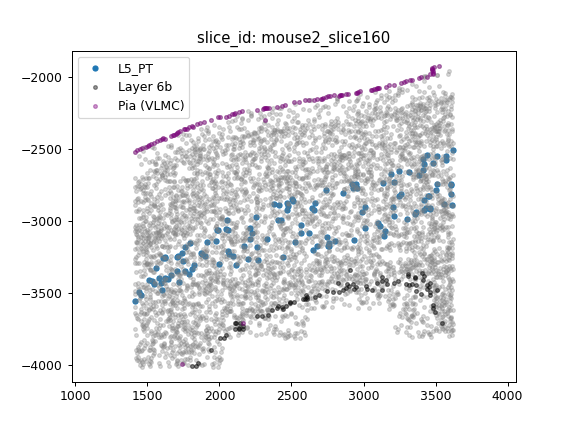

In [17]:
# Chandelier cells
cells_to_plot = tdf.loc[tdf.slice_id == slice_id].loc[tdf["subclass"]=="L5_PT"]
cells_to_plot_name = "L5_PT"


plt.figure()
plt.title("slice_id: "+slice_id)



plt.plot(cells_to_plot["center_y"],cells_to_plot["center_x"],'.', markersize=8, label =  cells_to_plot_name)


plt.plot(all_cells["center_y"],all_cells["center_x"],'.', color = "grey", alpha = 0.3)
plt.plot(L6b["center_y"],L6b["center_x"],'.', color = "k", alpha = 0.4, label = "Layer 6b")
plt.plot(VLMC["center_y"],VLMC["center_x"],'.', color = "purple", alpha = 0.4, label = "Pia (VLMC)")






plt.legend()
plt.axis('equal')
plt.savefig(Path("../figures/").joinpath(cells_to_plot_name+"_locations.png"))

<IPython.core.display.Javascript object>


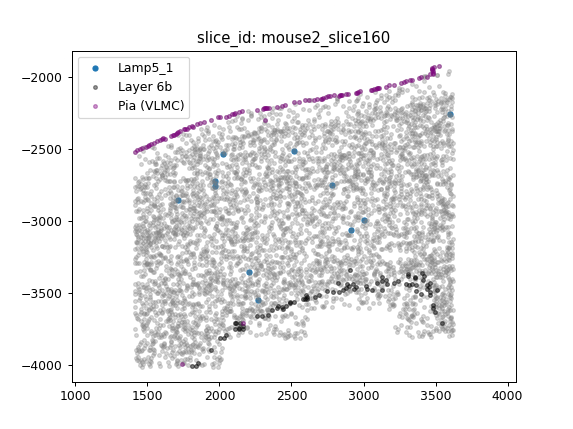

<IPython.core.display.Javascript object>


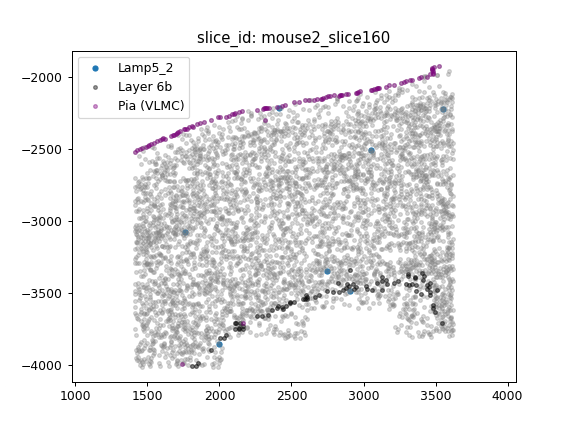

<IPython.core.display.Javascript object>


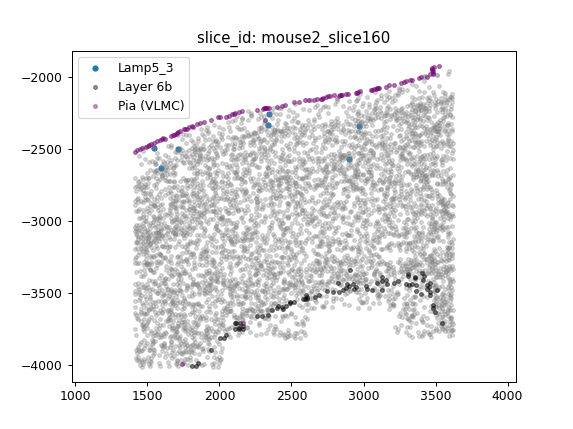

<IPython.core.display.Javascript object>


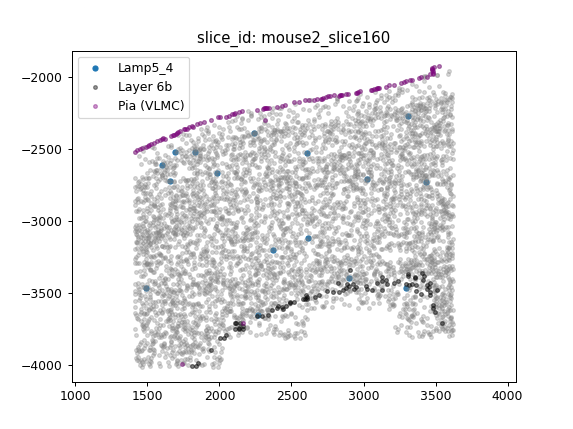

<IPython.core.display.Javascript object>


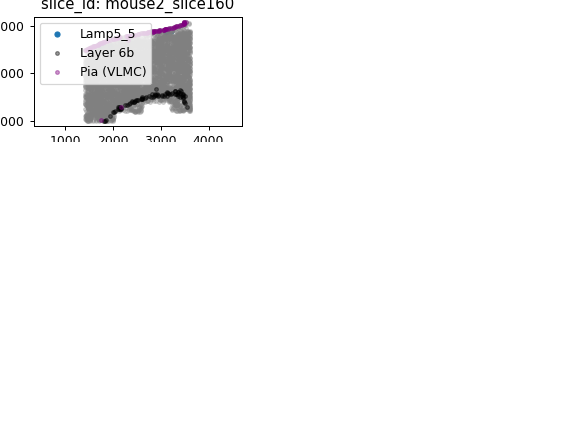

<IPython.core.display.Javascript object>


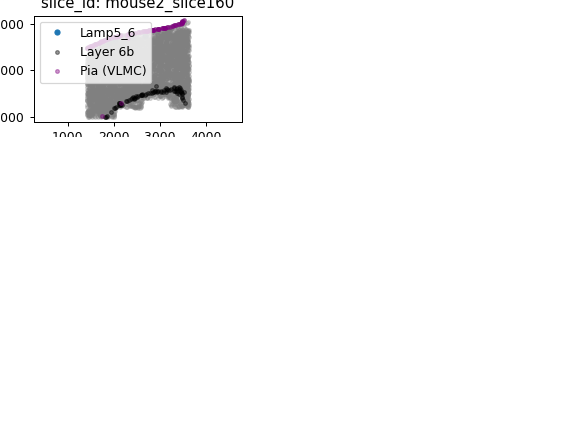

<IPython.core.display.Javascript object>


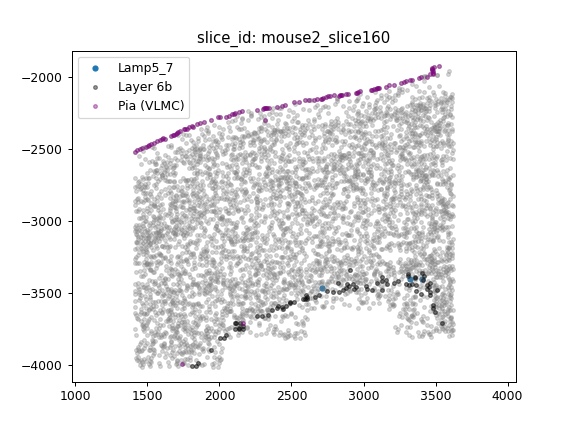

<IPython.core.display.Javascript object>


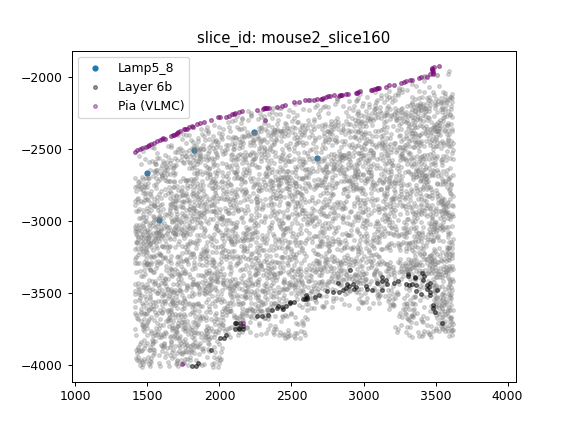

<IPython.core.display.Javascript object>


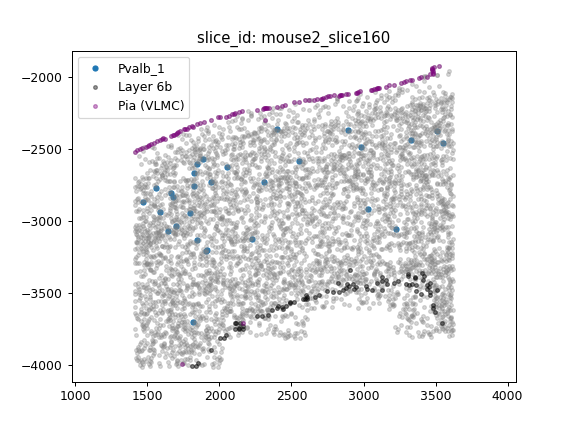

<IPython.core.display.Javascript object>


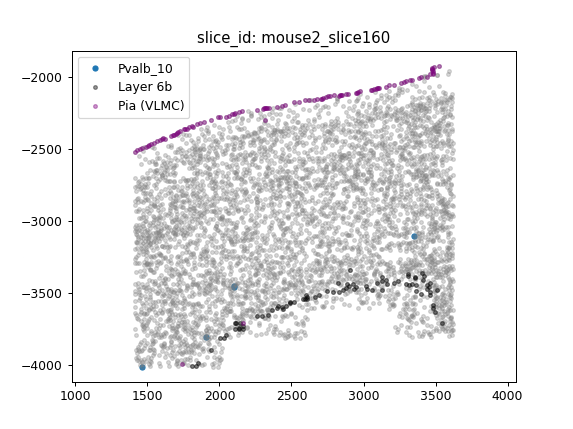

<IPython.core.display.Javascript object>


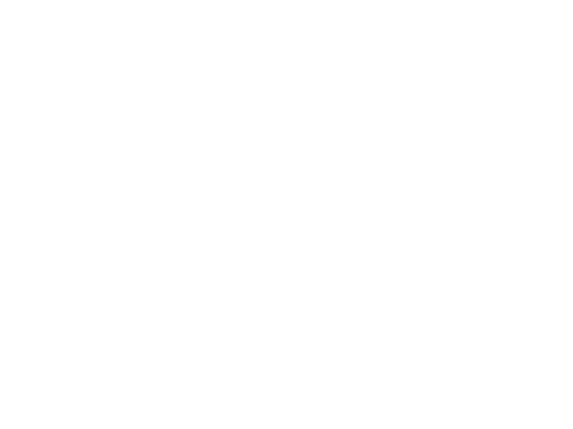

<IPython.core.display.Javascript object>


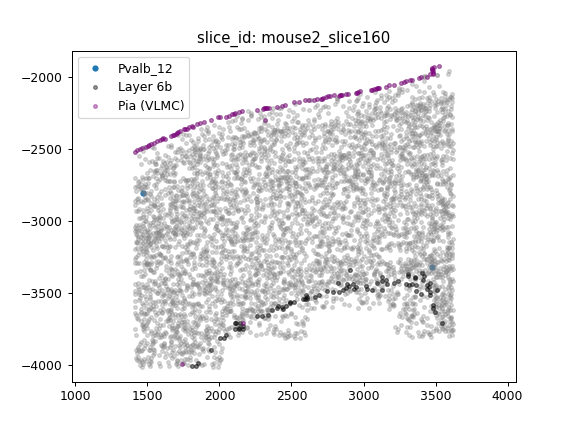

<IPython.core.display.Javascript object>


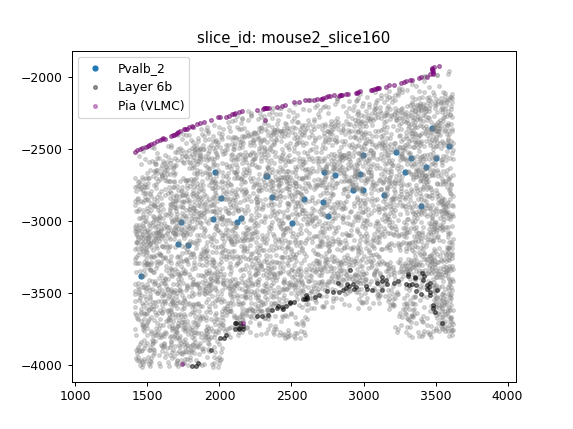

<IPython.core.display.Javascript object>


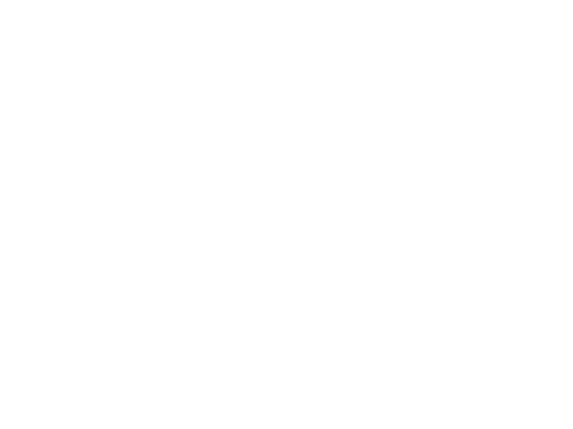

<IPython.core.display.Javascript object>


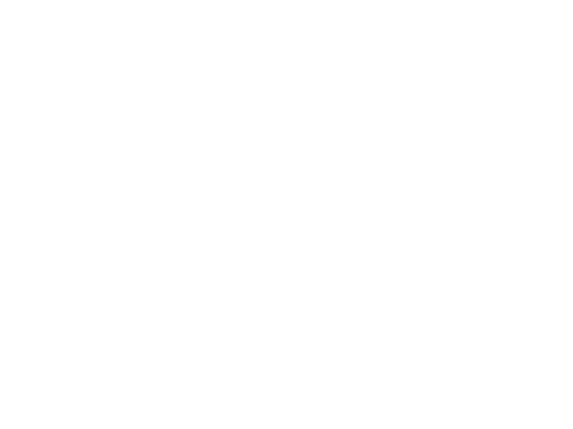

<IPython.core.display.Javascript object>


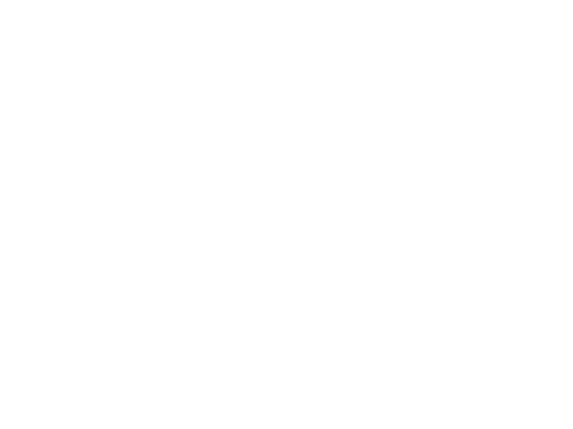

<IPython.core.display.Javascript object>


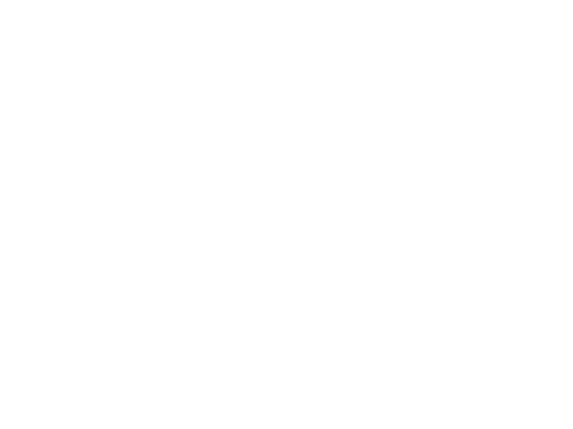

<IPython.core.display.Javascript object>


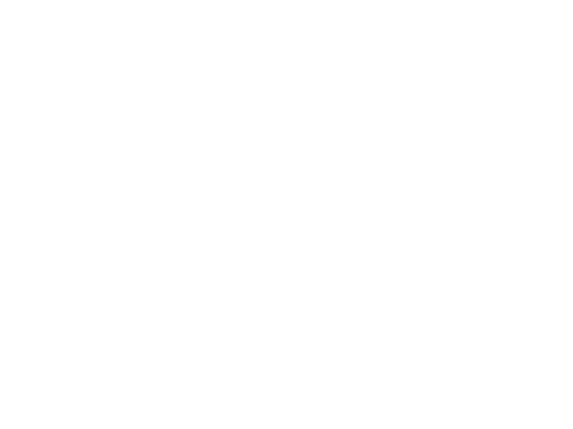

<IPython.core.display.Javascript object>


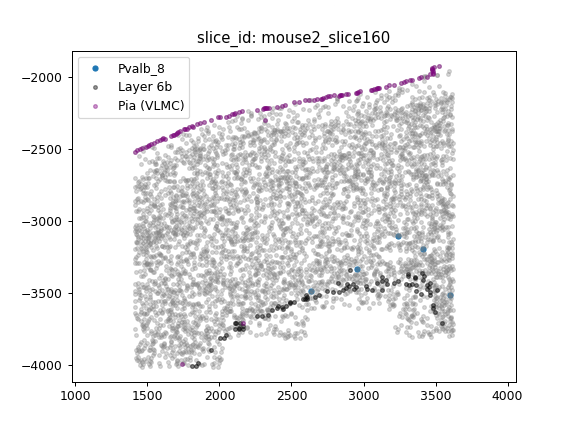

<IPython.core.display.Javascript object>


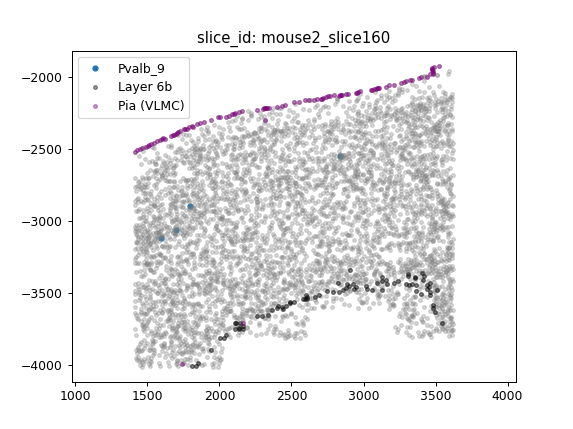

<IPython.core.display.Javascript object>


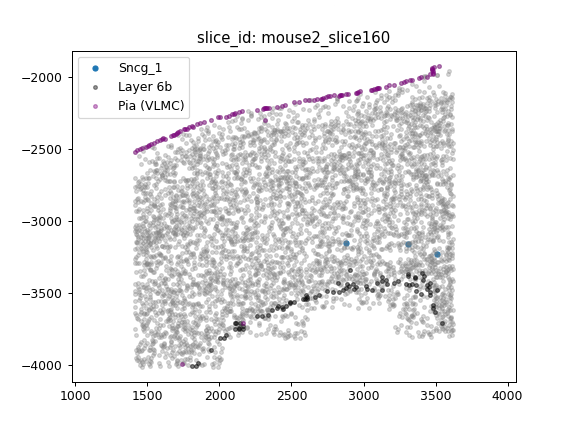

<IPython.core.display.Javascript object>


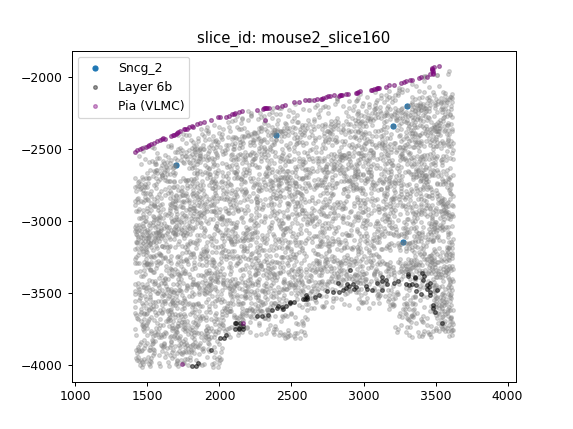

<IPython.core.display.Javascript object>


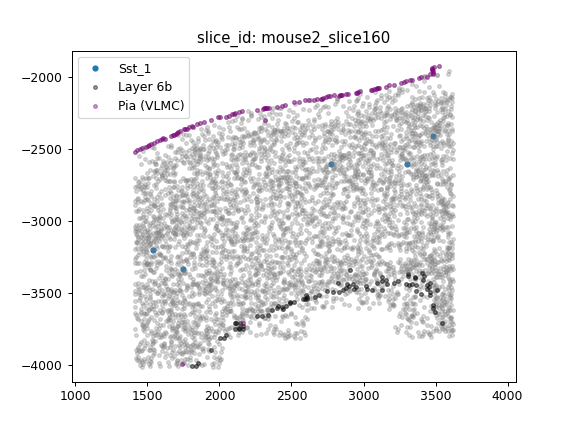

<IPython.core.display.Javascript object>


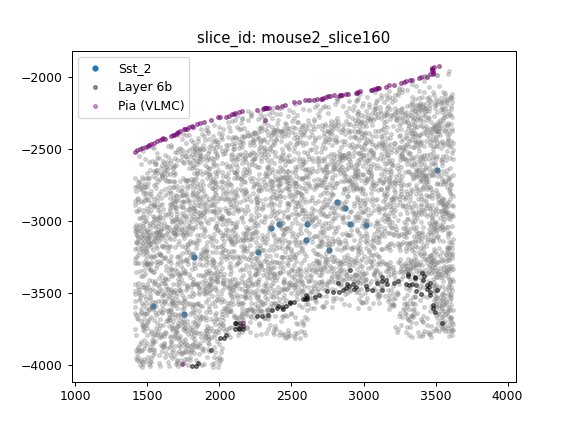

<IPython.core.display.Javascript object>


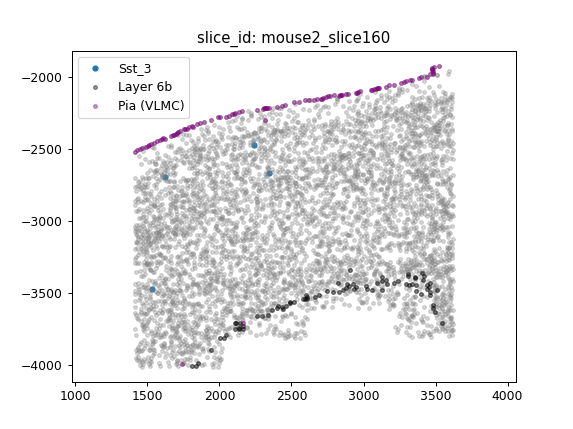

<IPython.core.display.Javascript object>


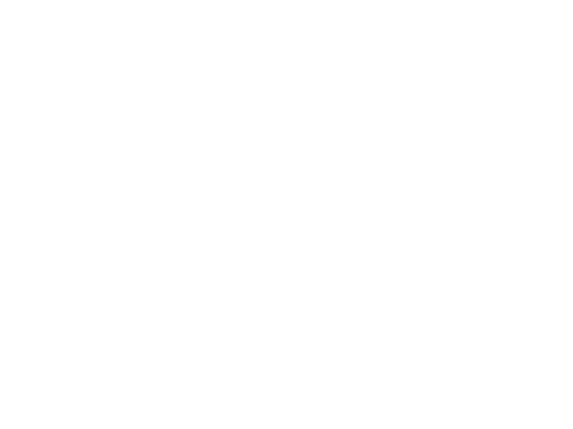

<IPython.core.display.Javascript object>


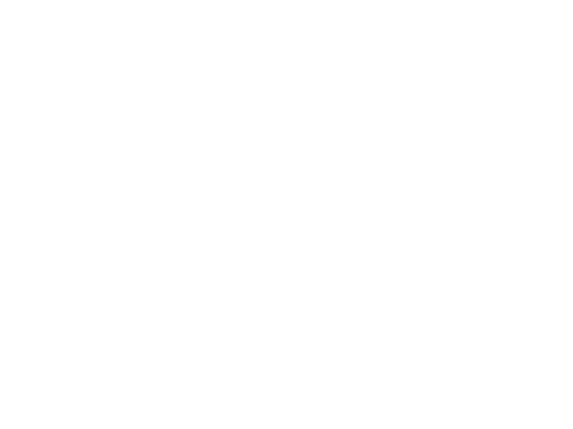

<IPython.core.display.Javascript object>


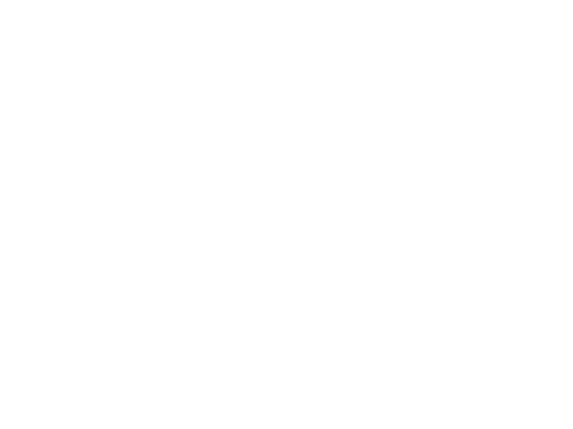

<IPython.core.display.Javascript object>


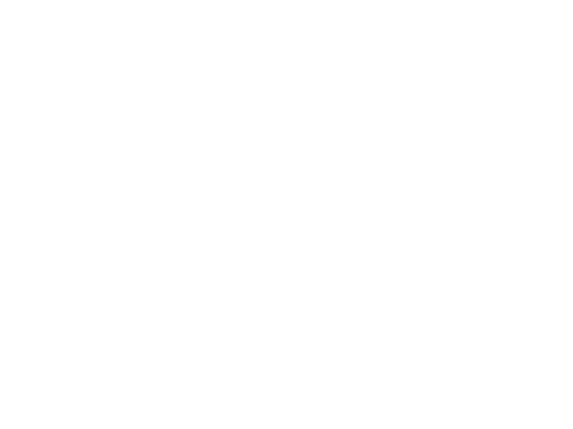

<IPython.core.display.Javascript object>


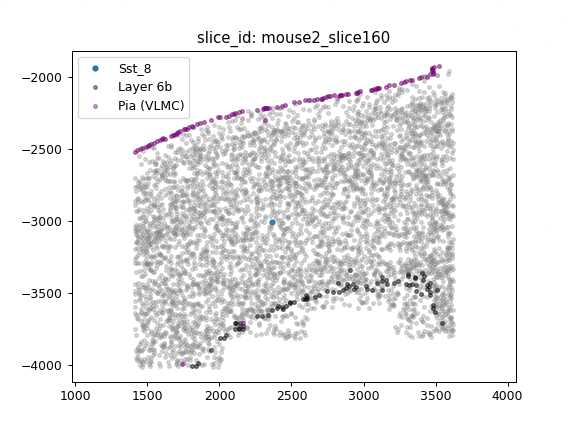

<IPython.core.display.Javascript object>


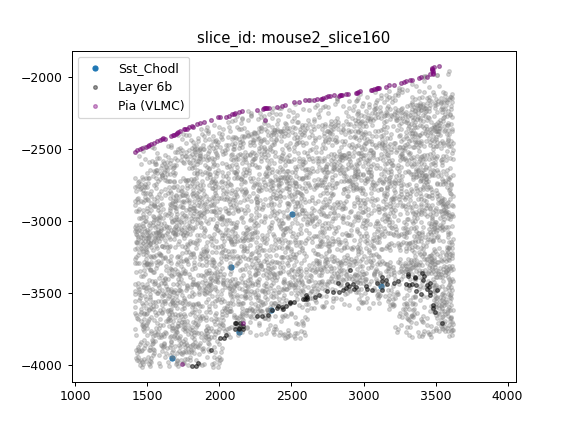

<IPython.core.display.Javascript object>


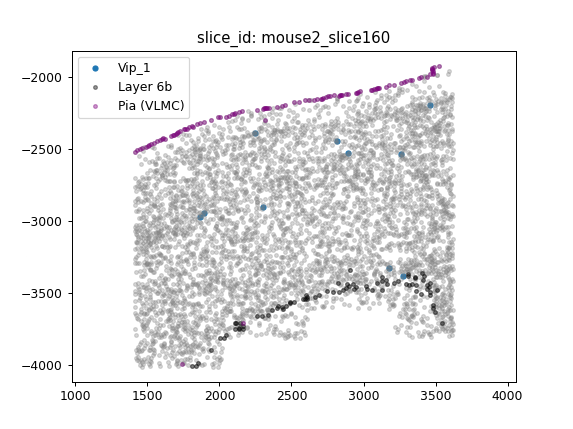

<IPython.core.display.Javascript object>


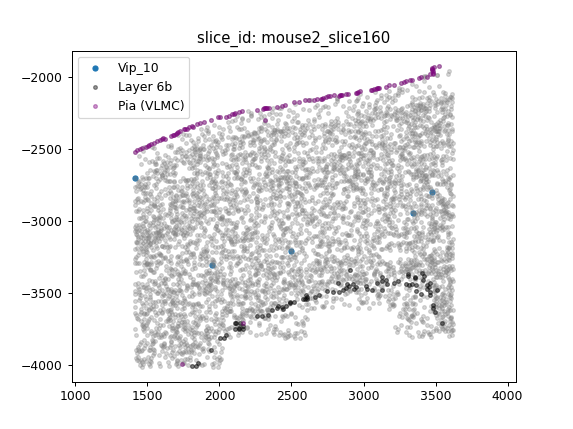

<IPython.core.display.Javascript object>


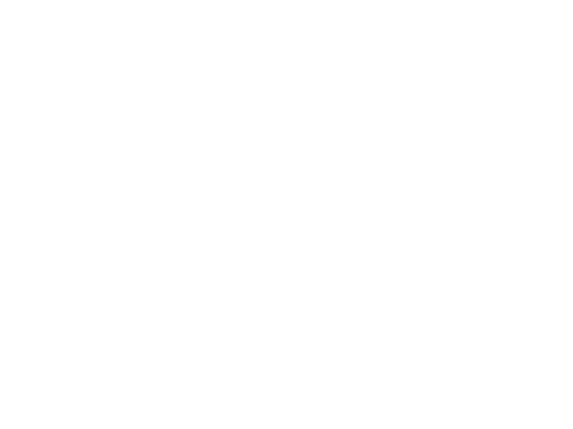

<IPython.core.display.Javascript object>


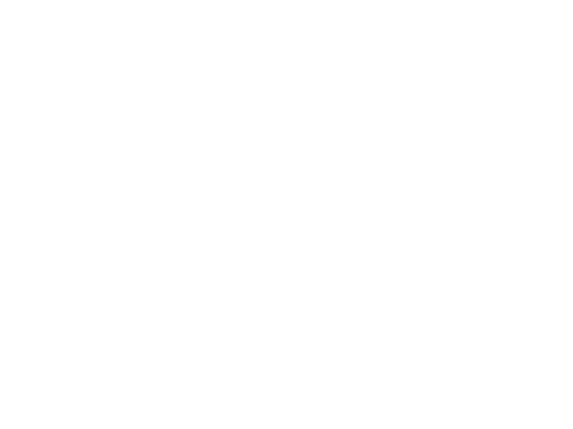

<IPython.core.display.Javascript object>


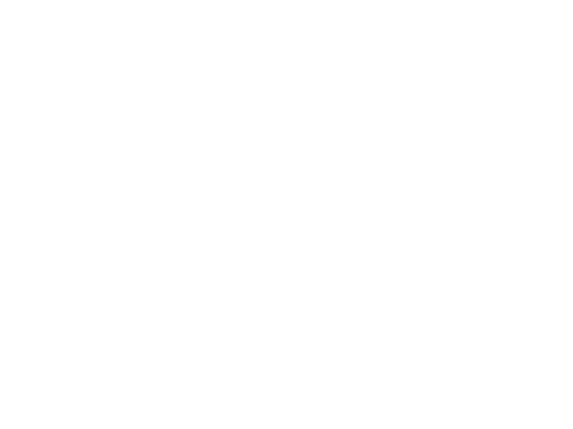

<IPython.core.display.Javascript object>


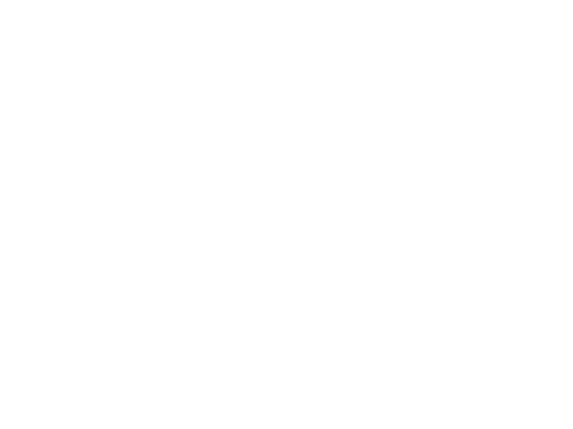

<IPython.core.display.Javascript object>


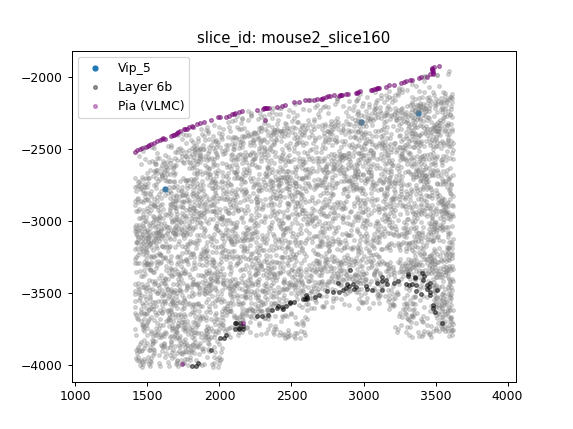

<IPython.core.display.Javascript object>


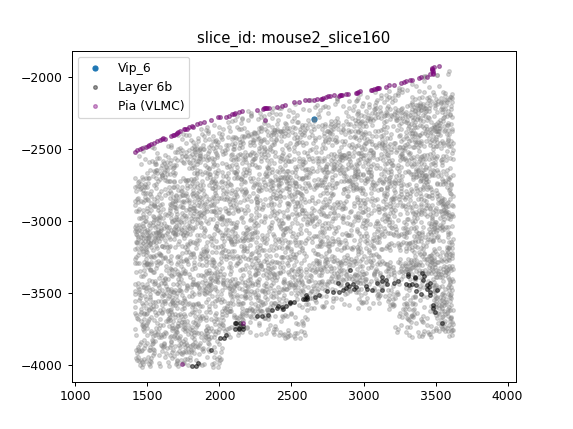

<IPython.core.display.Javascript object>


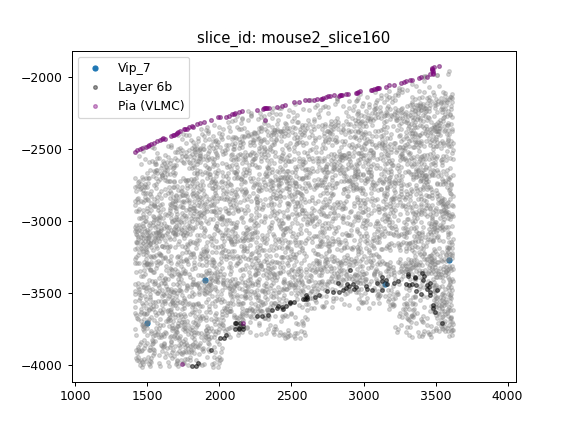

<IPython.core.display.Javascript object>


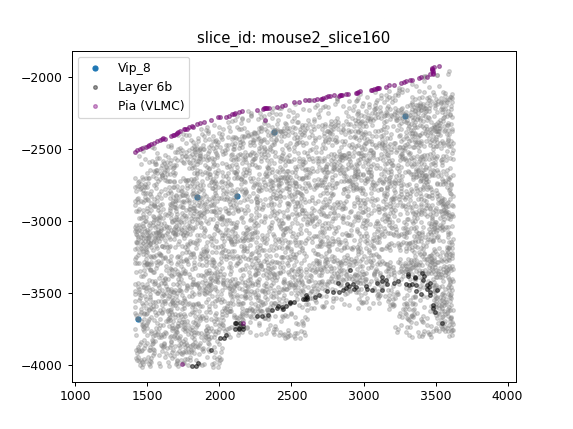

<IPython.core.display.Javascript object>


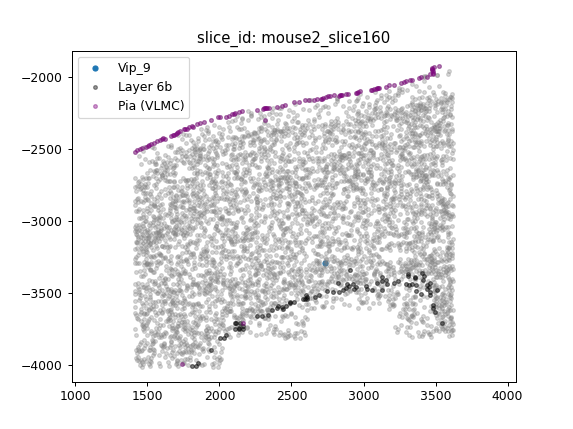

In [18]:
# gabaergic
for cluster_name in gabaergic:
    cells_to_plot = tdf.loc[tdf.slice_id == slice_id].loc[tdf.label==cluster_name]
    cells_to_plot_name = cluster_name


    plt.figure()
    plt.title("slice_id: "+slice_id)


    plt.plot(cells_to_plot["center_y"],cells_to_plot["center_x"],'.', markersize=8, label =  cells_to_plot_name)


    plt.plot(all_cells["center_y"],all_cells["center_x"],'.', color = "grey", alpha = 0.3)
    plt.plot(L6b["center_y"],L6b["center_x"],'.', color = "k", alpha = 0.4, label = "Layer 6b")
    plt.plot(VLMC["center_y"],VLMC["center_x"],'.', color = "purple", alpha = 0.4, label = "Pia (VLMC)")






    plt.legend()
    plt.axis('equal')
    plt.savefig(Path("../figures/").joinpath(cells_to_plot_name+"_locations.png"))

In [15]:
# this specimen has 5 AP locations
AP_locs = tdf.loc[tdf.sample_id==all_cells.iloc[0].sample_id]["AP_distance"].unique()
# later we will access 2 others to compare:
all_cells_P = tdf.loc[tdf.sample_id==all_cells.iloc[0].sample_id].loc[tdf.loc[tdf.sample_id==all_cells.iloc[0].sample_id]["AP_distance"]==np.max(AP_locs)]
L6b_P = all_cells_P.loc[all_cells_P.subclass=="L6b"]
VLMC_P = all_cells_P.loc[all_cells_P.subclass=="VLMC"]


all_cells_A = tdf.loc[tdf.sample_id==all_cells.iloc[0].sample_id].loc[tdf.loc[tdf.sample_id==all_cells.iloc[0].sample_id]["AP_distance"]==np.min(AP_locs)]
L6b_A = all_cells_A.loc[all_cells_A.subclass=="L6b"]
VLMC_A = all_cells_A.loc[all_cells_A.subclass=="VLMC"]


# Also plot some examples of gene expression in all cells

<IPython.core.display.Javascript object>


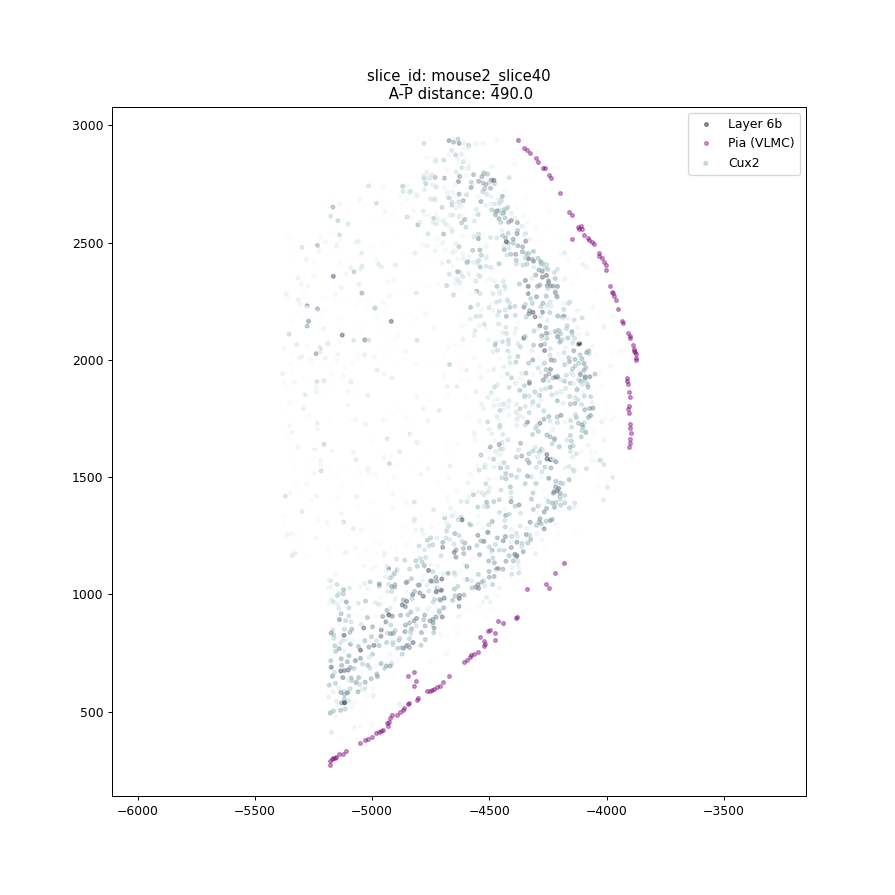

<IPython.core.display.Javascript object>


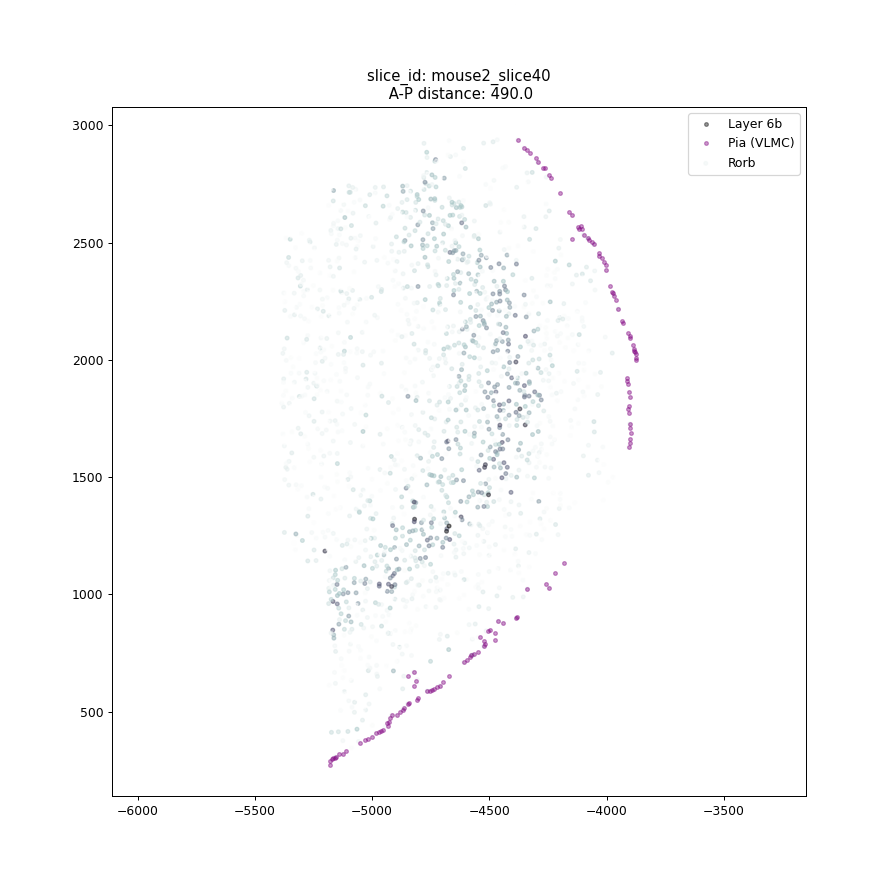

<IPython.core.display.Javascript object>


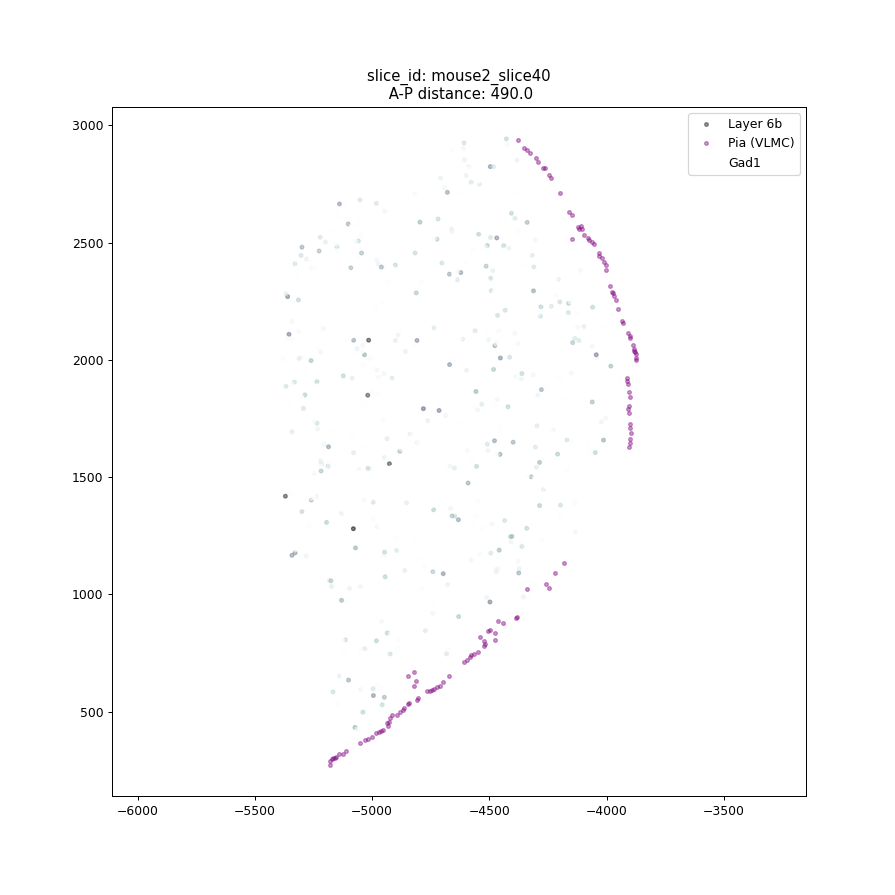

<IPython.core.display.Javascript object>


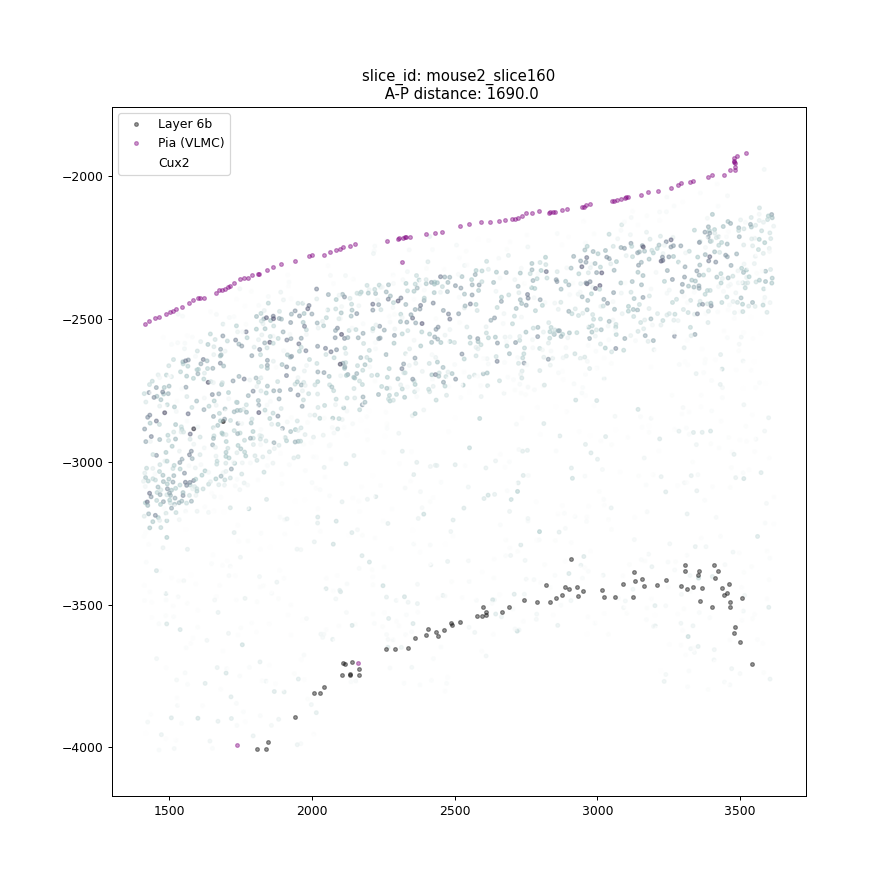

<IPython.core.display.Javascript object>


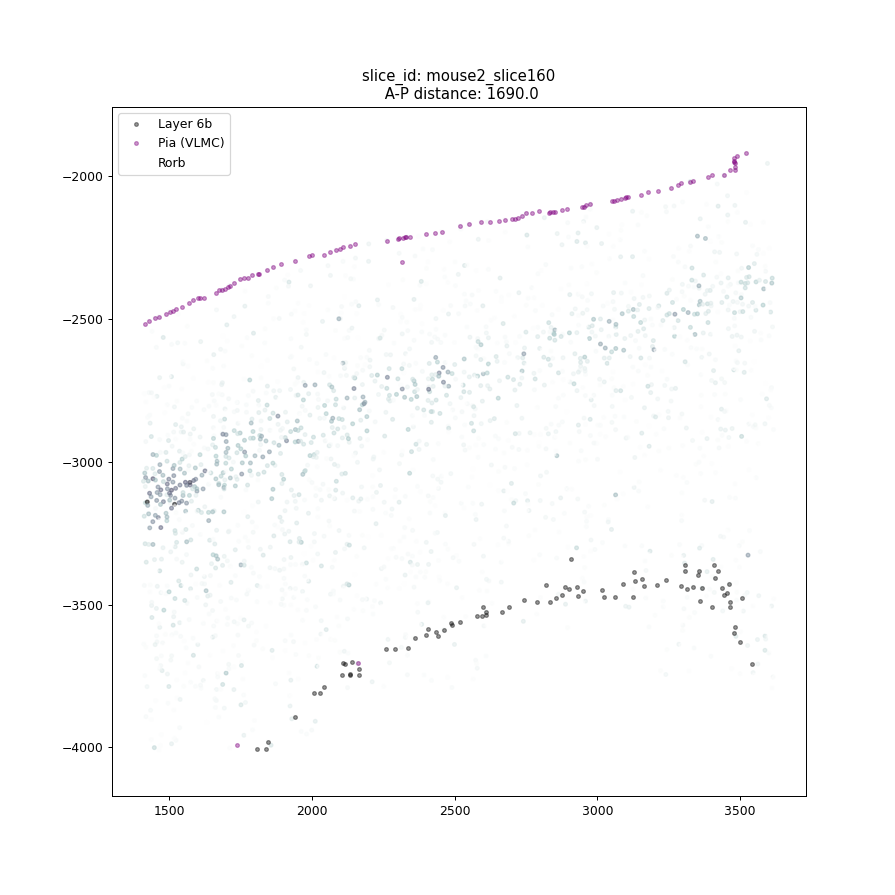

<IPython.core.display.Javascript object>


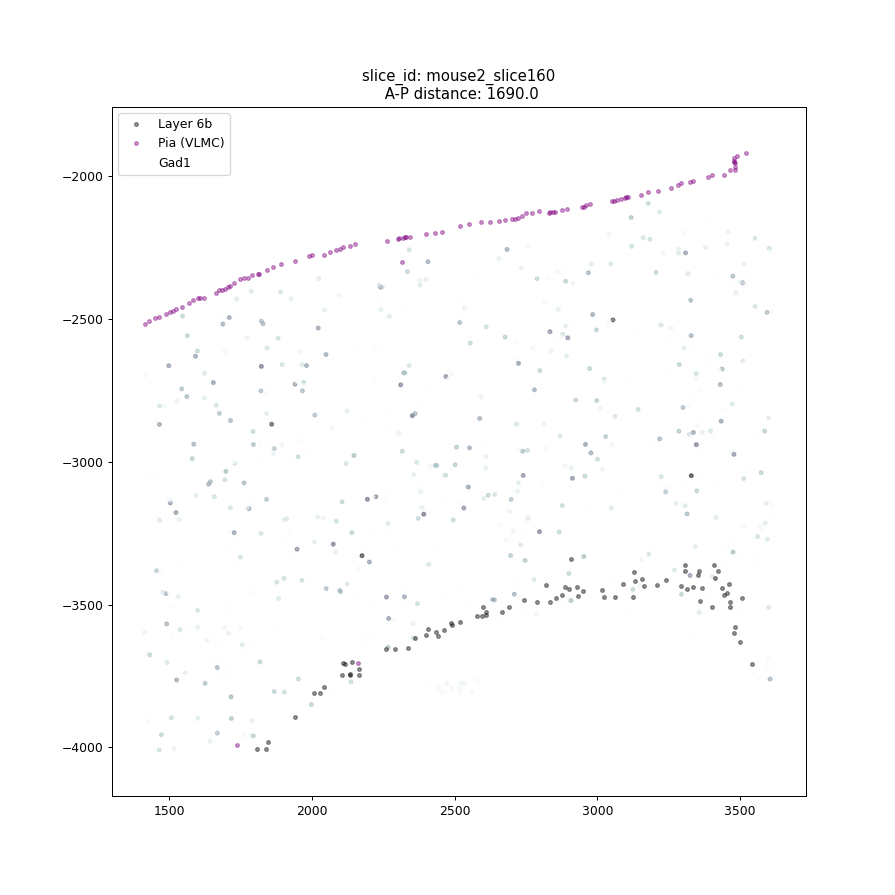

<IPython.core.display.Javascript object>


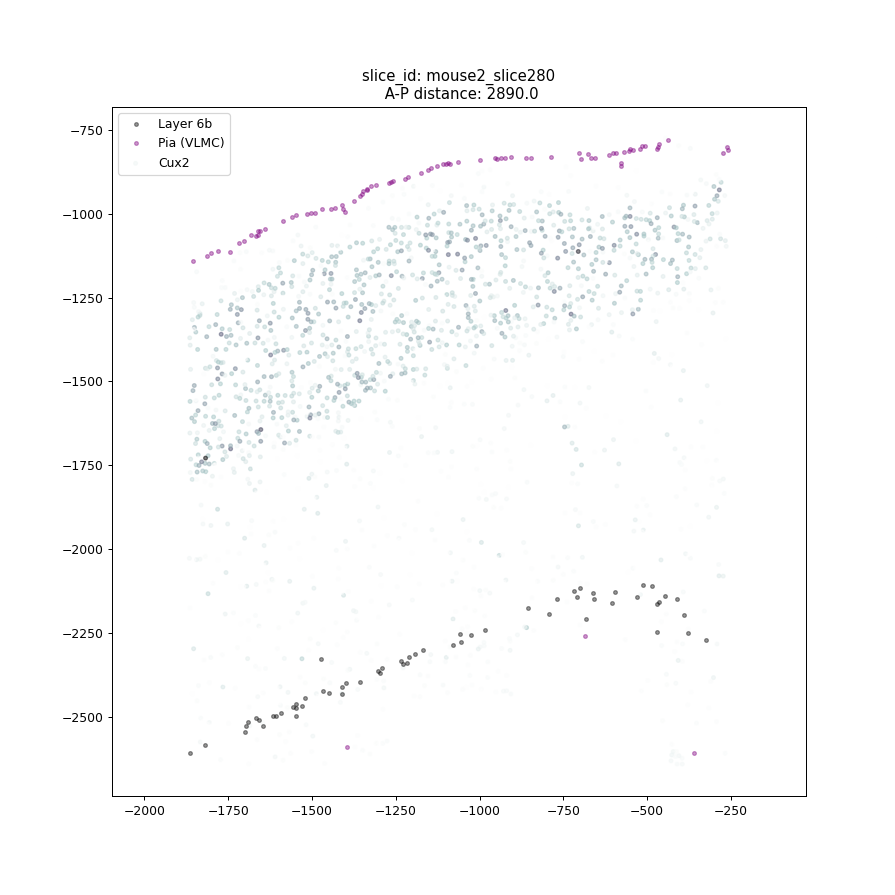

<IPython.core.display.Javascript object>


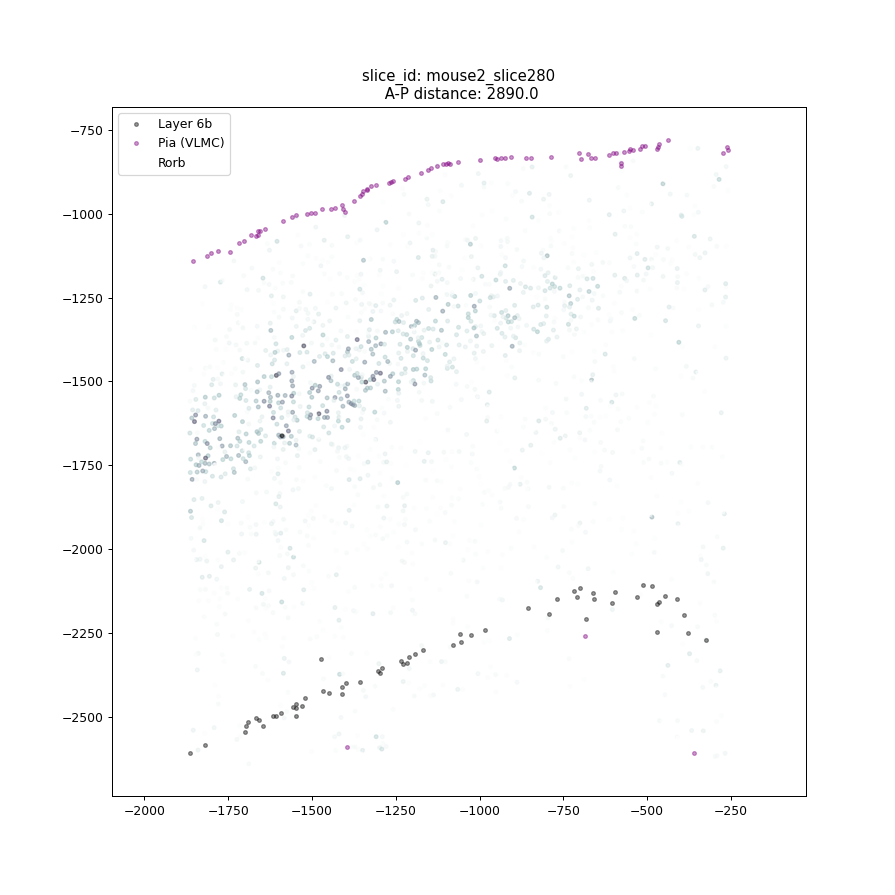

<IPython.core.display.Javascript object>


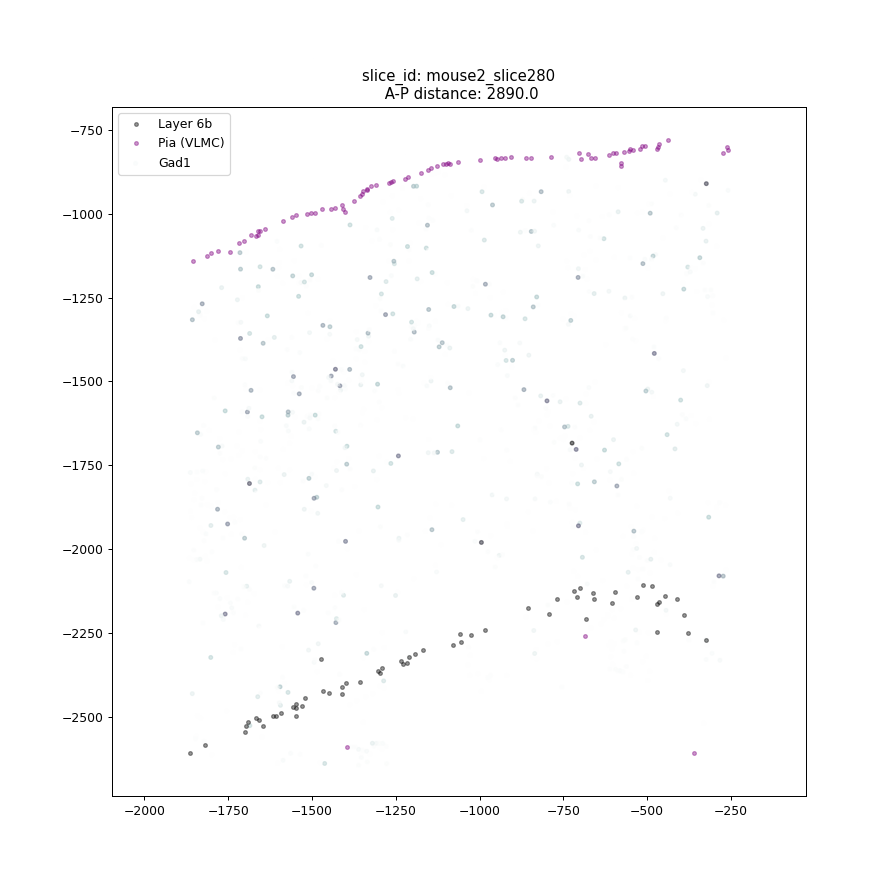

In [18]:
# genes to plot

genes_to_plot = ["Cux2", "Rorb","Gad1"]
cell_data = {"anterior":all_cells_A, "medial":all_cells,"posterior":all_cells_P}
L6b_data = {"anterior":L6b_A, "medial":L6b,"posterior":L6b_P}
VLMC_data = {"anterior":VLMC_A, "medial":VLMC,"posterior":VLMC_P}



for location in cell_data.keys():
    cells_to_plot = cell_data[location]
    for g in genes_to_plot:
        plt.figure(figsize=[10,10])
        plt.title("slice_id: "+cells_to_plot["slice_id"].unique()[0]+"\n A-P distance: "+str(cells_to_plot["AP_distance"].unique()[0]))

        colors = cbg_ad[cells_to_plot["Unnamed: 0"]][:,g].to_df().values[:,0]

        
        ## ugh: 1 section is "upright" (conventional coronal section orientation) while others are not
        if location in ["medial"]:
            plt.scatter(cells_to_plot["center_y"],cells_to_plot["center_x"], s = 9,alpha = 0.5, c = colors, cmap ='bone_r', label =g )
            plt.plot(L6b_data[location]["center_y"],L6b_data[location]["center_x"],'.', color = "k", alpha = 0.4, label = "Layer 6b")
            plt.plot(VLMC_data[location]["center_y"],VLMC_data[location]["center_x"],'.', color = "purple", alpha = 0.4, label = "Pia (VLMC)")

        else:
            plt.scatter(-cells_to_plot["center_x"],cells_to_plot["center_y"], s = 9,alpha = 0.5, c = colors, cmap ='bone_r', label =g )
            plt.plot(-L6b_data[location]["center_x"],L6b_data[location]["center_y"],'.', color = "k", alpha = 0.4, label = "Layer 6b")
            plt.plot(-VLMC_data[location]["center_x"],VLMC_data[location]["center_y"],'.', color = "purple", alpha = 0.4, label = "Pia (VLMC)")
            




        plt.legend()
        plt.axis('equal')
        plt.savefig(Path("../figures/").joinpath(location+"_"+g+"_expression.png"))

# It turns out that there are not significant differences along the AP axis... 
Plots below show this reasonably well

In [12]:
#Define 3 regions: anterior, middle, posterior:
anterior_lims = [0, 800]
middle_lims = [1100, 1900]
posterior_lims = [2500, 3300]

anterior = np.logical_and(tdf.AP_distance >= anterior_lims[0], tdf.AP_distance <= anterior_lims[1])
middle = np.logical_and(tdf.AP_distance >= middle_lims[0], tdf.AP_distance <= middle_lims[1])
posterior = np.logical_and(tdf.AP_distance >= posterior_lims[0], tdf.AP_distance <= posterior_lims[1])
tdf["AP_group"] = 0*tdf.AP_distance
tdf["AP_group"] = "no group"
tdf["AP_group"].loc[anterior] = "anterior"
tdf["AP_group"].loc[middle] = "middle"
tdf["AP_group"].loc[posterior] = "posterior"

/Users/brian/anaconda2/envs/celltypecards/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [13]:
# really?

def do_kde(values_array, bins, bandwidth = 0.01):
    """
    
    ignores NaNs
    """
    values_array= values_array[np.logical_not( np.isnan(values_array))].reshape(-1, 1)
    locs = bins[:, np.newaxis]

    kde = KernelDensity(kernel='gaussian', bandwidth=bandwidth).fit(values_array)
    log_density = kde.score_samples(locs)
    return [np.exp(log_density), bins]

<IPython.core.display.Javascript object>


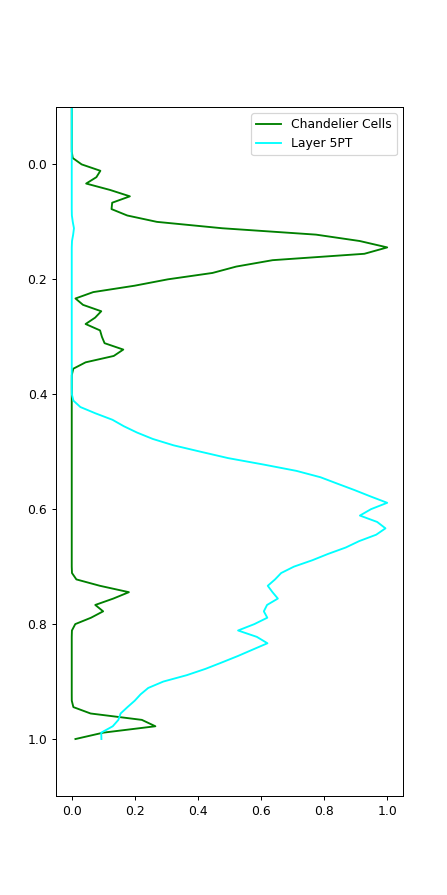

<IPython.core.display.Javascript object>


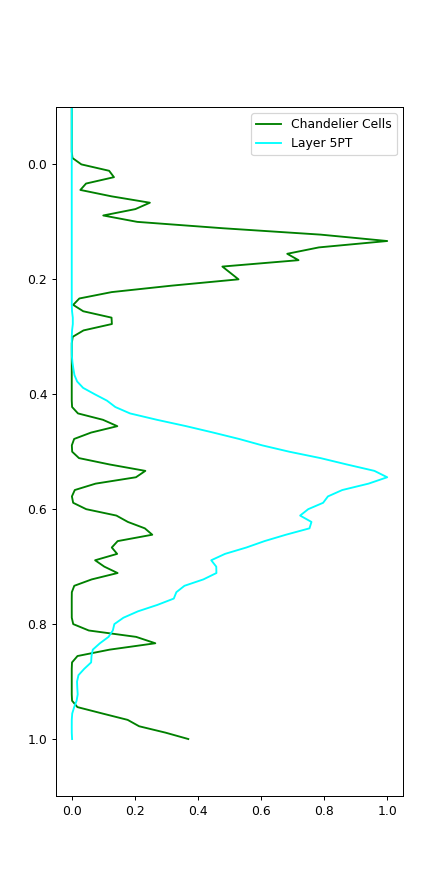

<IPython.core.display.Javascript object>


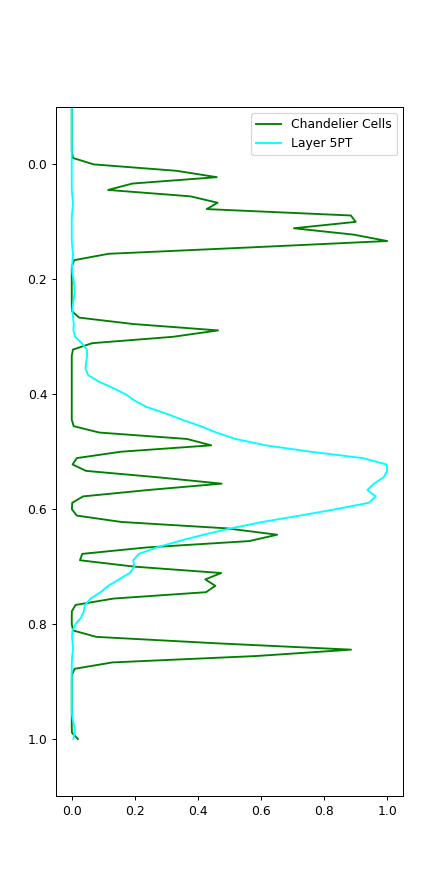

<IPython.core.display.Javascript object>


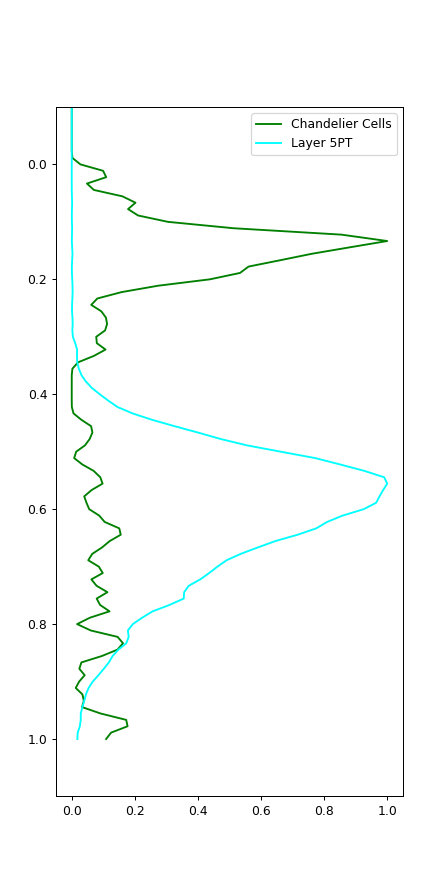

In [14]:
#global depth distributions
bins = np.linspace(-.10,1.0,100)
did_legend = False
for ii,ap in enumerate(["anterior","middle","posterior","all"]):
    
    plt.figure(figsize=[5,10])


    Vsum = np.zeros_like(bins[:-1])
    L6sum = np.zeros_like(bins[:-1])
    Csum = np.zeros_like(bins[:-1])
    L5sum= np.zeros_like(bins[:-1])
    # for ii, x in enumerate(tdf.slice_id.unique()):
    # #     if ii != 30:
    # #          continue
    #     if int(x.split("slice")[-1])>0:
    #         if tdf.loc[tdf["slice_id"]==x].shape[0]>10:


    if ap == "all":
        V0 = do_kde(tdf.loc[tdf["subclass"]=="VLMC"]["normalized_depth"].values,bins =bins ) #, color = "blue")
        L60 = do_kde(tdf.loc[tdf["subclass"]=="L6b"]["normalized_depth"].values,bins = bins) #, color = "red")
        C0 = do_kde(tdf.loc[np.logical_or(tdf["label"]=="Pvalb_11",tdf["label"]=="Pvalb_12")]["normalized_depth"].values,bins = bins) #,color = "green" )
        L50  = do_kde(tdf.loc[tdf["subclass"]=="L5_PT"]["normalized_depth"].values,bins = bins) #, color="c")
        Inh = do_kde(tdf.loc[tdf["class_label"]=="GABAergic"]["normalized_depth"].values,bins = bins)
        Ex = do_kde(tdf.loc[tdf["class_label"]=="Glutamatergic"]["normalized_depth"].values,bins = bins)
        
    else:
        V0 = do_kde(tdf.loc[tdf["AP_group"]==ap].loc[tdf["subclass"]=="VLMC"]["normalized_depth"].values,bins =bins ) #, color = "blue")
        L60 = do_kde(tdf.loc[tdf["AP_group"]==ap].loc[tdf["subclass"]=="L6b"]["normalized_depth"].values,bins = bins) #, color = "red")
        C0 = do_kde(tdf.loc[tdf["AP_group"]==ap].loc[np.logical_or(tdf["label"]=="Pvalb_11",tdf["label"]=="Pvalb_12")]["normalized_depth"].values,bins = bins) #,color = "green" )
        L50  = do_kde(tdf.loc[tdf["AP_group"]==ap].loc[tdf["subclass"]=="L5_PT"]["normalized_depth"].values,bins = bins) #, color="c")
        Inh = do_kde(tdf.loc[tdf["AP_group"]==ap].loc[tdf["class_label"]=="GABAergic"]["normalized_depth"].values,bins = bins)
        Ex = do_kde(tdf.loc[tdf["AP_group"]==ap].loc[tdf["class_label"]=="Glutamatergic"]["normalized_depth"].values,bins = bins)

    Vsum = V0[0]
    L6sum = L60[0]
    Csum = C0[0]
    L5sum = L50[0]
    Inh = Inh[0]
    Ex = Ex[0]


    #         if not did_legend:
    #             plt.legend()
    #             did_legend = True



    #plt.plot( Vsum/Vsum.max(),V0[1], label ="VLMC", color = "grey")
    #plt.plot( L6sum/L6sum.max(), L60[1],label = "Layer6b", color = "grey")
    plt.plot( Csum/Csum.max(), C0[1],label = "Chandelier Cells",color = "green" )
    plt.plot( L5sum/L5sum.max(),L50[1], label = "Layer 5PT", color="cyan")
    #plt.plot( Inh/Inh.max(), bins,label = "Inhibitory Neurons",color = "black" )
    #plt.plot( Ex/Ex.max(),bins, label = "Excitatory Neurons", color="grey")
    plt.gca().set(ylim=[1.1,-0.1])
    plt.legend()

plt.show()               #             tdf.loc[tdf["slice_id"]==x].loc[tdf["subclass"]=="L23_IT"]["normalized_depth"].hist( color="y", histtype = "step", density = True, bins = np.arange(0,1.5,.05))